In [2]:
    import tensorflow as tf
    # include path
    print(tf.sysconfig.get_include())
    # library path 
    print(tf.sysconfig.get_lib())

/home/az/anaconda3/lib/python3.6/site-packages/tensorflow/include
/home/az/anaconda3/lib/python3.6/site-packages/tensorflow


In [5]:
import tensorflow as tf
CUDA_VISIBLE_DEVICES=0
hello = tf.constant('Hello, TensorFlow!')
sess = tf.Session()
print(sess.run(hello))
#python3 -c 'import tensorflow as tf; print(tf.test.is_gpu_available())'


b'Hello, TensorFlow!'


In [20]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 3943453966505037199, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 160497664
 locality {
   bus_id: 1
 }
 incarnation: 6072156216902508267
 physical_device_desc: "device: 0, name: GeForce RTX 2060 SUPER, pci bus id: 0000:01:00.0, compute capability: 7.5"]

In [19]:
print(tf.test.is_gpu_available())
print(tf.test.gpu_device_name())

True
/device:GPU:0


In [5]:
tf.test.is_built_with_cuda()

True

In [2]:
import argparse
import math
from datetime import datetime
#import h5pyprovider
import numpy as np
import tensorflow as tf
import socket
import importlib
import matplotlib.pylab as plt
import os
import pickle
# os.environ['CUDA_DEVICE_ORDER']="PCI_BUS_ID"
# os.environ['CUDA_VISIBLE_DEVICES']="1"

import sys
BASE_DIR = os.path.abspath('')
print(BASE_DIR)
sys.path.append(os.path.join(BASE_DIR, 'models'))
sys.path.append(BASE_DIR) # model
sys.path.append(os.path.join(BASE_DIR, 'tf_utils'))
import provider
import tf_util

/home/az/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/home/az/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


/home/az/Documents/D-FCN


In [2]:
# Argparses
EPOCH_CNT = 0

BATCH_SIZE = 6
NUM_POINT = 2048
MAX_EPOCH = 200
BASE_LEARNING_RATE = .01
# GPU_INDEX = 7
GPU_INDEX = 1
MOMENTUM = 0.9
OPTIMIZER = 'adam'
DECAY_STEP = 20000
DECAY_RATE = 0.5

In [3]:
MODEL = importlib.import_module('DFCN_pointnet2_group2') # import network module
MODEL_FILE = os.path.join(BASE_DIR, 'DFCN_pointnet2_group2'+'.py')
LOG_DIR = 'log_wen_v16_sample8192_group2_lw14_F1_noheight'
if not os.path.exists(LOG_DIR): os.mkdir(LOG_DIR)
os.system('cp models/DFCN_pointnet2.py %s' % (LOG_DIR)) # bkp of model def
os.system('cp tf_utils/DFCN_util_xy2.py %s' % (LOG_DIR)) # bkp of model def
# os.system('cp train_pointsift_lx_npsplit_V16.ipynb %s' % (LOG_DIR)) # bkp of train procedure
LOG_FOUT = open(os.path.join(LOG_DIR, 'log_train.txt'), 'w')
# LOG_FOUT.write(str(FLAGS)+'\n')

BN_INIT_DECAY = 0.5
BN_DECAY_DECAY_RATE = 0.5
BN_DECAY_DECAY_STEP = float(DECAY_STEP)
BN_DECAY_CLIP = 0.99

HOSTNAME = socket.gethostname()

NUM_CLASSES = 9

BASE_DIR /home/az/Documents/D-FCN/tf_utils


In [4]:
def log_string(out_str):
    LOG_FOUT.write(out_str+'\n')
    LOG_FOUT.flush()
    print(out_str)

def get_learning_rate(batch):
    learning_rate = tf.train.exponential_decay(
                        BASE_LEARNING_RATE,  # Base learning rate.
                        batch * BATCH_SIZE,  # Current index into the dataset.
                        DECAY_STEP,          # Decay step.
                        DECAY_RATE,          # Decay rate.
                        staircase=True)
    learning_rate = tf.maximum(learning_rate, 0.00001) # CLIP THE LEARNING RATE!!
    return learning_rate        

def get_bn_decay(batch):
    bn_momentum = tf.train.exponential_decay(
                      BN_INIT_DECAY,
                      batch*BATCH_SIZE,
                      BN_DECAY_DECAY_STEP,
                      BN_DECAY_DECAY_RATE,
                      staircase=True)
    bn_decay = tf.minimum(BN_DECAY_CLIP, 1 - bn_momentum)
    return bn_decay

def Acc_from_confusions(confusions):
    
    TP = np.diagonal(confusions, axis1=-2, axis2=-1)
    TP_plus_FN = np.sum(confusions, axis=-1)
    TP_plus_FP = np.sum(confusions, axis=-2)
    
    mAcc = np.sum(TP)/np.sum(confusions)
    
    precision = TP / (TP_plus_FP + 1e-6)
    recall = TP / (TP_plus_FN+ 1e-6)
    fscore = 2*(precision * recall)/(precision + recall + 1e-6)
    
    ave_F1 = np.mean(fscore)
    
    s = 'Overall accuracy：{:5.2f}  Average F1 score：{:5.2f} \n'.format(100 * mAcc, 100 * ave_F1)
    s += log_acc(precision)
    s += log_acc(recall)
    s += log_acc(fscore)
    
    log_string(s)
    
    return mAcc, ave_F1
    

def log_acc(acc_list):
    s = ""
    for acc in acc_list:
        s += '{:5.2f} '.format(100 * acc)
    s += '\n'
    return s

def pc_normalize(pc):
    l = pc.shape[0]
    centroid = np.mean(pc, axis=0)
    pc = pc - centroid
    m = np.max(np.sqrt(np.sum(pc**2, axis=1)))
    pc = pc / m
    return pc
    
def drawPlot(x,y,name):
    plt.rcParams['savefig.dpi'] = 300 
    plt.plot(np.arange(0,len(x)),x,'k-',alpha=1,label='Train max: '+str(round(max(x),3))+', min: '+str(round(min(x),3)))
    plt.plot(np.arange(0,len(y)),y,'r-',alpha=1,label='Test max: '+str(round(max(y),3))+', min: '+str(round(min(y),3)))
    plt.legend()
    plt.xlabel('epoch',fontsize=9)
    plt.ylabel(name+' value',fontsize=9)
    plt.savefig(LOG_DIR+"/"+name+".png",bbox_inches='tight')
    plt.show()
    
def drawF1Plot(x,name):
    plt.rcParams['savefig.dpi'] = 300 
    plt.plot(np.arange(0,len(x)),x,'k-',alpha=1,label='Train max: '+str(round(max(x),3))+', min: '+str(round(min(x),3)))
    plt.legend()
    plt.xlabel('epoch',fontsize=9)
    plt.ylabel(name+' value',fontsize=9)
    plt.savefig(LOG_DIR+"/"+name+".png",bbox_inches='tight')
    plt.show()
    
    
def placeholder_inputs(batch_size, num_point):
    pointclouds_pl = tf.placeholder(tf.float32, shape=(None, None, 3))
    labels_pl = tf.placeholder(tf.int32, shape=(None, None))
    smpws_pl = tf.placeholder(tf.float32, shape=(None, None))
    return pointclouds_pl, labels_pl, smpws_pl

def pc_normalize_min_max(data):
    mindata = np.min(data[:,:3], axis=0)
    maxdata = np.max(data[:,:3], axis=0)
    return 2*(data[:,:3] - mindata)/(maxdata - mindata)

def pc_normalize_min(data):
    mindata = np.min(data[:,:3], axis=0)
    
    return (data[:,:3] - mindata)

def get_batch(dataset, index, npoints = NUM_POINT):
  
    if(dataset =='train'):
        cub_l = 30.0
        cub_w = 30.0
        cub_h = 100.0
        point_set =  trainSet[:,:3] - np.min(trainSet[:,:3], axis=0)
        semantic_seg = trainSet[:,4].astype(np.int32)
        coordmax = np.max(point_set,axis=0)
        coordmin = np.min(point_set,axis=0)
        smpmin = np.maximum(coordmax-[cub_l,cub_w,cub_h], coordmin)
        smpmin[2] = coordmin[2]
        smpsz = np.minimum(coordmax-smpmin,[cub_l,cub_w,cub_h])
        smpsz[2] = coordmax[2]-coordmin[2]
        isvalid = False
        for i in range(10):
            curcenter = point_set[np.random.choice(len(semantic_seg),1)[0],:]
            curmin = curcenter-[cub_l/2,cub_w/2,cub_h/2]
            curmax = curcenter+[cub_l/2,cub_w/2,cub_h/2]
            curmin[2] = coordmin[2]
            curmax[2] = coordmax[2]
            curchoice = np.sum((point_set>=(curmin-0.0))*(point_set<(curmax+0.0)),axis=1)==3
            cur_point_set = point_set[curchoice,:]
            cur_semantic_seg = semantic_seg[curchoice]
            cur_feat_set = trainFeats[curchoice,:]
    #         if len(cur_semantic_seg)<npoints:
            if len(cur_semantic_seg)==0:
                continue
            mask = np.sum((cur_point_set>=(curmin-0.0))*(cur_point_set<(curmax+0.0)),axis=1)==3
            vidx = np.ceil((cur_point_set[mask,:2]-curmin[:2])/(curmax[:2]-curmin[:2])*[31.0,31.0])
            vidx = np.unique(vidx[:,0]*31.0+vidx[:,1])
            isvalid = np.sum(cur_semantic_seg>-1)/1.0/len(cur_semantic_seg)>=0.7 and len(vidx)/31.0/31.0>=0.3
#             print('isvalid', isvalid,len(vidx)/31.0/31.0,np.sum(cur_semantic_seg>-1),len(cur_semantic_seg))
            if isvalid:
                break
        choice = np.random.choice(len(cur_semantic_seg), npoints, replace=True)
        point_set = cur_point_set[choice,:]
        feature_set = cur_feat_set[choice,:]
        semantic_seg = cur_semantic_seg[choice]
        mask = mask[choice]
        sample_weight = labelweights[semantic_seg]
        sample_weight *= mask
        return point_set, semantic_seg, sample_weight,feature_set
    
    if(dataset =='test'):

        cur_point_set = test_xyz[index]
        cur_semantic_seg = test_label[index].astype(np.int32)
        feature_set = test_feats[index]

        point_set = pc_normalize_min(cur_point_set)
        semantic_seg = cur_semantic_seg # N
        sample_weight = labelweights_t[semantic_seg]
    
        point_sets = np.expand_dims(point_set,0) # 1xNx3
        feature_set = np.expand_dims(feature_set,0) # 1xNx3
        semantic_segs = np.expand_dims(semantic_seg,0)  # 1xN
        sample_weights = np.expand_dims(sample_weight,0)  # 1xN
        return point_sets, semantic_segs, sample_weights,feature_set
    
def get_batch_wdp(dataset, batch_idx):
    bsize = BATCH_SIZE
    batch_data = np.zeros((bsize, NUM_POINT, 3))
    batch_feats = np.zeros((bsize, NUM_POINT, 1))
    batch_label = np.zeros((bsize, NUM_POINT), dtype=np.int32)
    batch_smpw = np.zeros((bsize, NUM_POINT), dtype=np.float32)
    for i in range(bsize):
        ps,seg,smpw,feat = get_batch('train',index=0)
        ps = pc_normalize_min(ps)
        batch_data[i,...] = ps
        batch_label[i,:] = seg
        batch_smpw[i,:] = smpw
        batch_feats[i,:] = feat

        dropout_ratio = np.random.random()*0.875 # 0-0.875
        drop_idx = np.where(np.random.random((ps.shape[0]))<=dropout_ratio)[0]
        batch_data[i,drop_idx,:] = batch_data[i,0,:]
        batch_label[i,drop_idx] = batch_label[i,0]
        batch_smpw[i,drop_idx] *= 0
        
    return batch_data, batch_label, batch_smpw, batch_feats   

In [5]:

# train_f = open('Data/train_merge_min_norm_fea.pickle', 'rb')
# train_xyz, train_label, train_feats = pickle.load(train_f, encoding='bytes')
# train_xyz, train_label, train_feats = pickle.load(train_f)
# train_f.close()

test_f = open('Data/test_merge_min_norm_fea_paper_height.pickle', 'rb')
test_xyz, test_label, test_feats = pickle.load(test_f, encoding='bytes')
test_feats = [tt[:,1:2] for tt in test_feats] #reflectance
test_f.close()

NUM_CLASSES = 9
label_values = range(NUM_CLASSES)

trainSet = np.loadtxt('Data/train_height.pts',skiprows=1)

label_w = trainSet[:,4].astype('uint8')
trainSet[:,3] = trainSet[:,3]/trainSet[:,3].max() #height above ground
trainSet[:,5] = trainSet[:,5]/trainSet[:,5].max() #reflectance

# trainFeats = trainSet[:,[3,5]] #use reflectance and height above ground
trainFeats = trainSet[:,5:6] #only use reflectance

labelweights = np.zeros(9)
tmp,_ = np.histogram(label_w,range(10))
labelweights = tmp
labelweights = labelweights.astype(np.float32)
labelweights = labelweights/np.sum(labelweights)
labelweights = 1/np.log(1.4+labelweights)
print(labelweights)

labelweights_t = np.ones(9)
print(labelweights_t)

[2.9674518 2.0217078 1.9802364 2.9339767 2.874856  2.122891  2.7627096
 2.6275024 2.1882594]
[1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [6]:
def train_one_epoch(sess, ops, train_writer):
    """ ops: dict mapping from string to tf ops """
    is_training = True
    
    log_string('----')
    
   # Shuffle train samples
    train_idxs = np.arange(0, len(train_xyz))
    np.random.shuffle(train_idxs)
    num_batches = len(train_xyz)//BATCH_SIZE
    
    total_correct = 0
    total_seen = 0
    loss_sum = 0
    
    for batch_idx in range(num_batches):
        
        start_idx = batch_idx * BATCH_SIZE
        end_idx = (batch_idx+1) * BATCH_SIZE
        
        batch_data, batch_label, batch_smpw, batch_feats = get_batch_wdp('train', batch_idx)
        
        if batch_idx % (num_batches/2) == 0:
            print('Current batch/total batch num: %d/%d'%(batch_idx,num_batches))
        
        aug_data = provider.rotate_point_cloud_z(batch_data)
        
        feed_dict = {ops['pointclouds_pl']: aug_data,
                     ops['feature_pl']: batch_feats,
                     ops['labels_pl']: batch_label,
                     ops['smpws_pl']: batch_smpw,
                     ops['is_training_pl']: is_training,}
        summary, step, _, loss_val, pred_val, lr_val = sess.run([ops['merged'], ops['step'], ops['train_op'], ops['loss'], ops['pred'], ops['learnrate']],
                                         feed_dict=feed_dict)
        train_writer.add_summary(summary, step)
        pred_val = np.argmax(pred_val, 2)
        correct = np.sum(pred_val == batch_label)
        total_correct += correct
        total_seen += (BATCH_SIZE*NUM_POINT)
        loss_sum += loss_val
        
    log_string('learn rate: %f' % (lr_val))
    log_string('mean loss: %f' % (loss_sum / float(num_batches)))
    log_string('accuracy: %f' % (total_correct / float(total_seen)))
    
    mloss = loss_sum / float(num_batches)
    macc = total_correct / float(total_seen)
    return mloss, macc

def eval_one_epoch_whole_scene(sess, ops, test_writer):
    """ ops: dict mapping from string to tf ops """
    is_training = False
    total_correct = 0
    total_seen = 0
    loss_sum = 0
    total_seen_class = [0 for _ in range(NUM_CLASSES)]
    total_correct_class = [0 for _ in range(NUM_CLASSES)]
    
    log_string('----')
    
    test_idxs = np.arange(0, len(test_xyz))
    
    TEST_BATCH_SIZE = 1
    num_batches = len(test_xyz)
    
    Confs = []
    
    
    is_continue_batch = False
    
    for batch_idx in range(num_batches):
        
        batch_data, batch_label, batch_smpw, batch_feats = get_batch('test', batch_idx)
        
#         print('Current start end /total batch num: %d %d/%d'%(start_idx, end_idx, num_batches))
        
        aug_data = batch_data
        
#         aug_data = provider.rotate_point_cloud_z(batch_data)
        
        feed_dict = {ops['pointclouds_pl']: aug_data,
                     ops['feature_pl']: batch_feats,
                     ops['labels_pl']: batch_label,
                     ops['smpws_pl']: batch_smpw,
                     ops['is_training_pl']: is_training}
        summary, step, loss_val, pred_val, lr_val = sess.run([ops['merged'], ops['step'], ops['loss'], ops['pred'], ops['learnrate']],
                                      feed_dict=feed_dict)
        test_writer.add_summary(summary, step)
        pred_val = np.argmax(pred_val, 2)
        correct = np.sum(pred_val == batch_label)
        total_correct += correct
        total_seen += batch_data.shape[1]
        loss_sum += loss_val
        
        NUM_POINT_fact = batch_data.shape[1]
        for i in range(TEST_BATCH_SIZE):
            for j in range(NUM_POINT_fact):
                l = batch_label[i, j]
                total_seen_class[l] += 1
                total_correct_class[l] += (pred_val[i, j] == l)
                
        from sklearn.metrics import confusion_matrix
        Confs += [confusion_matrix(batch_label.flatten(), pred_val.flatten(), label_values)]
        
    C = np.sum(np.stack(Confs), axis=0).astype(np.float32)
    oa, avgF1 = Acc_from_confusions(C)
    
    log_string('learn rate: %f' % (lr_val))
    log_string('eval mean loss: %f' % (loss_sum / float(num_batches)))
    log_string('eval accuracy: %f'% (total_correct / float(total_seen)))
    log_string('eval avg class acc: %f' % (np.mean(np.array(total_correct_class)/np.array(total_seen_class,dtype=np.float))))
    
    mloss = loss_sum / float(num_batches)
    macc = total_correct / float(total_seen)
    return oa, avgF1

In [7]:
pointclouds_pl, labels_pl, smpws_pl = placeholder_inputs(BATCH_SIZE, NUM_POINT)
feature_pl = tf.placeholder(tf.float32, shape=(None, None, 1))
is_training_pl = tf.placeholder(tf.bool, shape=())

# Note the global_step=batch parameter to minimize. 
# That tells the optimizer to helpfully increment the 'batch' parameter for you every time it trains.
batch = tf.Variable(0)
bn_decay = get_bn_decay(batch)
tf.summary.scalar('bn_decay', bn_decay)

# Get model and loss 
pred, end_points = MODEL.get_model(pointclouds_pl, is_training_pl, NUM_CLASSES, bn_decay=bn_decay, feature=feature_pl)
loss = MODEL.get_loss(pred, labels_pl, smpws_pl)

tf.summary.scalar('loss', loss)

correct = tf.equal(tf.argmax(pred, 2), tf.to_int64(labels_pl))
accuracy = tf.reduce_sum(tf.cast(correct, tf.float32)) / float(BATCH_SIZE*NUM_POINT)
tf.summary.scalar('accuracy', accuracy)

# Get training operator
learning_rate = get_learning_rate(batch)
tf.summary.scalar('learning_rate', learning_rate)
if OPTIMIZER == 'momentum':
    optimizer = tf.train.MomentumOptimizer(learning_rate, momentum=MOMENTUM)
elif OPTIMIZER == 'adam':
    optimizer = tf.train.AdamOptimizer(learning_rate)
train_op = optimizer.minimize(loss, global_step=batch)

# Add ops to save and restore all the variables.
saver = tf.train.Saver()

In [21]:
## Create a session
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.allow_soft_placement = True
config.log_device_placement = True
sess = tf.Session(config=config)
print(tf.test.is_gpu_available())

True


In [22]:
## Add summary writers
merged = tf.summary.merge_all()
train_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'train'),
                          sess.graph)
test_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'test'))
print(tf.test.is_gpu_available())

True


In [24]:
## Init variables
init = tf.global_variables_initializer()
sess.run(init, {is_training_pl:True})
print(tf.test.is_gpu_available())

True


In [25]:
##
ops = {'pointclouds_pl': pointclouds_pl,
       'labels_pl': labels_pl,
       'feature_pl': feature_pl,
       'smpws_pl': smpws_pl,
       'is_training_pl': is_training_pl,
       'pred': pred,
       'loss': loss,
       'train_op': train_op,
       'merged': merged,
       'step': batch,
       'learnrate': learning_rate}
print(tf.test.is_gpu_available())

True


In [26]:
##
train_acc_list=[]
test_acc_list=[]
train_loss_list=[]
test_F1_list=[]
print(tf.test.is_gpu_available())

True


In [9]:
# Create a session
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.allow_soft_placement = True
config.log_device_placement = True
sess = tf.Session(config=config)

# Add summary writers
merged = tf.summary.merge_all()
train_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'train'),
                          sess.graph)
test_writer = tf.summary.FileWriter(os.path.join(LOG_DIR, 'test'))

# Init variables
init = tf.global_variables_initializer()
sess.run(init, {is_training_pl:True})

ops = {'pointclouds_pl': pointclouds_pl,
       'labels_pl': labels_pl,
       'feature_pl': feature_pl,
       'smpws_pl': smpws_pl,
       'is_training_pl': is_training_pl,
       'pred': pred,
       'loss': loss,
       'train_op': train_op,
       'merged': merged,
       'step': batch,
       'learnrate': learning_rate}

train_acc_list=[]
test_acc_list=[]
train_loss_list=[]
test_F1_list=[]

In [11]:
train_xyz,train_label,train_weights,train_feats = [],[],[],[]
num_train_samples = 1000
for i in range(num_train_samples):
    train_point_set, train_semantic_seg, train_sample_weight, train_feature_set = get_batch('train',0,
                                                                                            npoints=NUM_POINT)
    train_xyz.append(train_point_set)
    train_label.append(train_semantic_seg)
    train_weights.append(train_sample_weight)
    train_feats.append(train_feature_set)

**** EPOCH 000 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 2.510697
accuracy: 0.569137
----
Overall accuracy：68.45  Average F1 score：36.46 
 0.00 63.93 79.37  0.00  0.00 79.01 56.68 32.21 51.40 
 0.00 78.67 89.56  0.00  0.00 73.10 10.09 34.83 43.11 
 0.00 70.54 84.16  0.00  0.00 75.94 17.14 33.46 46.89 

learn rate: 0.010000
eval mean loss: 0.909896
eval accuracy: 0.684526
eval avg class acc: 0.365943


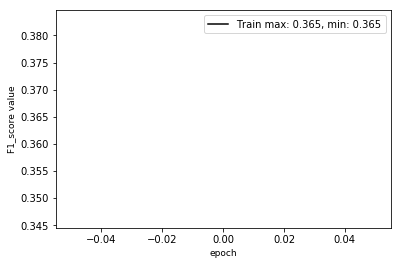

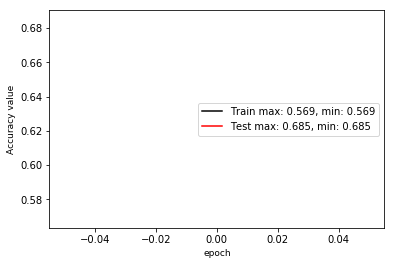

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_000.ckpt
Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 001 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.981967
accuracy: 0.634092
----
Overall accuracy：70.61  Average F1 score：43.10 
 0.00 68.94 85.05 60.15  0.00 89.09 60.90 31.84 48.80 
 0.00 80.72 88.00 19.74  0.00 67.70 19.02 42.89 62.66 
 0.00 74.37 86.50 29.73  0.00 76.94 28.99 36.55 54.87 

learn rate: 0.010000
eval mean loss: 0.810350
eval accuracy: 0.706121
eval avg class acc: 0.423039


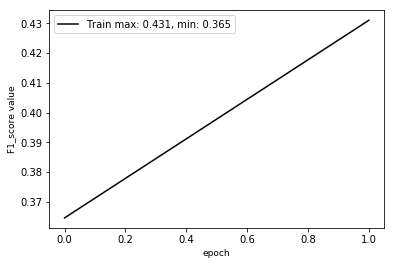

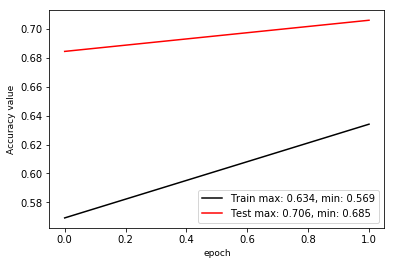

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_001.ckpt
**** EPOCH 002 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.785665
accuracy: 0.631214
----
Overall accuracy：73.32  Average F1 score：46.55 
 0.00 80.51 84.56 52.33  0.00 91.65 51.46 34.72 48.61 
 0.00 72.35 91.41 33.04  0.00 73.92 25.77 43.43 76.95 
 0.00 76.22 87.85 40.50  0.00 81.84 34.34 38.59 59.58 

learn rate: 0.010000
eval mean loss: 0.715475
eval accuracy: 0.733166
eval avg class acc: 0.463184


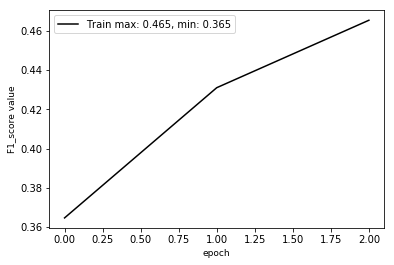

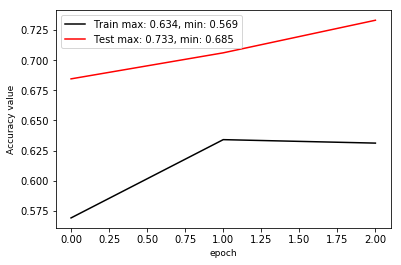

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_002.ckpt
**** EPOCH 003 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.728534
accuracy: 0.681520
----
Overall accuracy：71.80  Average F1 score：41.32 
 0.00 77.24 92.73 85.71  0.00 94.97 34.47 24.58 46.40 
 0.00 72.39 82.25  0.49  0.00 75.22 44.36 27.69 85.56 
 0.00 74.73 87.18  0.97  0.00 83.95 38.80 26.04 60.17 

learn rate: 0.010000
eval mean loss: 0.781456
eval accuracy: 0.717995
eval avg class acc: 0.431055


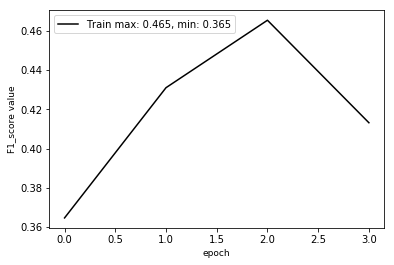

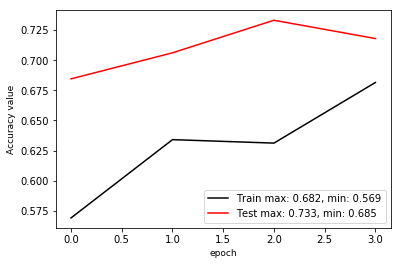

**** EPOCH 004 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.587567
accuracy: 0.673336
----
Overall accuracy：74.68  Average F1 score：43.78 
 0.00 78.29 89.72 91.00  0.00 92.27 56.23 31.41 52.89 
 0.00 74.25 88.04  2.45  0.00 76.24 30.55 38.97 88.71 
 0.00 76.21 88.87  4.78  0.00 83.49 39.59 34.79 66.27 

learn rate: 0.010000
eval mean loss: 0.730646
eval accuracy: 0.746843
eval avg class acc: 0.443564


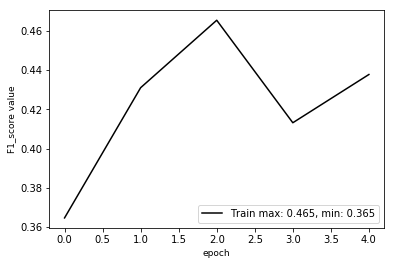

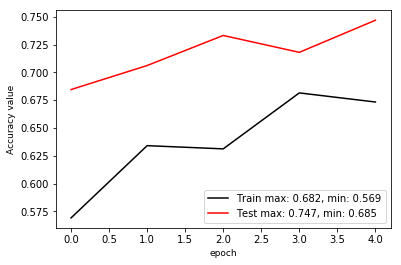

**** EPOCH 005 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.488819
accuracy: 0.723552
----
Overall accuracy：72.06  Average F1 score：45.83 
 0.00 77.26 92.20 75.33  0.00 92.84 49.38 19.56 50.64 
 0.00 54.51 84.40 21.41  0.00 85.73 48.81 29.81 91.58 
 0.00 63.92 88.13 33.35  0.00 89.14 49.09 23.62 65.22 

learn rate: 0.010000
eval mean loss: 0.798400
eval accuracy: 0.720618
eval avg class acc: 0.462505


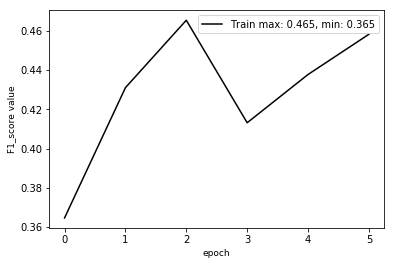

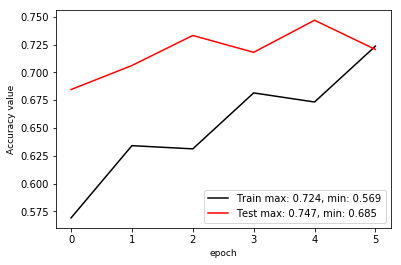

**** EPOCH 006 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.385711
accuracy: 0.716957
----
Overall accuracy：69.97  Average F1 score：44.16 
 0.00 77.36 89.48 73.17 14.66 97.03 36.89 34.16 42.28 
 0.00 78.51 88.86 21.84  2.48 53.95 34.21 26.29 91.85 
 0.00 77.93 89.17 33.64  4.24 69.34 35.50 29.71 57.91 

learn rate: 0.010000
eval mean loss: 1.024641
eval accuracy: 0.699740
eval avg class acc: 0.442213


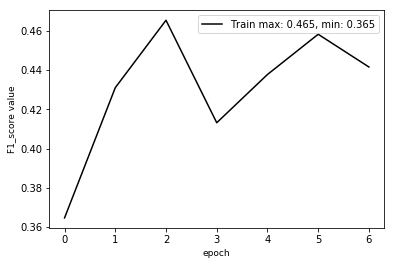

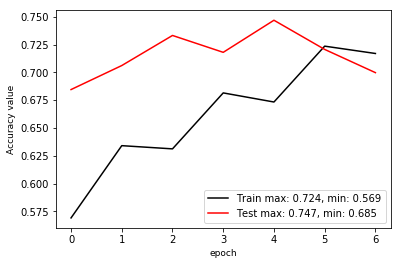

**** EPOCH 007 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.326093
accuracy: 0.733987
----
Overall accuracy：76.21  Average F1 score：50.55 
 0.00 83.20 85.55 56.27 16.12 94.23 35.67 33.76 58.34 
 0.00 70.12 92.89 47.65  5.98 78.48 63.68 22.45 90.96 
 0.00 76.10 89.07 51.61  8.73 85.64 45.73 26.97 71.09 

learn rate: 0.010000
eval mean loss: 0.703092
eval accuracy: 0.762103
eval avg class acc: 0.524695


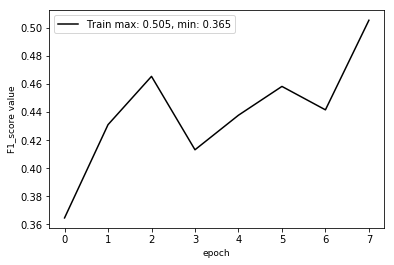

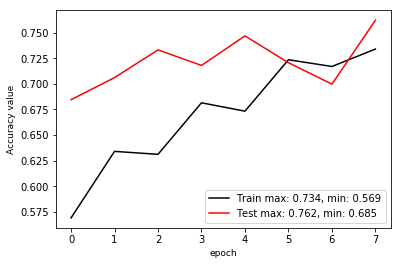

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_007.ckpt
**** EPOCH 008 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.254151
accuracy: 0.734950
----
Overall accuracy：77.79  Average F1 score：47.91 
 0.00 82.25 88.81 86.87  0.00 89.05 28.37 32.57 78.01 
 0.00 71.87 90.18 13.92  0.00 93.11 66.11 44.33 68.09 
 0.00 76.71 89.49 23.99  0.00 91.03 39.70 37.55 72.71 

learn rate: 0.010000
eval mean loss: 0.642020
eval accuracy: 0.777929
eval avg class acc: 0.497339


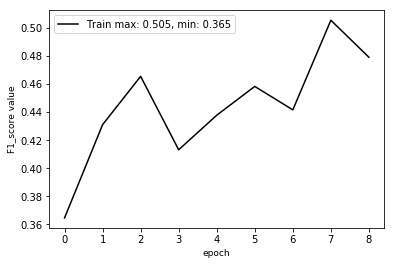

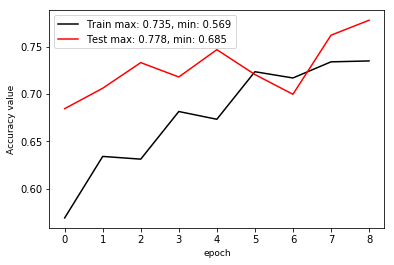

**** EPOCH 009 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.270661
accuracy: 0.727665
----
Overall accuracy：76.37  Average F1 score：48.55 
 0.00 75.43 94.51 75.97 13.50 95.33 43.88 28.76 66.86 
 0.00 75.94 81.10 11.08  2.38 83.86 58.41 51.06 83.96 
 0.00 75.68 87.29 19.35  4.05 89.23 50.11 36.80 74.44 

learn rate: 0.010000
eval mean loss: 0.685360
eval accuracy: 0.763713
eval avg class acc: 0.497543


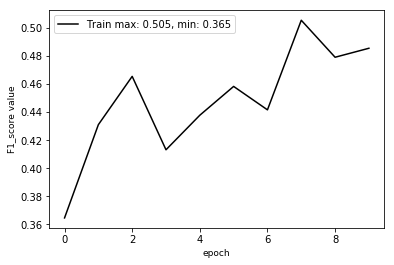

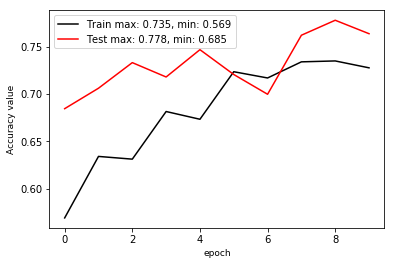

**** EPOCH 010 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.215802
accuracy: 0.735028
----
Overall accuracy：75.63  Average F1 score：49.54 
 0.00 83.54 88.45 67.25  0.00 95.51 38.34 27.65 55.60 
 0.00 65.60 91.41 38.16  0.00 81.45 64.07 31.52 88.87 
 0.00 73.49 89.90 48.69  0.00 87.92 47.97 29.45 68.40 

learn rate: 0.010000
eval mean loss: 0.711135
eval accuracy: 0.756330
eval avg class acc: 0.512301


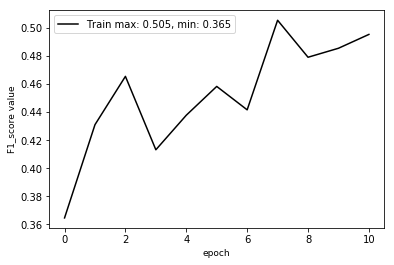

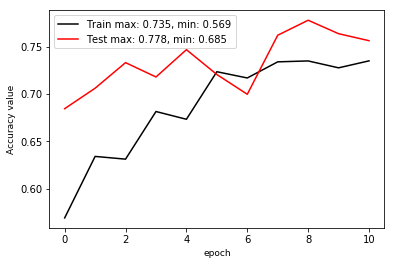

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 011 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.136373
accuracy: 0.754731
----
Overall accuracy：78.49  Average F1 score：49.96 
100.00 84.07 88.81 86.42  0.41 85.87 36.62 31.97 73.25 
 0.17 71.86 90.55 24.19  0.01 93.13 62.76 36.14 76.37 
 0.33 77.49 89.67 37.80  0.03 89.35 46.25 33.93 74.78 

learn rate: 0.010000
eval mean loss: 0.617190
eval accuracy: 0.784883
eval avg class acc: 0.505762


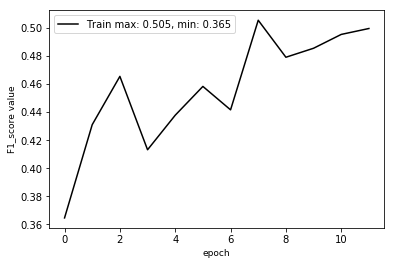

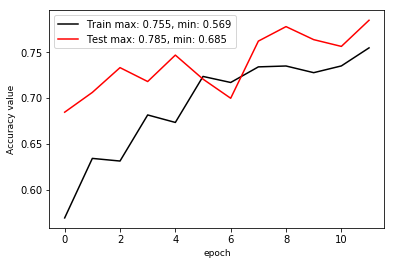

**** EPOCH 012 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.163370
accuracy: 0.755207
----
Overall accuracy：76.85  Average F1 score：49.44 
71.15 75.99 95.19 86.80  0.51 87.81 36.92 31.14 77.28 
 6.17 76.87 80.64 12.94  0.01 92.49 58.91 56.35 66.99 
11.35 76.43 87.31 22.53  0.03 90.09 45.39 40.11 71.77 

learn rate: 0.010000
eval mean loss: 0.692529
eval accuracy: 0.768481
eval avg class acc: 0.501528


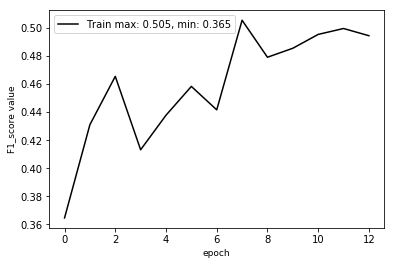

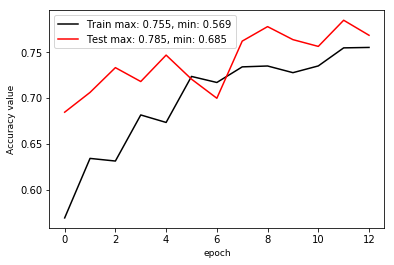

**** EPOCH 013 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.126075
accuracy: 0.767353
----
Overall accuracy：76.59  Average F1 score：50.63 
 0.00 85.17 90.34 74.63  6.21 94.30 39.37 25.02 58.16 
 0.00 62.82 91.10 43.72  0.13 87.52 61.20 31.80 89.61 
 0.00 72.31 90.72 55.14  0.26 90.78 47.91 28.01 70.54 

learn rate: 0.010000
eval mean loss: 0.675844
eval accuracy: 0.765894
eval avg class acc: 0.519897


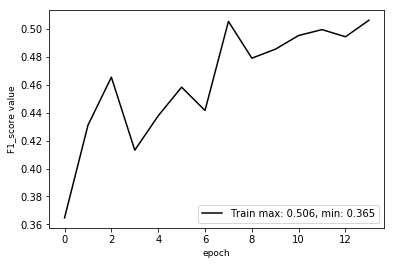

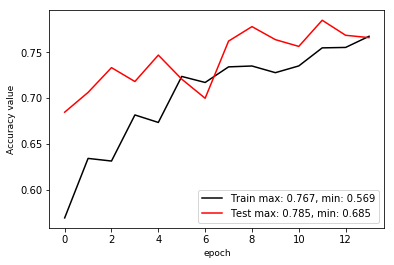

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_013.ckpt
**** EPOCH 014 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.053089
accuracy: 0.790537
----
Overall accuracy：75.32  Average F1 score：49.29 
69.23 78.86 93.28 86.11  0.64 78.65 40.61 31.98 77.28 
 1.50 77.79 70.60 19.90  0.01 91.51 62.99 49.19 76.53 
 2.94 78.32 80.37 32.33  0.03 84.60 49.38 38.76 76.90 

learn rate: 0.010000
eval mean loss: 0.753255
eval accuracy: 0.753172
eval avg class acc: 0.500036


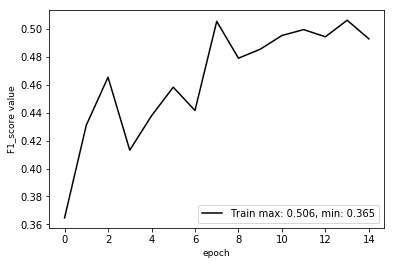

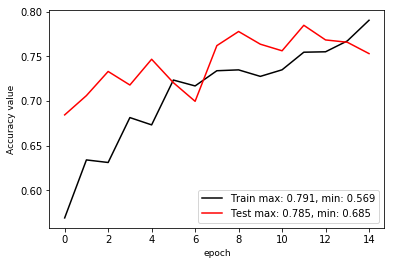

**** EPOCH 015 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.070504
accuracy: 0.787980
----
Overall accuracy：74.75  Average F1 score：49.42 
 0.00 72.91 93.56 85.55  4.05 95.28 34.41 27.08 66.97 
 0.00 70.74 77.22 29.21  0.18 85.38 67.18 45.44 85.15 
 0.00 71.81 84.60 43.55  0.34 90.06 45.51 33.94 74.97 

learn rate: 0.010000
eval mean loss: 0.695814
eval accuracy: 0.747467
eval avg class acc: 0.511644


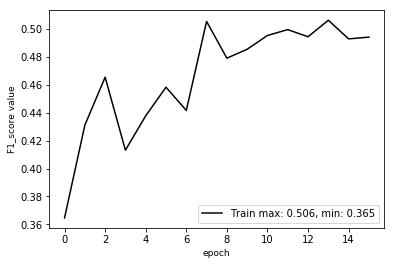

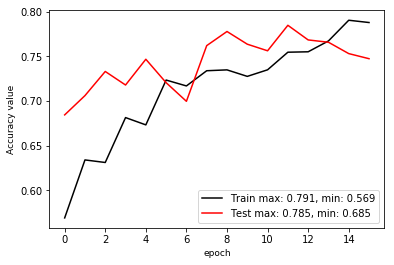

**** EPOCH 016 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.017785
accuracy: 0.772292
----
Overall accuracy：79.83  Average F1 score：58.13 
49.59 84.50 86.57 84.18 20.70 93.55 32.32 36.97 75.03 
49.83 74.27 92.47 29.99  7.90 90.83 71.57 32.97 80.82 
49.71 79.06 89.42 44.22 11.43 92.17 44.53 34.85 77.81 

learn rate: 0.010000
eval mean loss: 0.595850
eval accuracy: 0.798317
eval avg class acc: 0.589600


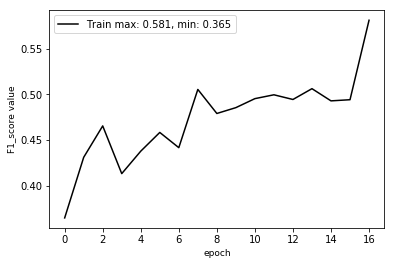

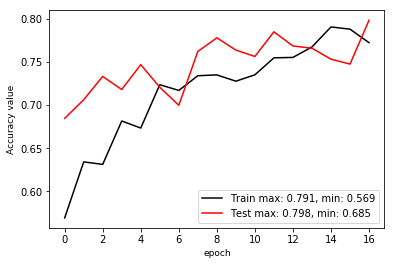

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_016.ckpt
**** EPOCH 017 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.005202
accuracy: 0.784717
----
Overall accuracy：78.16  Average F1 score：56.64 
41.99 79.17 92.71 74.19 16.87 96.56 47.74 31.14 63.07 
21.83 80.27 86.40 46.66  2.64 81.98 60.76 41.71 84.56 
28.73 79.71 89.45 57.28  4.57 88.67 53.47 35.66 72.25 

learn rate: 0.010000
eval mean loss: 0.633287
eval accuracy: 0.781628
eval avg class acc: 0.563122


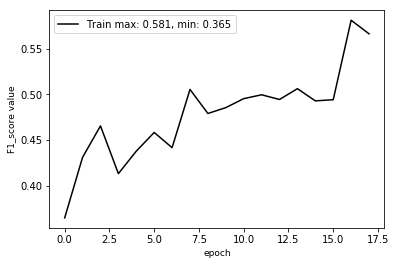

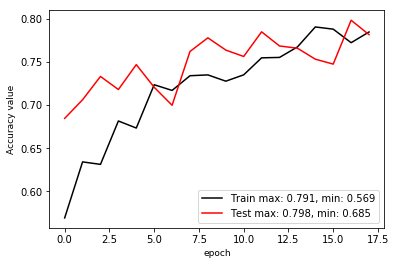

**** EPOCH 018 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 1.035855
accuracy: 0.767516
----
Overall accuracy：81.35  Average F1 score：55.19 
67.82 78.66 93.40 88.50 12.69 93.11 55.09 34.41 73.95 
 9.83 82.79 86.67 28.24  1.12 93.40 55.02 40.13 84.20 
17.18 80.67 89.91 42.81  2.06 93.26 55.05 37.05 78.74 

learn rate: 0.010000
eval mean loss: 0.552902
eval accuracy: 0.813487
eval avg class acc: 0.534887


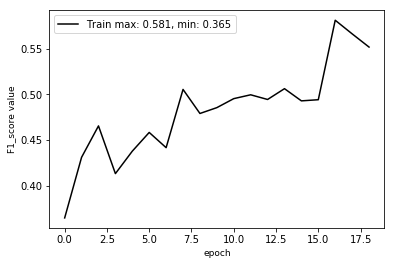

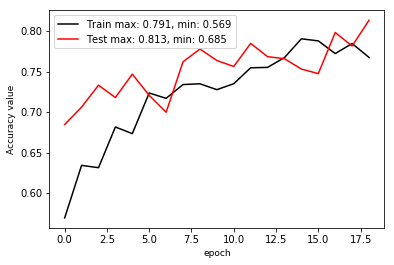

**** EPOCH 019 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.010000
mean loss: 0.969181
accuracy: 0.809679
----
Overall accuracy：78.49  Average F1 score：58.08 
64.71 84.75 86.55 72.29 17.30 91.36 36.31 36.07 71.86 
29.33 75.22 94.15 56.42  0.74 85.20 63.88 52.45 69.15 
40.37 79.70 90.19 63.37  1.42 88.17 46.30 42.74 70.47 

learn rate: 0.010000
eval mean loss: 0.623966
eval accuracy: 0.784907
eval avg class acc: 0.585039


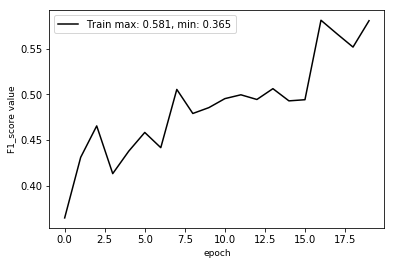

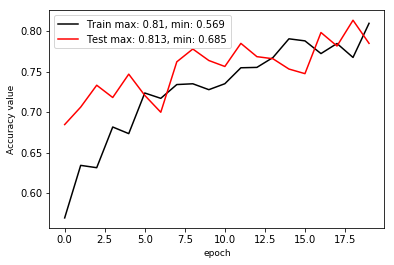

**** EPOCH 020 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.896677
accuracy: 0.810417
----
Overall accuracy：81.25  Average F1 score：62.32 
68.39 86.06 88.64 85.91 36.74 90.41 45.10 34.30 83.24 
39.67 73.80 93.02 44.71 11.18 95.52 61.35 50.14 74.89 
50.21 79.46 90.78 58.82 17.15 92.90 51.99 40.73 78.84 

learn rate: 0.005000
eval mean loss: 0.537638
eval accuracy: 0.812494
eval avg class acc: 0.604751


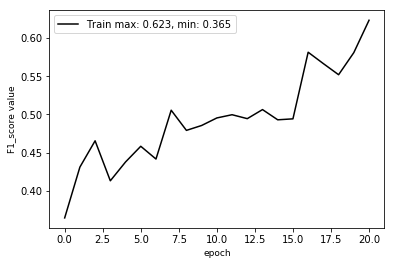

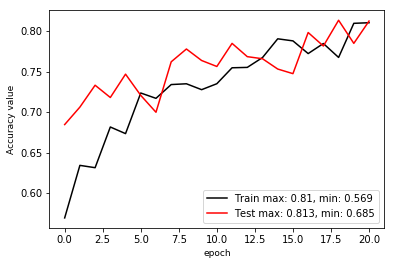

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_020.ckpt
Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 021 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.879381
accuracy: 0.821198
----
Overall accuracy：78.57  Average F1 score：58.12 
65.23 80.58 94.11 93.51 30.04 90.59 31.54 32.39 82.60 
42.83 78.47 86.34 29.94  6.63 93.91 69.57 54.67 59.63 
51.71 79.51 90.06 45.35 10.86 92.22 43.41 40.68 69.26 

learn rate: 0.005000
eval mean loss: 0.616462
eval accuracy: 0.785658
eval avg class acc: 0.579979


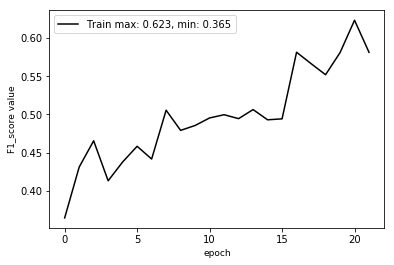

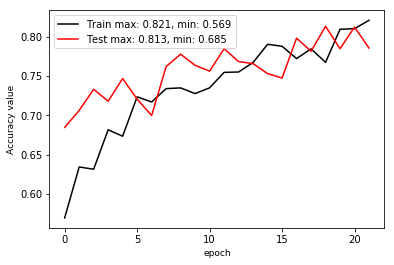

**** EPOCH 022 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.855065
accuracy: 0.827091
----
Overall accuracy：81.18  Average F1 score：61.45 
63.36 84.42 91.45 85.55 27.38 93.29 42.01 32.63 79.60 
52.17 75.26 90.96 44.88  0.97 93.37 67.18 49.99 79.99 
57.22 79.58 91.20 58.87  1.87 93.33 51.69 39.49 79.79 

learn rate: 0.005000
eval mean loss: 0.536425
eval accuracy: 0.811790
eval avg class acc: 0.616399


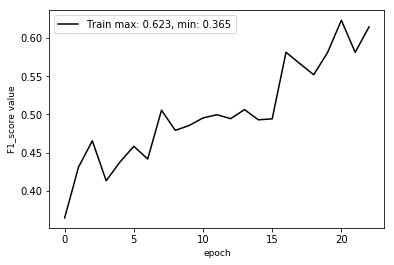

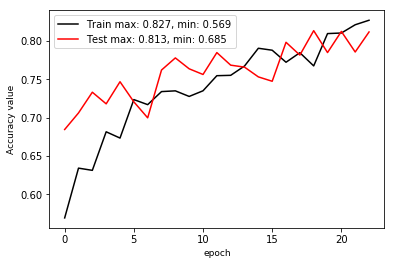

**** EPOCH 023 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.872129
accuracy: 0.815170
----
Overall accuracy：82.34  Average F1 score：63.03 
67.37 83.12 91.84 76.35 36.16 95.41 49.58 35.55 77.39 
47.83 80.82 91.63 47.71  5.46 91.04 62.04 48.35 83.22 
55.95 81.95 91.73 58.72  9.48 93.17 55.11 40.97 80.20 

learn rate: 0.005000
eval mean loss: 0.516423
eval accuracy: 0.823443
eval avg class acc: 0.620095


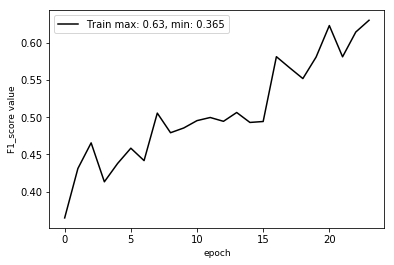

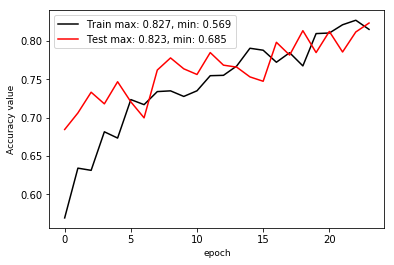

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_023.ckpt
**** EPOCH 024 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.933014
accuracy: 0.812700
----
Overall accuracy：79.82  Average F1 score：58.46 
55.33 83.77 90.99 77.00 10.71 93.97 43.60 34.28 64.92 
31.17 78.17 91.33 53.80  0.28 84.77 62.21 36.17 88.09 
39.87 80.88 91.16 63.34  0.55 89.13 51.27 35.20 74.75 

learn rate: 0.005000
eval mean loss: 0.573073
eval accuracy: 0.798239
eval avg class acc: 0.584427


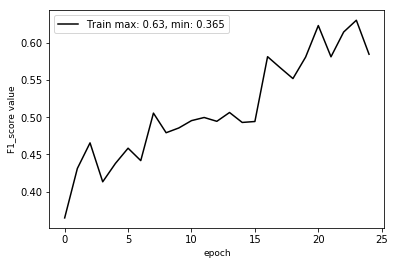

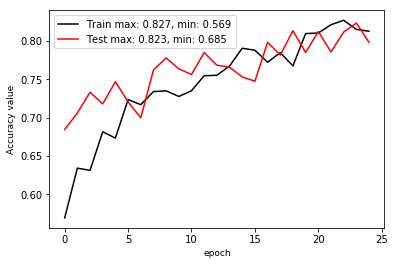

**** EPOCH 025 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.918951
accuracy: 0.806854
----
Overall accuracy：80.13  Average F1 score：59.35 
66.34 81.14 92.90 70.16 33.79 94.71 51.01 33.53 70.10 
22.67 76.22 86.97 52.89  3.99 89.52 59.64 48.88 86.98 
33.79 78.60 89.83 60.31  7.13 92.04 54.99 39.78 77.64 

learn rate: 0.005000
eval mean loss: 0.604933
eval accuracy: 0.801319
eval avg class acc: 0.586393


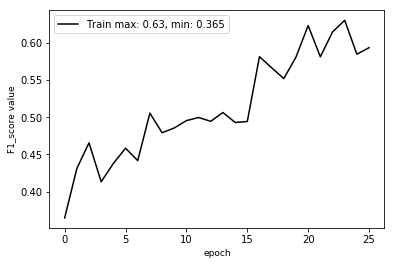

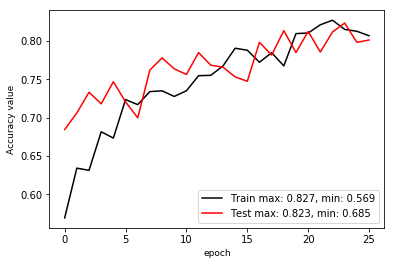

**** EPOCH 026 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.852097
accuracy: 0.824680
----
Overall accuracy：78.06  Average F1 score：53.54 
66.67 84.37 91.84 68.95 29.69 93.87 52.98 26.71 62.67 
 2.33 69.54 89.91 43.18  3.69 86.44 56.63 40.14 89.64 
 4.51 76.24 90.86 53.10  6.57 90.00 54.74 32.08 73.77 

learn rate: 0.005000
eval mean loss: 0.641780
eval accuracy: 0.780620
eval avg class acc: 0.535003


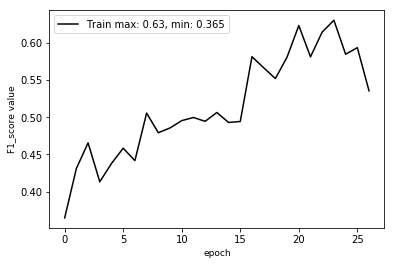

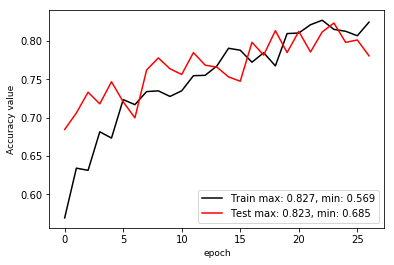

**** EPOCH 027 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.840590
accuracy: 0.816649
----
Overall accuracy：81.63  Average F1 score：61.18 
68.11 84.26 88.37 80.07 62.50 95.28 44.87 38.40 75.47 
21.00 78.89 93.90 52.56  9.36 88.25 66.64 48.51 80.99 
32.10 81.49 91.05 63.46 16.29 91.63 53.63 42.86 78.13 

learn rate: 0.005000
eval mean loss: 0.532467
eval accuracy: 0.816254
eval avg class acc: 0.600127


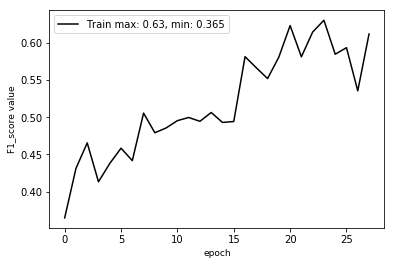

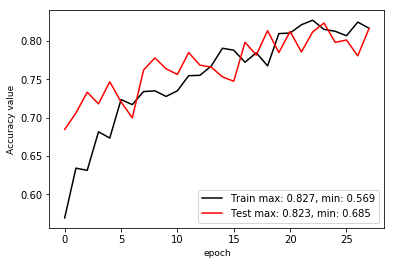

**** EPOCH 028 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.814260
accuracy: 0.827419
----
Overall accuracy：81.51  Average F1 score：61.92 
69.84 83.74 90.87 93.13 44.74 94.68 49.46 36.36 73.35 
36.67 80.16 92.29 39.46  7.96 87.94 64.97 49.05 82.45 
48.09 81.91 91.57 55.43 13.52 91.19 56.17 41.76 77.63 

learn rate: 0.005000
eval mean loss: 0.542835
eval accuracy: 0.815073
eval avg class acc: 0.601051


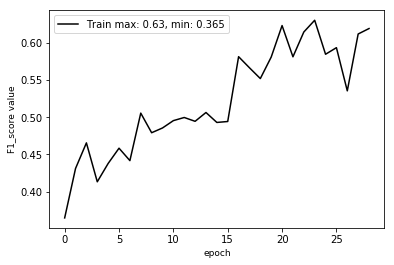

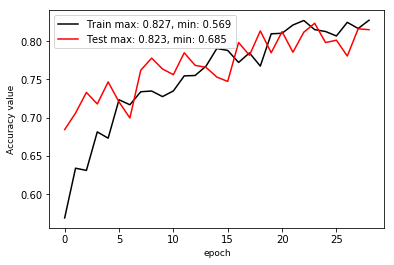

**** EPOCH 029 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.824092
accuracy: 0.838175
----
Overall accuracy：80.64  Average F1 score：58.79 
70.50 79.83 93.02 95.52 38.80 92.44 34.89 33.79 81.07 
30.67 82.15 87.90 37.35  4.37 92.65 67.08 41.27 74.83 
42.74 80.98 90.39 53.70  7.85 92.54 45.90 37.15 77.83 

learn rate: 0.005000
eval mean loss: 0.569019
eval accuracy: 0.806359
eval avg class acc: 0.575851


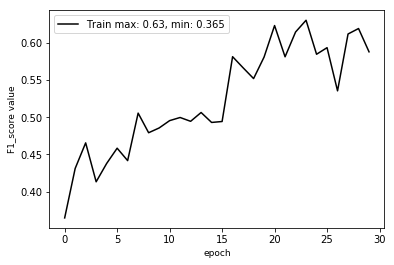

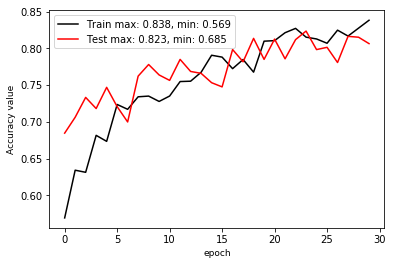

**** EPOCH 030 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.797669
accuracy: 0.827505
----
Overall accuracy：81.34  Average F1 score：62.10 
70.68 81.62 92.37 78.96 56.88 95.71 37.38 36.82 74.06 
31.33 82.18 90.16 64.08  8.69 89.17 70.15 39.77 80.48 
43.42 81.90 91.25 70.75 15.08 92.32 48.77 38.24 77.14 

learn rate: 0.005000
eval mean loss: 0.533056
eval accuracy: 0.813385
eval avg class acc: 0.617797


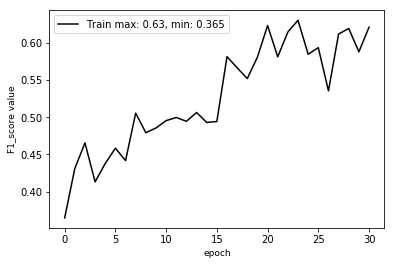

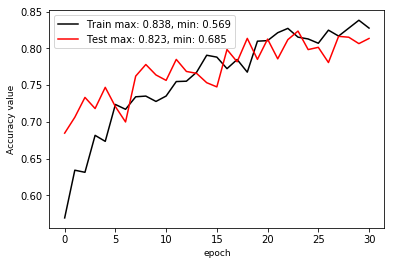

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 031 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.791113
accuracy: 0.848815
----
Overall accuracy：79.93  Average F1 score：61.43 
52.16 86.55 86.20 86.15 48.65 94.88 52.25 36.01 67.79 
30.17 74.06 95.05 61.38  5.85 84.65 61.64 50.84 81.72 
38.23 79.82 90.41 71.68 10.44 89.48 56.56 42.16 74.11 

learn rate: 0.005000
eval mean loss: 0.600433
eval accuracy: 0.799271
eval avg class acc: 0.605954


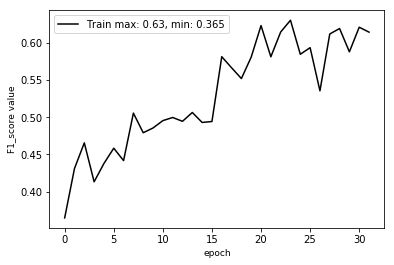

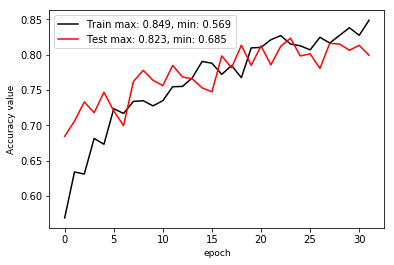

**** EPOCH 032 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.781206
accuracy: 0.836021
----
Overall accuracy：77.97  Average F1 score：61.10 
70.47 82.65 92.50 78.65 48.07 96.13 54.00 25.93 63.08 
40.17 68.68 88.45 57.93  7.90 86.32 57.46 42.11 90.39 
51.17 75.02 90.43 66.72 13.56 90.96 55.67 32.09 74.30 

learn rate: 0.005000
eval mean loss: 0.618368
eval accuracy: 0.779688
eval avg class acc: 0.599340


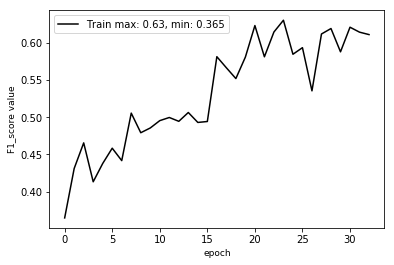

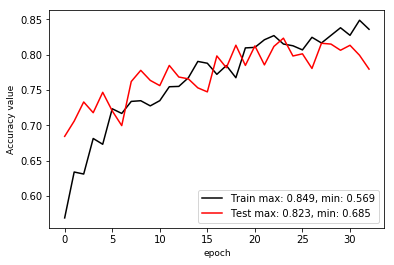

**** EPOCH 033 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.835494
accuracy: 0.821579
----
Overall accuracy：76.91  Average F1 score：53.25 
70.08 79.64 91.81 95.32 59.53 90.85 21.93 35.68 80.46 
14.83 81.10 88.80 30.23  8.80 91.89 74.53 45.13 45.02 
24.48 80.36 90.28 45.90 15.33 91.37 33.89 39.86 57.73 

learn rate: 0.005000
eval mean loss: 0.660313
eval accuracy: 0.769096
eval avg class acc: 0.533710


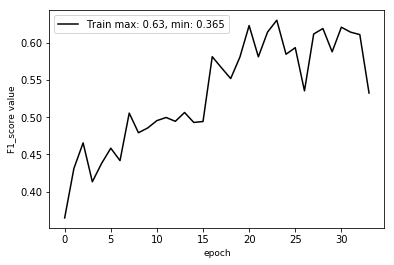

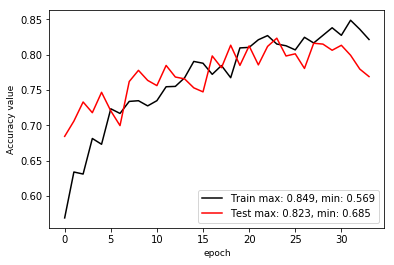

**** EPOCH 034 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.794264
accuracy: 0.850825
----
Overall accuracy：80.80  Average F1 score：60.49 
66.47 86.59 88.16 87.45 80.31 94.33 37.73 35.41 81.59 
18.50 74.52 94.61 65.56  4.12 90.98 69.06 59.40 70.21 
28.94 80.10 91.27 74.94  7.84 92.63 48.80 44.37 75.47 

learn rate: 0.005000
eval mean loss: 0.554406
eval accuracy: 0.807971
eval avg class acc: 0.607738


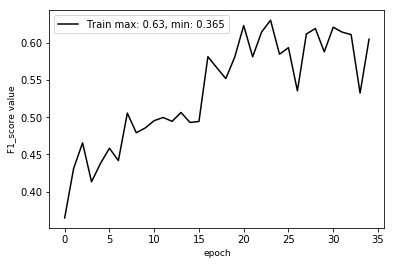

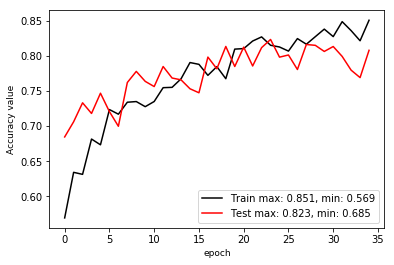

**** EPOCH 035 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.759941
accuracy: 0.845200
----
Overall accuracy：79.15  Average F1 score：60.38 
72.26 84.01 90.88 90.15 57.49 95.14 42.24 30.14 69.60 
18.67 72.91 90.67 56.55 12.61 86.63 66.81 47.56 82.15 
29.67 78.06 90.77 69.51 20.69 90.69 51.76 36.90 75.36 

learn rate: 0.005000
eval mean loss: 0.592078
eval accuracy: 0.791519
eval avg class acc: 0.593955


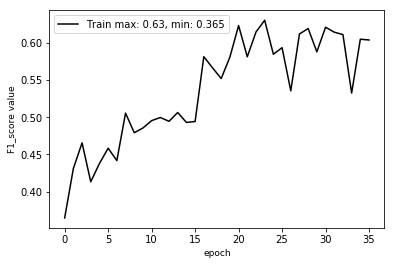

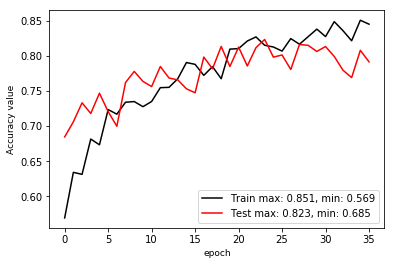

**** EPOCH 036 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.827776
accuracy: 0.846180
----
Overall accuracy：74.76  Average F1 score：52.21 
100.00 84.94 89.33 86.77 41.26 91.59 46.99 30.90 55.79 
 0.17 70.28 91.86 41.94  4.07 71.18 58.23 52.27 84.40 
 0.33 76.92 90.58 56.55  7.41 80.11 52.01 38.84 67.17 

learn rate: 0.005000
eval mean loss: 0.765813
eval accuracy: 0.747569
eval avg class acc: 0.527099


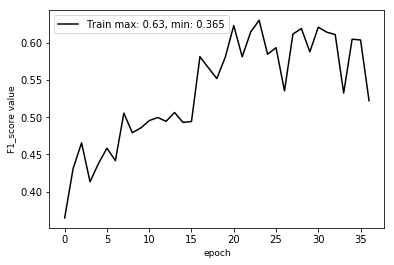

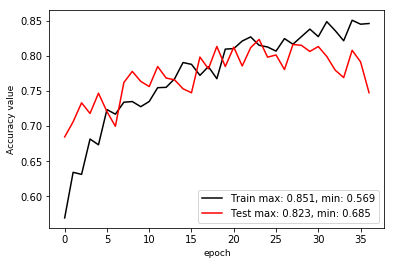

**** EPOCH 037 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.905678
accuracy: 0.791978
----
Overall accuracy：78.01  Average F1 score：60.03 
67.75 85.55 87.98 94.14 54.51 93.12 33.89 32.19 70.52 
31.17 70.04 92.57 51.56 10.19 87.61 71.37 50.16 71.57 
42.69 77.02 90.22 66.63 17.16 90.28 45.96 39.22 71.04 

learn rate: 0.005000
eval mean loss: 0.624391
eval accuracy: 0.780113
eval avg class acc: 0.595817


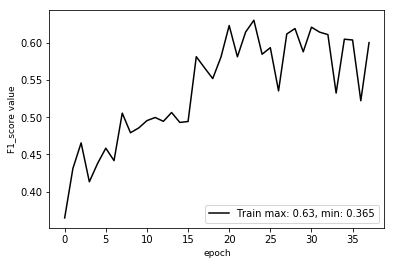

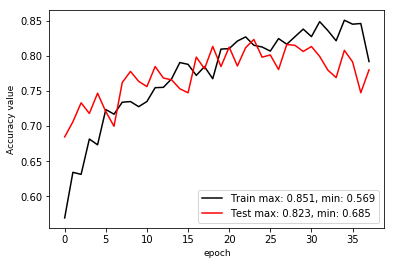

**** EPOCH 038 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.789062
accuracy: 0.833336
----
Overall accuracy：78.45  Average F1 score：60.82 
70.42 88.48 88.56 77.87 83.97 92.75 29.63 31.04 72.68 
41.67 67.83 94.14 64.16  7.06 88.26 74.55 42.98 76.73 
52.36 76.79 91.27 70.35 13.03 90.45 42.41 36.05 74.65 

learn rate: 0.005000
eval mean loss: 0.605709
eval accuracy: 0.784499
eval avg class acc: 0.619312


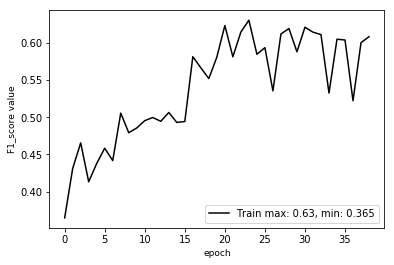

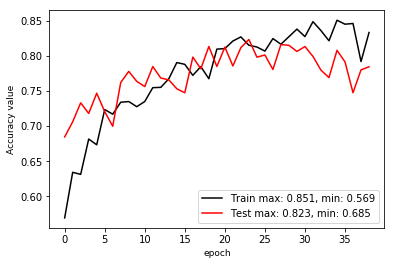

**** EPOCH 039 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.005000
mean loss: 0.741423
accuracy: 0.849267
----
Overall accuracy：81.76  Average F1 score：61.73 
74.41 82.08 90.48 93.31 65.96 95.15 46.81 35.33 81.47 
31.50 81.38 91.50 49.68  2.51 90.52 66.05 54.22 75.96 
44.26 81.73 90.99 64.84  4.83 92.77 54.79 42.78 78.62 

learn rate: 0.005000
eval mean loss: 0.508755
eval accuracy: 0.817575
eval avg class acc: 0.603675


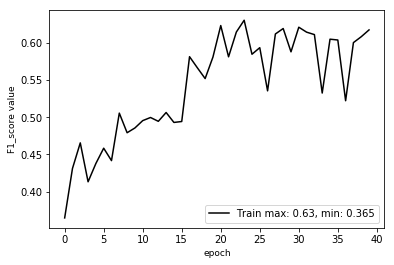

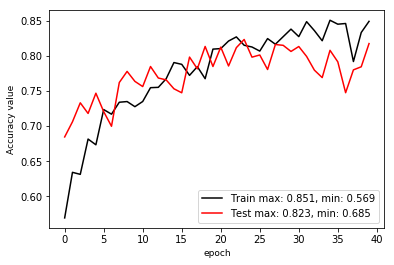

**** EPOCH 040 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.721028
accuracy: 0.840180
----
Overall accuracy：80.05  Average F1 score：62.36 
61.19 83.81 91.74 94.20 83.27 94.69 46.86 32.33 71.75 
47.83 76.55 90.87 47.73  6.10 86.83 66.03 53.99 79.95 
53.69 80.01 91.30 63.36 11.37 90.59 54.82 40.44 75.62 

learn rate: 0.002500
eval mean loss: 0.583496
eval accuracy: 0.800483
eval avg class acc: 0.617643


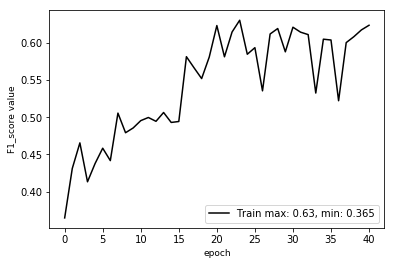

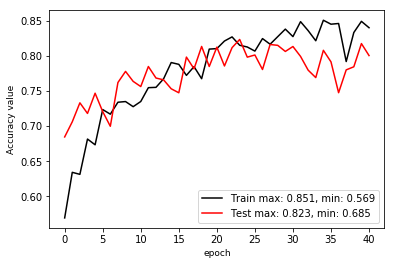

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 041 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.692499
accuracy: 0.855613
----
Overall accuracy：81.29  Average F1 score：64.06 
71.69 85.71 88.87 92.49 77.66 93.68 47.69 34.58 74.85 
38.83 75.57 92.69 56.47 11.10 90.62 64.83 48.42 81.71 
50.38 80.32 90.74 70.13 19.43 92.12 54.95 40.35 78.13 

learn rate: 0.002500
eval mean loss: 0.539050
eval accuracy: 0.812885
eval avg class acc: 0.622495


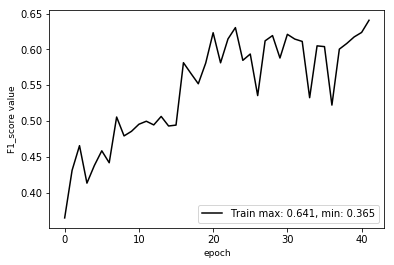

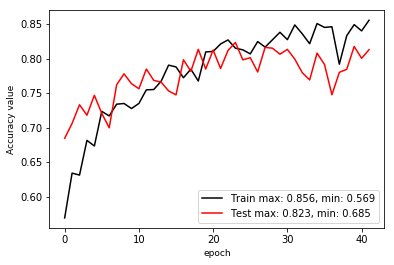

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_041.ckpt
**** EPOCH 042 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.682736
accuracy: 0.872835
----
Overall accuracy：81.24  Average F1 score：62.57 
71.39 86.21 87.35 95.56 74.50 93.82 46.87 34.54 82.26 
47.00 72.54 93.66 34.22  8.97 93.50 65.42 58.75 76.11 
56.68 78.78 90.39 50.40 16.02 93.66 54.62 43.51 79.07 

learn rate: 0.002500
eval mean loss: 0.536346
eval accuracy: 0.812368
eval avg class acc: 0.611293


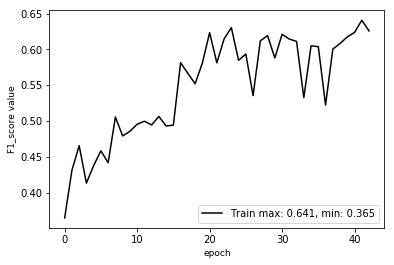

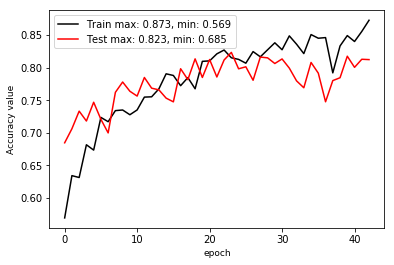

**** EPOCH 043 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.676961
accuracy: 0.862410
----
Overall accuracy：79.87  Average F1 score：61.79 
73.52 86.75 89.10 95.21 80.03 96.20 49.26 33.12 68.86 
31.00 75.42 94.04 50.43  6.91 82.85 65.28 56.57 81.58 
43.61 80.69 91.50 65.94 12.72 89.03 56.15 41.78 74.68 

learn rate: 0.002500
eval mean loss: 0.590931
eval accuracy: 0.798739
eval avg class acc: 0.604536


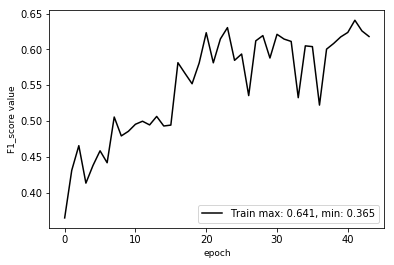

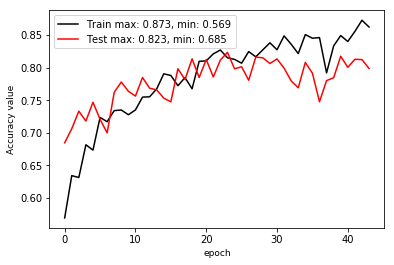

**** EPOCH 044 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.677623
accuracy: 0.858496
----
Overall accuracy：80.86  Average F1 score：58.75 
72.73 82.38 92.21 94.47 88.68 95.16 40.83 34.48 80.42 
13.33 78.63 89.01 41.91  5.81 90.50 70.87 58.88 76.05 
22.54 80.46 90.58 58.06 10.90 92.77 51.81 43.49 78.18 

learn rate: 0.002500
eval mean loss: 0.557503
eval accuracy: 0.808630
eval avg class acc: 0.583309


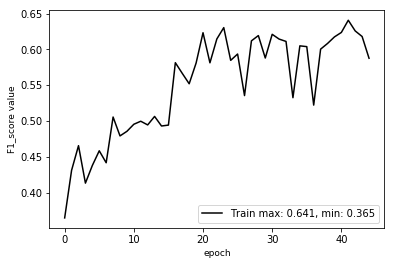

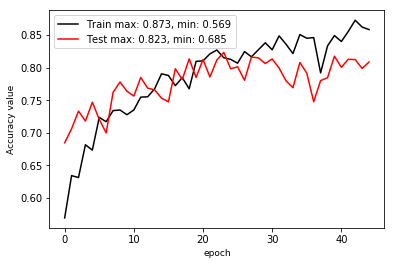

**** EPOCH 045 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.671283
accuracy: 0.859870
----
Overall accuracy：80.82  Average F1 score：62.79 
73.25 85.91 91.47 94.98 65.04 95.51 48.12 31.37 71.95 
38.33 74.02 92.85 46.41 10.05 88.73 63.85 50.56 84.51 
50.33 79.52 92.15 62.36 17.41 91.99 54.88 38.72 77.73 

learn rate: 0.002500
eval mean loss: 0.564310
eval accuracy: 0.808158
eval avg class acc: 0.610346


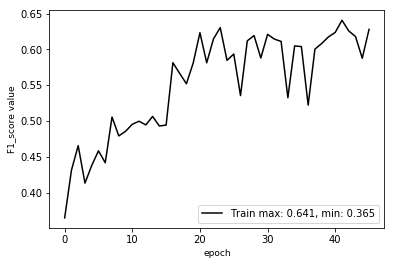

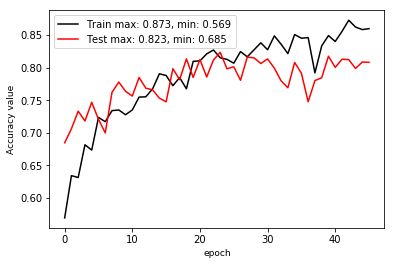

**** EPOCH 046 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.684860
accuracy: 0.860619
----
Overall accuracy：78.98  Average F1 score：62.75 
72.59 85.84 90.63 94.00 69.32 91.63 42.24 28.99 77.20 
55.17 66.38 91.13 43.12 10.20 91.98 66.63 55.31 78.45 
62.69 74.86 90.88 59.12 17.78 91.81 51.71 38.04 77.82 

learn rate: 0.002500
eval mean loss: 0.609839
eval accuracy: 0.789809
eval avg class acc: 0.620409


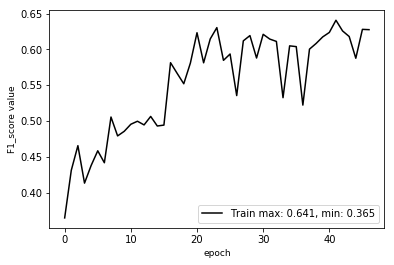

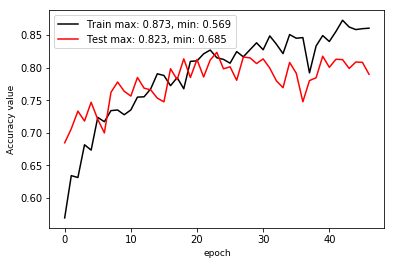

**** EPOCH 047 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.677317
accuracy: 0.862637
----
Overall accuracy：81.48  Average F1 score：65.55 
74.15 87.94 84.81 93.53 66.69 92.53 45.14 36.68 80.93 
54.50 71.27 95.80 55.34 11.76 93.05 67.48 48.77 79.33 
62.82 78.74 89.97 69.54 20.00 92.79 54.09 41.87 80.12 

learn rate: 0.002500
eval mean loss: 0.553635
eval accuracy: 0.814770
eval avg class acc: 0.641449


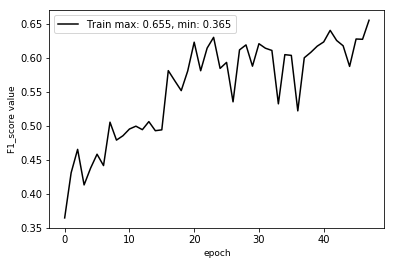

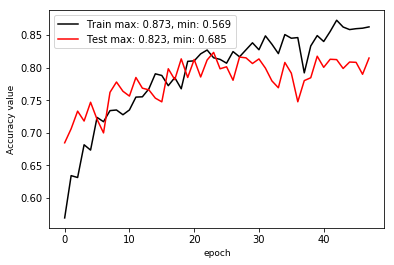

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_047.ckpt
**** EPOCH 048 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.659270
accuracy: 0.868893
----
Overall accuracy：79.64  Average F1 score：57.41 
75.14 84.11 91.33 94.14 37.60 93.71 39.08 31.06 75.71 
23.17 74.62 90.90 29.88  4.90 88.98 70.70 50.68 78.16 
35.41 79.08 91.12 45.36  8.68 91.28 50.33 38.52 76.92 

learn rate: 0.002500
eval mean loss: 0.584952
eval accuracy: 0.796391
eval avg class acc: 0.568889


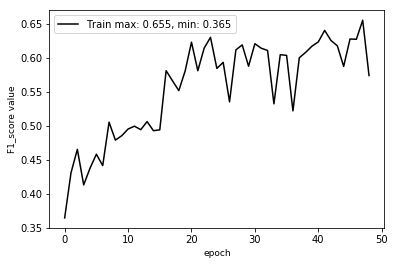

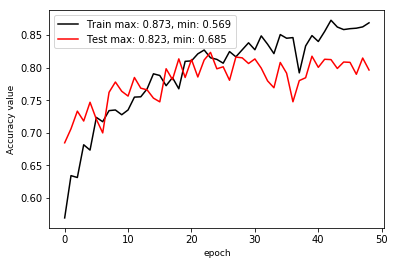

**** EPOCH 049 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.656827
accuracy: 0.866085
----
Overall accuracy：79.12  Average F1 score：58.63 
68.95 74.01 94.22 97.23 51.28 95.84 41.35 36.93 73.00 
50.33 85.94 79.75 17.96  7.29 87.01 68.42 45.04 81.83 
58.19 79.53 86.38 30.32 12.76 91.22 51.55 40.58 77.16 

learn rate: 0.002500
eval mean loss: 0.619969
eval accuracy: 0.791239
eval avg class acc: 0.581745


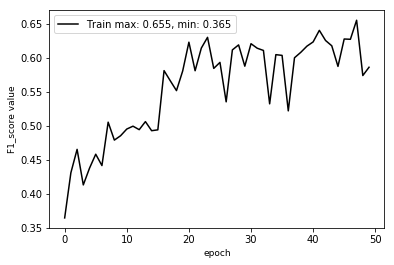

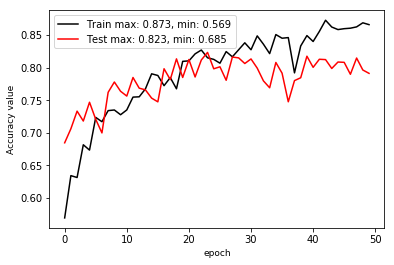

**** EPOCH 050 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.644117
accuracy: 0.872191
----
Overall accuracy：80.33  Average F1 score：65.15 
76.83 84.64 91.03 88.58 59.64 94.11 42.05 35.43 75.73 
42.00 75.10 91.33 63.16 15.37 88.03 66.43 61.37 75.74 
54.31 79.58 91.18 73.74 24.45 90.97 51.50 44.93 75.73 

learn rate: 0.002500
eval mean loss: 0.579610
eval accuracy: 0.803328
eval avg class acc: 0.642813


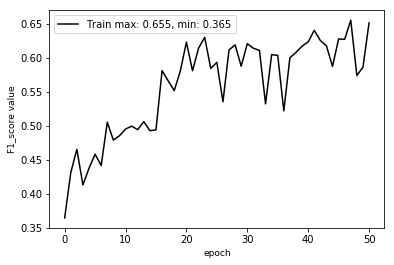

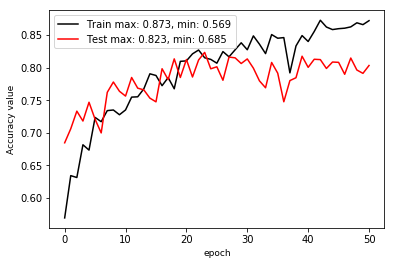

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 051 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.646958
accuracy: 0.865835
----
Overall accuracy：81.81  Average F1 score：64.40 
75.62 87.38 88.80 93.24 51.76 95.33 46.23 36.02 77.99 
35.67 72.82 94.47 51.32 13.69 90.88 68.30 56.29 82.49 
48.47 79.44 91.55 66.20 21.65 93.05 55.14 43.93 80.18 

learn rate: 0.002500
eval mean loss: 0.526280
eval accuracy: 0.818066
eval avg class acc: 0.628809


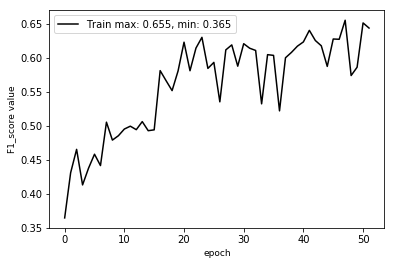

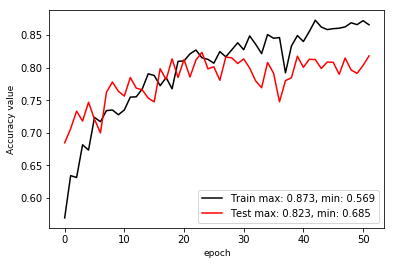

**** EPOCH 052 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.643081
accuracy: 0.866155
----
Overall accuracy：78.19  Average F1 score：61.41 
73.43 81.22 89.92 90.22 71.64 94.54 50.74 30.41 60.14 
41.00 73.85 89.70 64.19  5.89 84.05 59.93 32.57 88.60 
52.62 77.36 89.81 75.01 10.88 88.99 54.95 31.45 71.65 

learn rate: 0.002500
eval mean loss: 0.682116
eval accuracy: 0.781912
eval avg class acc: 0.599736


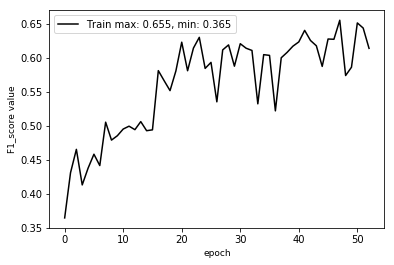

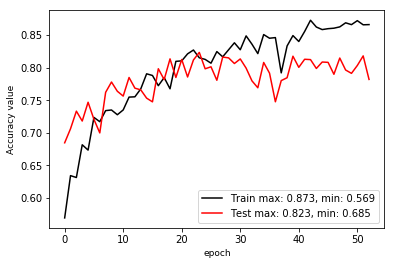

**** EPOCH 053 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.640993
accuracy: 0.870146
----
Overall accuracy：78.20  Average F1 score：62.48 
77.59 89.64 88.00 93.58 57.26 93.59 42.98 28.91 77.04 
31.17 61.02 94.33 52.29 17.33 89.58 68.98 64.64 74.98 
44.47 72.61 91.05 67.09 26.60 91.54 52.96 39.95 76.00 

learn rate: 0.002500
eval mean loss: 0.604158
eval accuracy: 0.781993
eval avg class acc: 0.615902


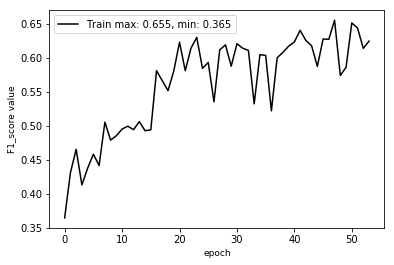

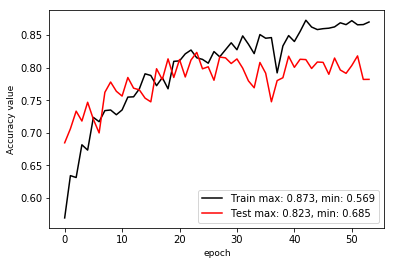

**** EPOCH 054 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.634254
accuracy: 0.864944
----
Overall accuracy：80.65  Average F1 score：63.50 
75.61 84.79 91.31 93.70 44.03 91.49 50.38 30.39 72.35 
36.17 70.54 91.14 46.90 24.09 94.22 61.63 38.12 85.98 
48.93 77.01 91.22 62.51 31.14 92.84 55.44 33.82 78.58 

learn rate: 0.002500
eval mean loss: 0.585377
eval accuracy: 0.806521
eval avg class acc: 0.609769


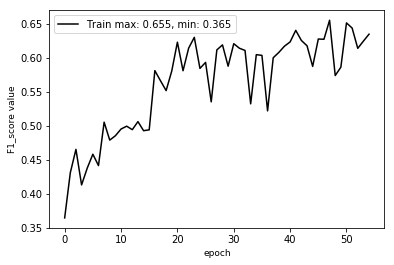

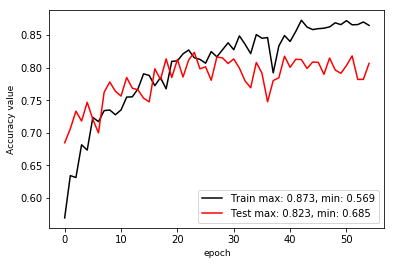

**** EPOCH 055 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.632814
accuracy: 0.866699
----
Overall accuracy：80.91  Average F1 score：62.02 
77.58 85.63 90.01 91.98 53.34 94.74 43.65 34.11 71.86 
28.83 74.84 92.41 47.95 12.37 89.20 69.89 44.12 85.01 
42.04 79.87 91.19 63.04 20.08 91.88 53.74 38.48 77.89 

learn rate: 0.002500
eval mean loss: 0.568905
eval accuracy: 0.809108
eval avg class acc: 0.605134


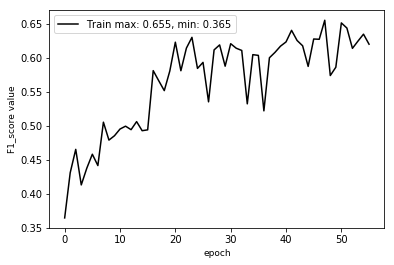

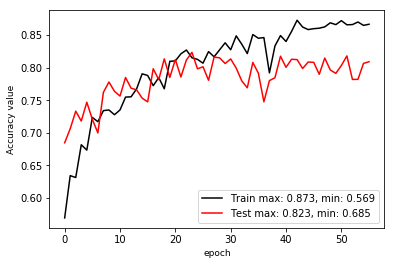

**** EPOCH 056 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.610224
accuracy: 0.871293
----
Overall accuracy：80.85  Average F1 score：63.65 
73.93 78.51 92.35 95.50 65.89 94.41 42.19 36.76 87.28 
52.00 83.61 86.44 35.49 14.19 92.35 65.86 63.09 65.95 
61.06 80.98 89.30 51.75 23.35 93.37 51.43 46.45 75.13 

learn rate: 0.002500
eval mean loss: 0.583643
eval accuracy: 0.808515
eval avg class acc: 0.621100


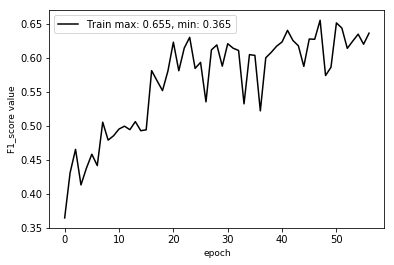

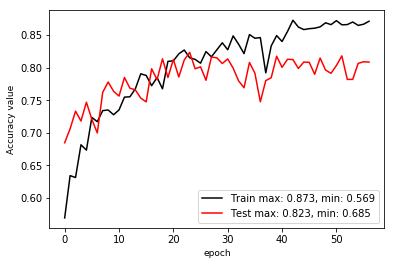

**** EPOCH 057 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.600298
accuracy: 0.876490
----
Overall accuracy：81.56  Average F1 score：65.65 
71.90 81.07 92.00 95.54 60.44 93.93 43.30 38.75 80.11 
54.17 79.53 87.61 56.55  9.90 92.01 66.08 56.76 79.22 
61.79 80.30 89.75 71.05 17.02 92.96 52.32 46.05 79.66 

learn rate: 0.002500
eval mean loss: 0.571208
eval accuracy: 0.815566
eval avg class acc: 0.646474


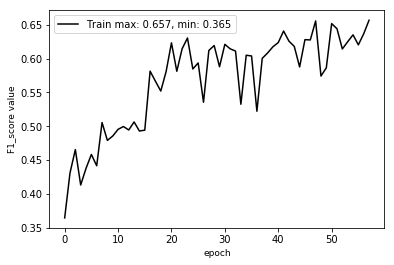

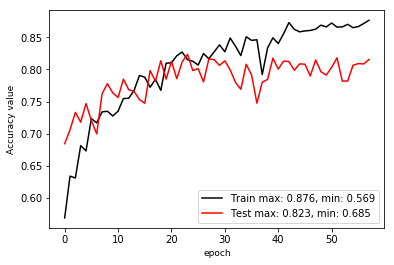

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_057.ckpt
**** EPOCH 058 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.625095
accuracy: 0.867298
----
Overall accuracy：79.82  Average F1 score：60.89 
71.80 89.88 85.65 95.12 54.91 92.40 48.48 33.49 70.23 
45.83 65.63 95.60 37.81  5.20 90.58 60.38 48.36 86.17 
55.95 75.87 90.35 54.11  9.50 91.48 53.78 39.58 77.39 

learn rate: 0.002500
eval mean loss: 0.592868
eval accuracy: 0.798164
eval avg class acc: 0.595083


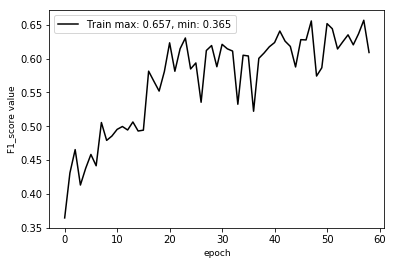

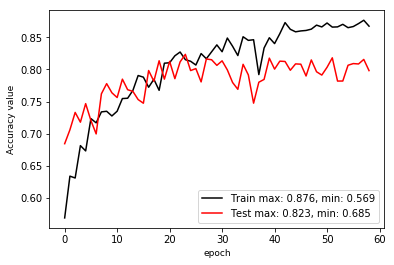

**** EPOCH 059 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.002500
mean loss: 0.593192
accuracy: 0.871995
----
Overall accuracy：79.41  Average F1 score：61.39 
79.93 88.96 87.55 95.70 90.70 92.20 44.90 31.77 75.53 
36.50 64.39 94.55 44.98  5.91 90.81 67.65 58.57 80.19 
50.11 74.71 90.92 61.20 11.11 91.50 53.97 41.19 77.79 

learn rate: 0.002500
eval mean loss: 0.630496
eval accuracy: 0.794086
eval avg class acc: 0.603960


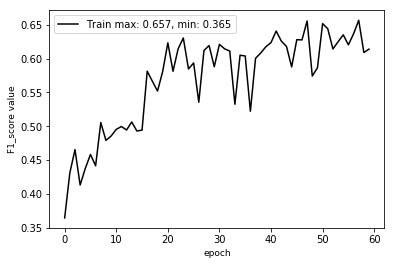

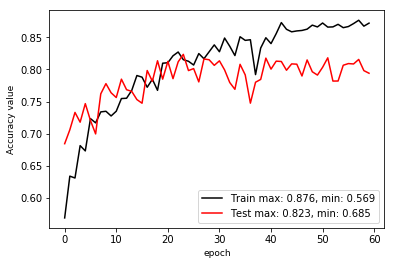

**** EPOCH 060 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.595005
accuracy: 0.883242
----
Overall accuracy：81.53  Average F1 score：64.32 
76.77 84.99 89.09 97.17 59.24 94.51 47.80 35.46 79.80 
50.67 76.24 93.27 37.92 12.65 90.80 67.75 56.74 77.43 
61.04 80.38 91.13 54.55 20.85 92.62 56.05 43.64 78.60 

learn rate: 0.001250
eval mean loss: 0.543621
eval accuracy: 0.815336
eval avg class acc: 0.626059


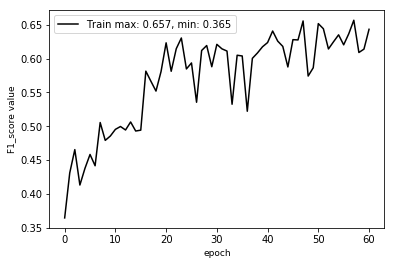

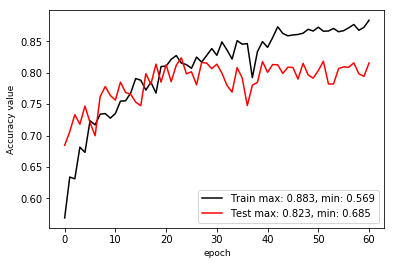

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 061 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.559556
accuracy: 0.888717
----
Overall accuracy：81.03  Average F1 score：64.86 
70.00 87.32 89.87 96.43 56.90 93.10 53.28 33.18 72.72 
60.67 71.83 93.75 40.83 14.71 90.53 61.72 50.82 84.62 
65.00 78.82 91.77 57.37 23.38 91.80 57.19 40.15 78.22 

learn rate: 0.001250
eval mean loss: 0.590924
eval accuracy: 0.810286
eval avg class acc: 0.632752


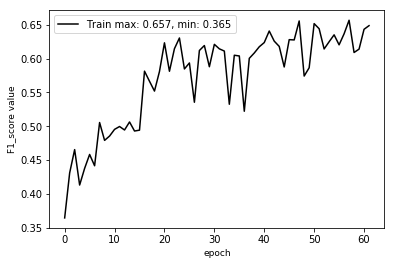

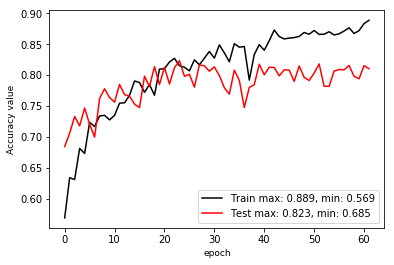

**** EPOCH 062 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.540991
accuracy: 0.890548
----
Overall accuracy：81.20  Average F1 score：64.06 
75.18 85.79 90.72 96.06 63.79 93.13 50.92 32.45 75.10 
53.00 72.58 91.87 46.01  7.17 92.60 67.15 49.58 84.16 
62.17 78.63 91.29 62.22 12.89 92.86 57.92 39.23 79.37 

learn rate: 0.001250
eval mean loss: 0.596615
eval accuracy: 0.812032
eval avg class acc: 0.626791


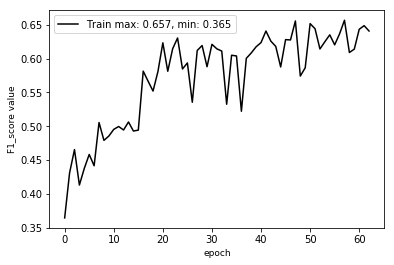

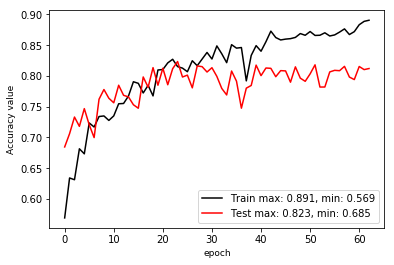

**** EPOCH 063 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.562074
accuracy: 0.885700
----
Overall accuracy：81.74  Average F1 score：66.64 
73.90 87.52 88.98 95.14 67.87 91.59 50.41 34.80 72.64 
64.17 72.99 94.36 57.61 14.89 93.25 62.47 40.18 84.76 
68.69 79.59 91.59 71.76 24.42 92.42 55.79 37.30 78.24 

learn rate: 0.001250
eval mean loss: 0.565437
eval accuracy: 0.817373
eval avg class acc: 0.649645


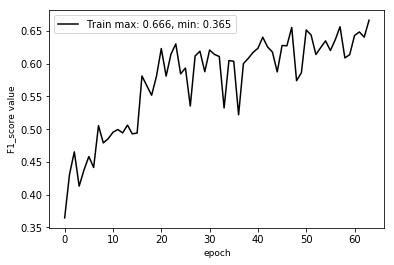

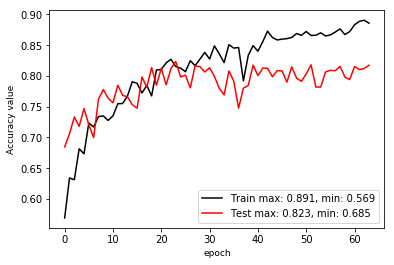

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_063.ckpt
**** EPOCH 064 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.544376
accuracy: 0.880990
----
Overall accuracy：80.72  Average F1 score：62.61 
80.64 84.74 91.07 96.19 61.54 92.79 40.67 34.40 79.29 
46.50 75.75 91.51 52.40  0.97 91.03 71.19 56.08 75.21 
58.99 79.99 91.29 67.84  1.91 91.90 51.76 42.64 77.19 

learn rate: 0.001250
eval mean loss: 0.588632
eval accuracy: 0.807184
eval avg class acc: 0.622930


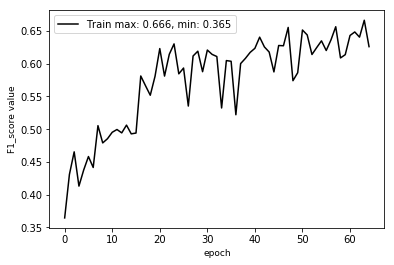

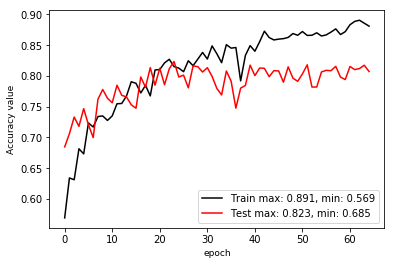

**** EPOCH 065 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.534008
accuracy: 0.895442
----
Overall accuracy：81.44  Average F1 score：64.40 
79.37 85.73 90.65 94.93 65.70 94.31 47.71 34.08 74.50 
46.17 75.48 92.65 56.04  6.09 90.16 69.08 50.02 83.02 
58.38 80.28 91.64 70.48 11.15 92.19 56.44 40.54 78.53 

learn rate: 0.001250
eval mean loss: 0.564843
eval accuracy: 0.814379
eval avg class acc: 0.631901


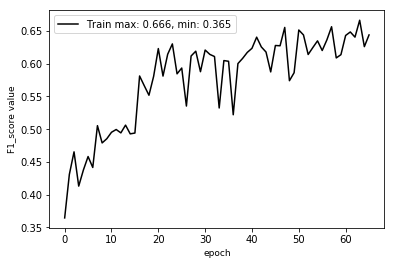

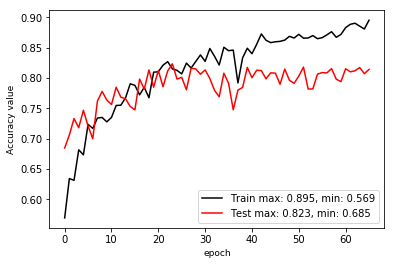

**** EPOCH 066 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.561305
accuracy: 0.874445
----
Overall accuracy：81.22  Average F1 score：63.18 
77.36 85.63 89.04 99.27 77.64 94.98 42.96 37.27 75.84 
41.00 75.84 93.24 40.45 10.20 88.58 71.85 55.11 80.48 
53.59 80.44 91.09 57.48 18.03 91.67 53.77 44.47 78.09 

learn rate: 0.001250
eval mean loss: 0.569476
eval accuracy: 0.812241
eval avg class acc: 0.618612


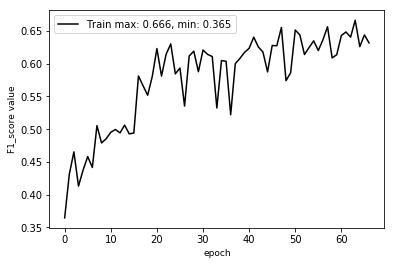

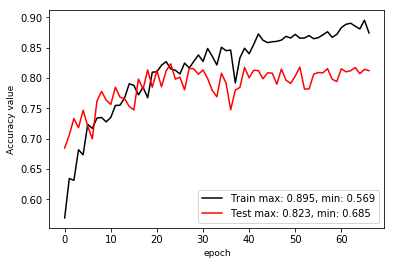

**** EPOCH 067 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.524214
accuracy: 0.896458
----
Overall accuracy：81.85  Average F1 score：67.12 
77.42 86.20 90.54 94.19 77.67 94.03 50.87 33.78 82.11 
48.00 74.29 92.74 56.82 17.76 92.80 65.58 61.46 76.70 
59.26 79.80 91.63 70.88 28.91 93.41 57.30 43.59 79.31 

learn rate: 0.001250
eval mean loss: 0.555970
eval accuracy: 0.818534
eval avg class acc: 0.651272


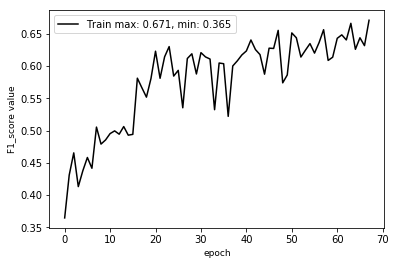

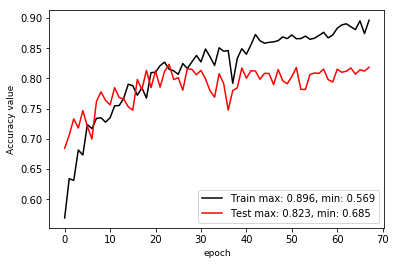

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_067.ckpt
**** EPOCH 068 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.538015
accuracy: 0.891838
----
Overall accuracy：81.33  Average F1 score：63.38 
75.61 85.59 90.12 97.61 82.27 93.10 43.44 34.02 80.11 
56.83 73.65 92.63 35.28  8.88 93.56 68.07 53.98 78.06 
64.89 79.17 91.36 51.82 16.03 93.33 53.03 41.74 79.07 

learn rate: 0.001250
eval mean loss: 0.581757
eval accuracy: 0.813295
eval avg class acc: 0.623255


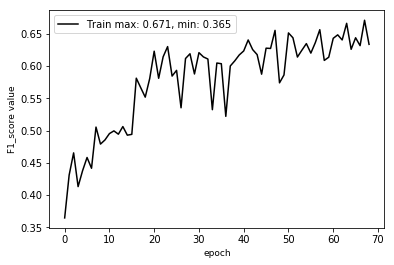

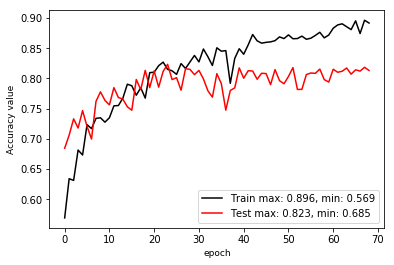

**** EPOCH 069 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.534487
accuracy: 0.886083
----
Overall accuracy：79.88  Average F1 score：64.10 
78.15 85.39 89.77 95.84 77.21 93.39 48.55 31.34 74.81 
54.83 70.60 92.80 42.91 11.41 89.13 66.50 55.86 79.76 
64.45 77.29 91.26 59.28 19.88 91.21 56.12 40.15 77.21 

learn rate: 0.001250
eval mean loss: 0.610456
eval accuracy: 0.798764
eval avg class acc: 0.626464


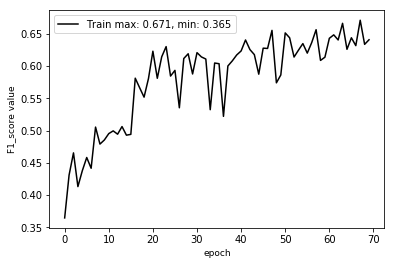

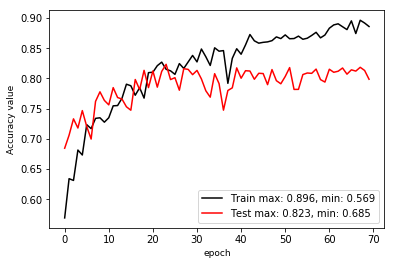

**** EPOCH 070 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.503975
accuracy: 0.880679
----
Overall accuracy：81.59  Average F1 score：65.52 
80.12 86.65 88.57 95.48 71.56 94.67 49.18 35.81 74.76 
43.00 75.22 94.17 55.26 13.33 88.99 67.09 51.70 82.87 
55.97 80.53 91.28 70.00 22.47 91.74 56.75 42.31 78.60 

learn rate: 0.001250
eval mean loss: 0.569423
eval accuracy: 0.815858
eval avg class acc: 0.635127


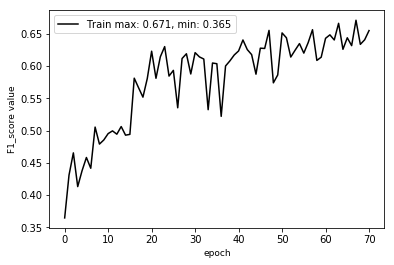

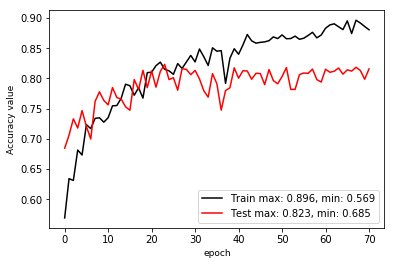

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 071 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.516110
accuracy: 0.886422
----
Overall accuracy：81.69  Average F1 score：64.37 
80.91 85.78 90.55 97.32 63.60 94.08 52.03 33.75 75.39 
44.50 75.35 92.15 44.04 10.90 91.29 66.54 50.49 84.34 
57.42 80.23 91.34 60.64 18.61 92.66 58.40 40.46 79.61 

learn rate: 0.001250
eval mean loss: 0.586809
eval accuracy: 0.816893
eval avg class acc: 0.621781


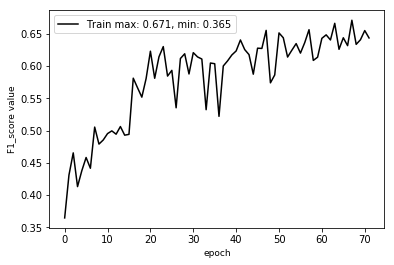

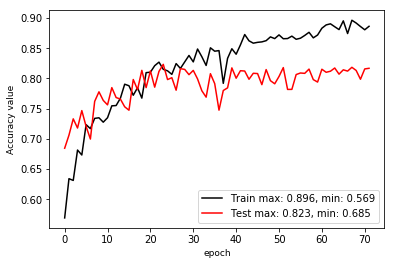

**** EPOCH 072 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.511821
accuracy: 0.899339
----
Overall accuracy：81.78  Average F1 score：65.63 
75.40 84.77 90.09 94.93 66.90 93.23 54.74 35.36 75.78 
47.00 73.67 91.45 57.07 10.24 93.13 64.08 50.76 85.24 
57.91 78.83 90.77 71.28 17.76 93.18 59.04 41.68 80.23 

learn rate: 0.001250
eval mean loss: 0.584596
eval accuracy: 0.817782
eval avg class acc: 0.636260


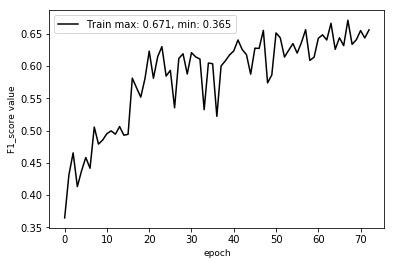

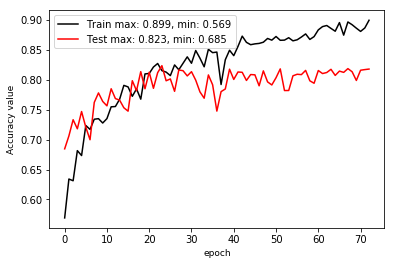

**** EPOCH 073 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.513824
accuracy: 0.890675
----
Overall accuracy：80.91  Average F1 score：67.92 
71.30 88.81 87.99 93.74 50.82 96.19 53.82 33.51 74.87 
67.50 70.09 95.34 64.16 15.08 87.91 65.94 61.29 81.74 
69.35 78.35 91.52 76.18 23.25 91.86 59.26 43.33 78.15 

learn rate: 0.001250
eval mean loss: 0.587566
eval accuracy: 0.809074
eval avg class acc: 0.676720


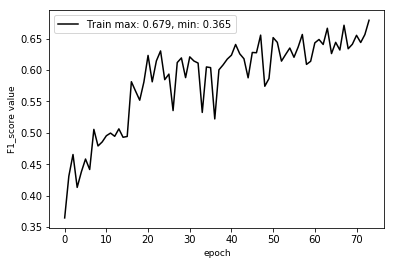

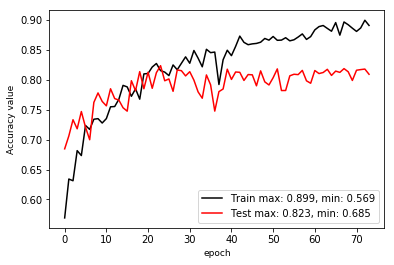

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_073.ckpt
**** EPOCH 074 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.495991
accuracy: 0.900507
----
Overall accuracy：81.75  Average F1 score：65.85 
76.12 84.15 91.15 95.76 80.11 95.84 53.92 33.97 77.25 
48.33 75.55 91.65 57.25  8.19 89.91 67.67 56.88 84.46 
59.12 79.62 91.40 71.66 14.86 92.78 60.02 42.54 80.69 

learn rate: 0.001250
eval mean loss: 0.578828
eval accuracy: 0.817536
eval avg class acc: 0.644316


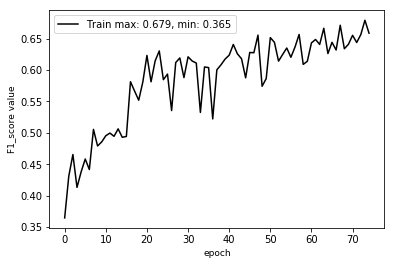

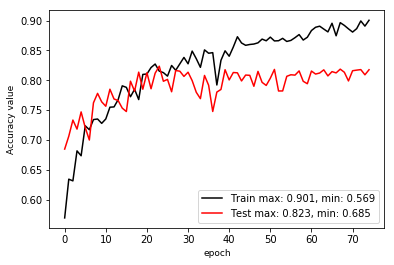

**** EPOCH 075 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.512229
accuracy: 0.882525
----
Overall accuracy：82.07  Average F1 score：66.54 
73.39 84.31 90.22 89.63 65.10 93.85 56.97 34.23 77.98 
58.83 75.49 91.51 56.88 10.63 93.61 63.69 50.83 82.98 
65.31 79.66 90.86 69.59 18.28 93.73 60.14 40.91 80.40 

learn rate: 0.001250
eval mean loss: 0.575165
eval accuracy: 0.820745
eval avg class acc: 0.649392


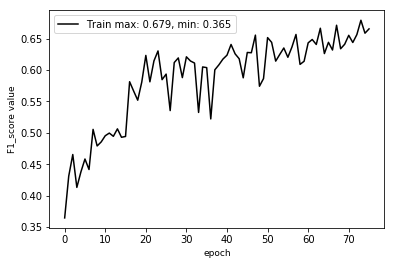

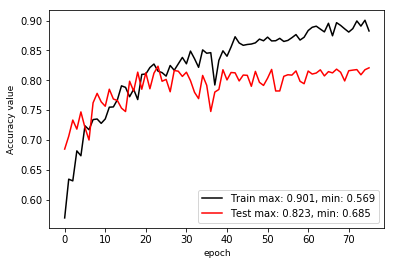

**** EPOCH 076 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.491198
accuracy: 0.885400
----
Overall accuracy：81.03  Average F1 score：65.69 
74.69 86.42 89.84 93.89 76.12 94.08 54.86 31.34 73.98 
60.00 71.11 92.62 54.67  8.68 91.48 66.79 50.06 85.35 
66.54 78.02 91.20 69.10 15.58 92.76 60.24 38.55 79.26 

learn rate: 0.001250
eval mean loss: 0.604362
eval accuracy: 0.810291
eval avg class acc: 0.645261


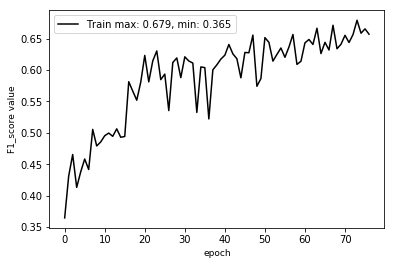

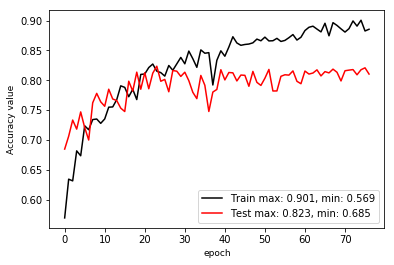

**** EPOCH 077 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.485842
accuracy: 0.897536
----
Overall accuracy：79.57  Average F1 score：65.23 
67.78 84.70 90.96 96.11 51.53 95.56 64.53 34.49 61.90 
54.00 75.59 92.02 54.69 18.39 82.02 51.35 48.38 88.92 
60.11 79.88 91.49 69.71 27.11 88.28 57.19 40.27 72.99 

learn rate: 0.001250
eval mean loss: 0.670370
eval accuracy: 0.795669
eval avg class acc: 0.628174


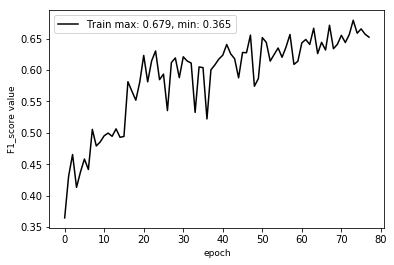

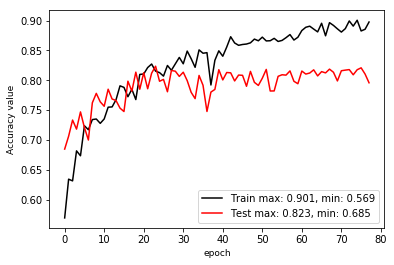

**** EPOCH 078 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.507200
accuracy: 0.890144
----
Overall accuracy：82.05  Average F1 score：68.12 
75.96 84.99 89.47 92.98 47.40 95.65 55.68 34.70 76.98 
55.83 75.26 93.39 61.46 21.52 91.00 63.76 51.03 83.07 
64.36 79.83 91.38 74.01 29.60 93.27 59.44 41.31 79.91 

learn rate: 0.001250
eval mean loss: 0.554838
eval accuracy: 0.820509
eval avg class acc: 0.662565


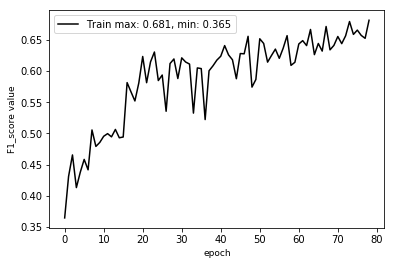

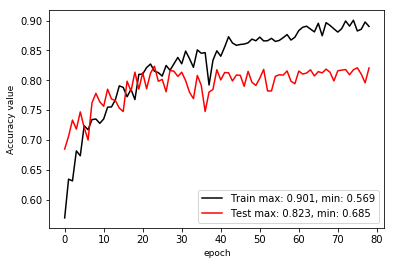

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_078.ckpt
**** EPOCH 079 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.001250
mean loss: 0.492135
accuracy: 0.886148
----
Overall accuracy：82.19  Average F1 score：66.01 
73.49 83.31 91.33 95.93 55.49 92.79 56.54 34.83 72.98 
67.00 78.13 90.68 56.55  7.76 93.84 60.48 38.29 86.89 
70.10 80.64 91.00 71.16 13.62 93.31 58.44 36.48 79.33 

learn rate: 0.001250
eval mean loss: 0.591838
eval accuracy: 0.821913
eval avg class acc: 0.644023


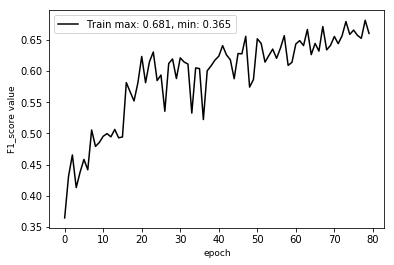

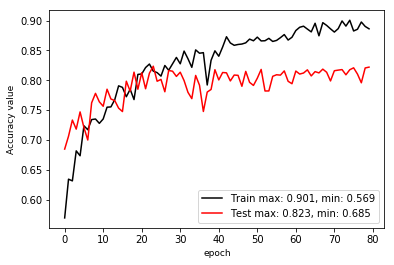

**** EPOCH 080 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.477106
accuracy: 0.896654
----
Overall accuracy：80.57  Average F1 score：63.17 
79.60 84.72 89.71 97.39 41.79 95.01 57.48 34.24 71.63 
53.33 75.37 92.54 37.30  6.48 87.81 58.95 57.88 81.25 
63.87 79.77 91.10 53.94 11.22 91.27 58.20 43.03 76.14 

learn rate: 0.000625
eval mean loss: 0.616397
eval accuracy: 0.805730
eval avg class acc: 0.612117


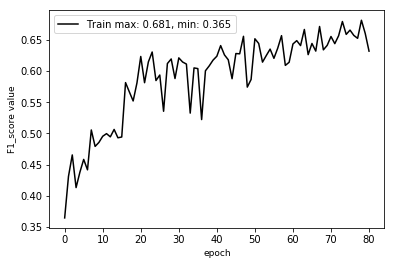

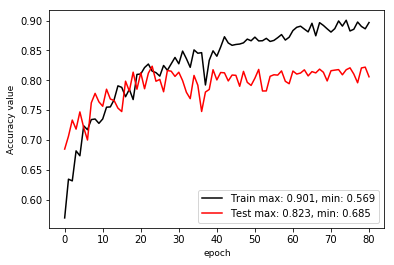

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 081 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.472416
accuracy: 0.899948
----
Overall accuracy：82.53  Average F1 score：66.56 
76.37 86.08 89.38 95.69 78.08 93.59 57.40 35.36 76.12 
62.50 75.92 93.94 52.70  9.22 93.17 62.02 47.63 84.18 
68.74 80.68 91.60 67.97 16.49 93.38 59.62 40.58 79.95 

learn rate: 0.000625
eval mean loss: 0.566964
eval accuracy: 0.825257
eval avg class acc: 0.645859


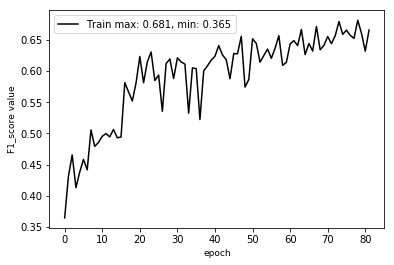

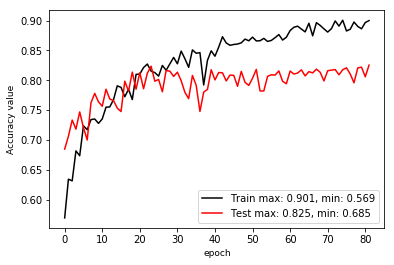

**** EPOCH 082 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.446873
accuracy: 0.900287
----
Overall accuracy：81.87  Average F1 score：65.43 
73.97 84.16 90.33 99.38 83.51 94.41 55.53 34.36 78.54 
68.67 75.90 91.66 38.92  8.33 92.39 64.66 55.51 81.98 
71.22 79.81 90.99 55.93 15.14 93.39 59.75 42.45 80.22 

learn rate: 0.000625
eval mean loss: 0.594782
eval accuracy: 0.818748
eval avg class acc: 0.642224


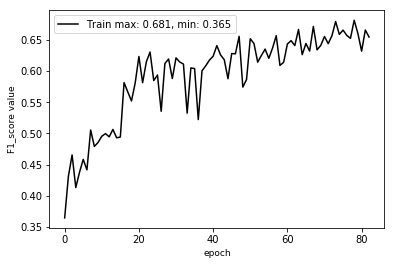

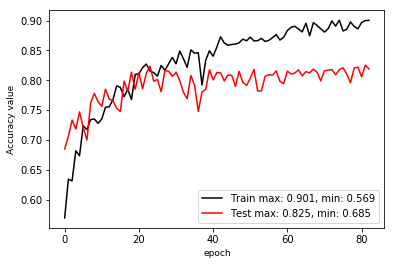

**** EPOCH 083 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.454351
accuracy: 0.892462
----
Overall accuracy：80.35  Average F1 score：65.85 
77.91 82.41 91.97 96.98 74.27 95.24 57.45 31.50 80.60 
55.83 73.13 88.31 43.37 14.39 91.08 64.10 67.97 77.79 
65.05 77.50 90.11 59.93 24.11 93.12 60.59 43.05 79.17 

learn rate: 0.000625
eval mean loss: 0.636436
eval accuracy: 0.803510
eval avg class acc: 0.639980


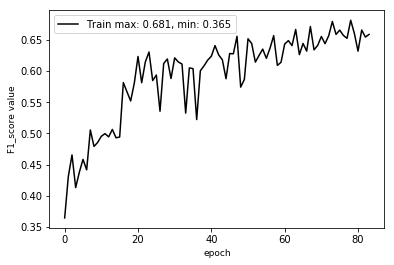

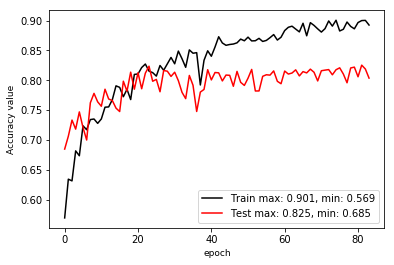

**** EPOCH 084 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.455135
accuracy: 0.901010
----
Overall accuracy：82.59  Average F1 score：66.10 
75.20 84.63 89.20 98.93 70.14 93.69 55.48 36.24 79.09 
64.17 77.11 93.45 42.29 10.89 93.48 64.82 48.90 82.13 
69.24 80.69 91.27 59.25 18.85 93.59 59.79 41.63 80.58 

learn rate: 0.000625
eval mean loss: 0.575655
eval accuracy: 0.825908
eval avg class acc: 0.641357


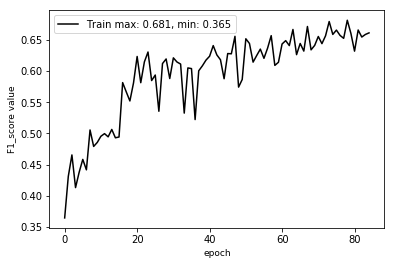

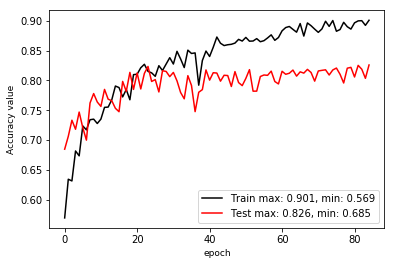

**** EPOCH 085 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.446235
accuracy: 0.897971
----
Overall accuracy：82.02  Average F1 score：65.31 
78.42 86.25 88.30 97.75 56.66 94.17 60.18 36.64 74.15 
49.67 75.17 94.30 45.71 11.29 90.87 59.65 51.52 84.70 
60.82 80.33 91.20 62.29 18.83 92.49 59.91 42.83 79.07 

learn rate: 0.000625
eval mean loss: 0.586610
eval accuracy: 0.820208
eval avg class acc: 0.625431


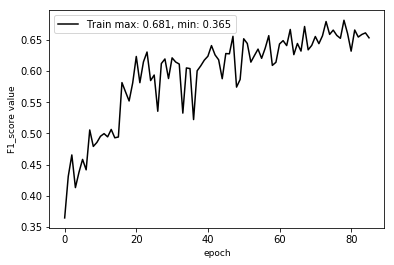

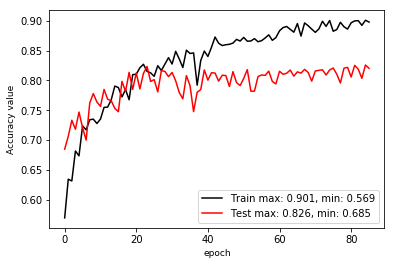

**** EPOCH 086 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.448328
accuracy: 0.908456
----
Overall accuracy：82.24  Average F1 score：67.16 
77.20 82.17 91.15 96.77 67.91 94.97 53.55 36.02 79.48 
67.17 78.47 90.18 50.08 10.58 92.42 68.09 53.06 82.12 
71.84 80.28 90.66 66.00 18.30 93.68 59.95 42.91 80.78 

learn rate: 0.000625
eval mean loss: 0.584552
eval accuracy: 0.822360
eval avg class acc: 0.657962


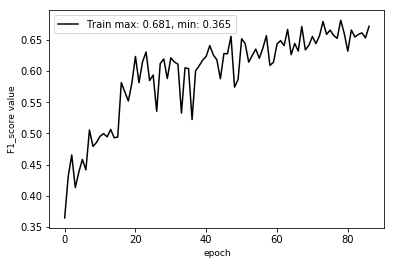

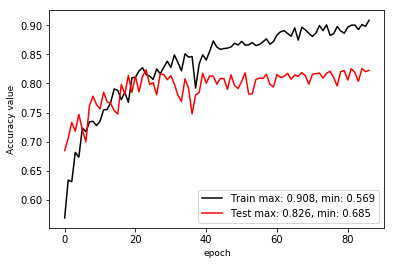

**** EPOCH 087 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.448607
accuracy: 0.903646
----
Overall accuracy：81.72  Average F1 score：66.99 
71.88 86.40 88.86 97.85 63.59 93.45 52.62 33.11 77.74 
82.67 72.18 93.57 52.72  9.30 93.60 64.34 49.69 83.02 
76.90 78.65 91.15 68.52 16.22 93.53 57.89 39.74 80.29 

learn rate: 0.000625
eval mean loss: 0.603867
eval accuracy: 0.817162
eval avg class acc: 0.667874


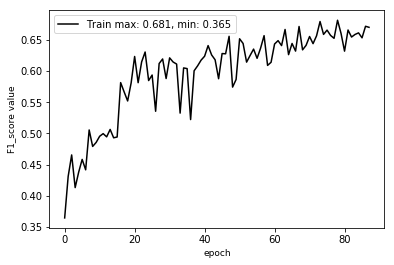

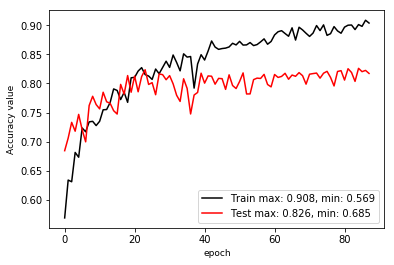

**** EPOCH 088 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.438084
accuracy: 0.904071
----
Overall accuracy：82.19  Average F1 score：67.05 
78.12 86.27 89.20 95.49 65.55 94.01 57.61 34.30 77.29 
59.50 73.84 93.57 53.05 12.41 93.09 64.64 51.32 83.58 
67.55 79.57 91.33 68.20 20.87 93.55 60.92 41.12 80.31 

learn rate: 0.000625
eval mean loss: 0.594988
eval accuracy: 0.821855
eval avg class acc: 0.649997


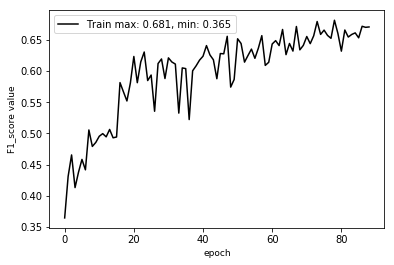

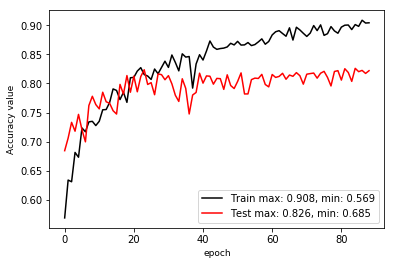

**** EPOCH 089 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.437234
accuracy: 0.896751
----
Overall accuracy：82.08  Average F1 score：66.87 
74.95 84.23 89.78 93.49 62.27 95.91 55.85 34.98 75.49 
66.33 77.41 92.18 54.21  9.74 90.61 65.10 50.29 84.49 
70.38 80.67 90.96 68.62 16.85 93.19 60.12 41.26 79.74 

learn rate: 0.000625
eval mean loss: 0.612814
eval accuracy: 0.820808
eval avg class acc: 0.655957


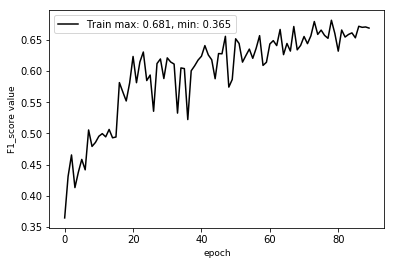

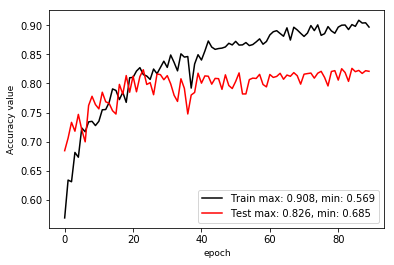

**** EPOCH 090 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.433662
accuracy: 0.907099
----
Overall accuracy：82.13  Average F1 score：67.25 
71.11 84.43 90.62 95.39 77.14 94.71 59.19 34.31 76.45 
75.50 75.47 91.65 55.26  8.27 92.56 62.07 52.72 85.00 
73.24 79.70 91.13 69.98 14.94 93.63 60.60 41.57 80.50 

learn rate: 0.000625
eval mean loss: 0.608409
eval accuracy: 0.821311
eval avg class acc: 0.665014


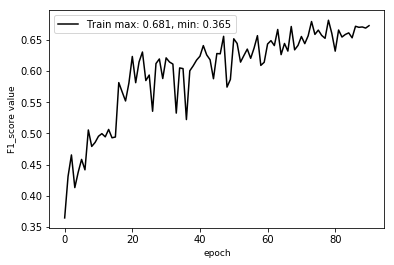

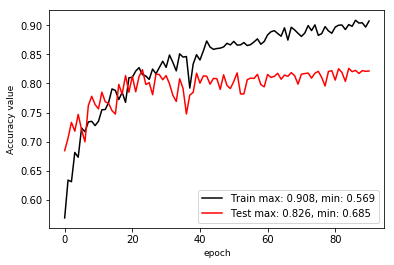

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 091 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.430851
accuracy: 0.896851
----
Overall accuracy：82.22  Average F1 score：66.37 
76.63 85.78 89.09 94.28 53.26 95.04 55.10 34.55 76.46 
56.83 74.64 93.58 56.85  9.24 92.55 64.83 49.21 84.62 
65.26 79.82 91.28 70.93 15.75 93.78 59.57 40.60 80.33 

learn rate: 0.000625
eval mean loss: 0.597740
eval accuracy: 0.822236
eval avg class acc: 0.647065


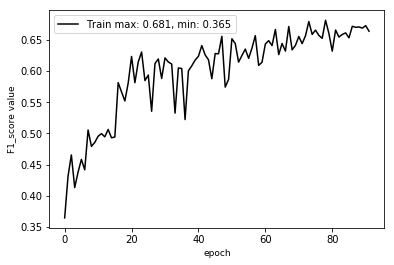

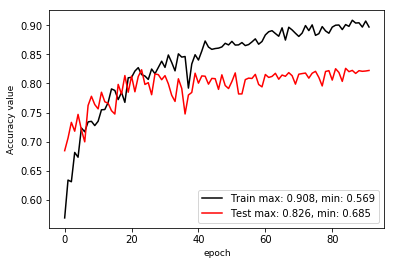

**** EPOCH 092 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.436160
accuracy: 0.896809
----
Overall accuracy：81.96  Average F1 score：65.37 
71.69 84.42 90.60 97.41 79.22 95.36 57.31 34.08 75.12 
65.83 76.88 92.19 40.61  9.61 91.12 61.87 52.08 84.29 
68.64 80.47 91.39 57.33 17.14 93.20 59.50 41.20 79.44 

learn rate: 0.000625
eval mean loss: 0.597038
eval accuracy: 0.819593
eval avg class acc: 0.638305


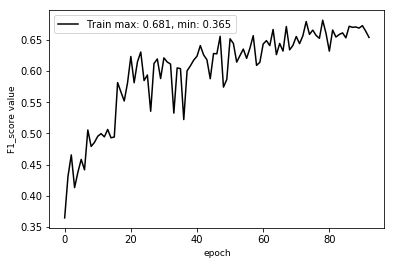

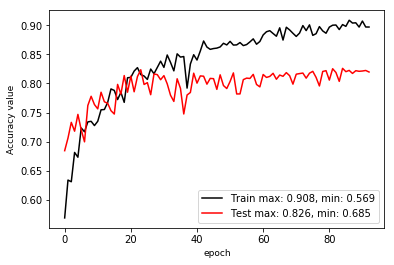

**** EPOCH 093 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.436246
accuracy: 0.900344
----
Overall accuracy：81.51  Average F1 score：64.48 
78.90 84.72 90.56 94.52 85.11 94.98 55.90 33.56 73.59 
48.00 75.17 91.75 53.48  4.85 90.62 64.42 51.15 85.71 
59.69 79.66 91.15 68.31  9.18 92.75 59.86 40.53 79.19 

learn rate: 0.000625
eval mean loss: 0.612574
eval accuracy: 0.815115
eval avg class acc: 0.627932


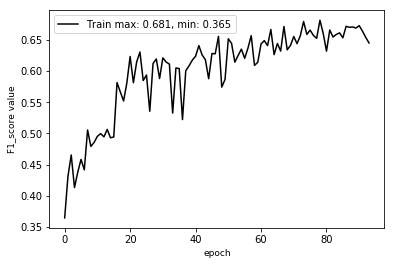

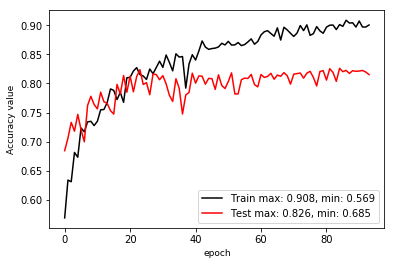

**** EPOCH 094 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.438141
accuracy: 0.902163
----
Overall accuracy：81.19  Average F1 score：65.90 
77.24 83.74 90.07 96.37 69.82 96.19 50.56 34.24 73.96 
61.67 77.26 92.45 43.69 14.34 87.42 68.50 51.33 82.90 
68.58 80.37 91.24 60.12 23.79 91.60 58.18 41.07 78.17 

learn rate: 0.000625
eval mean loss: 0.610096
eval accuracy: 0.811943
eval avg class acc: 0.643942


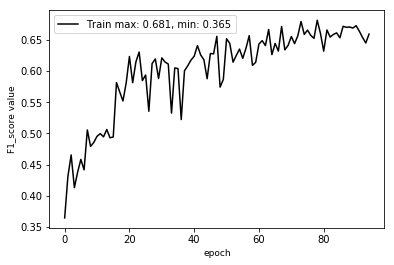

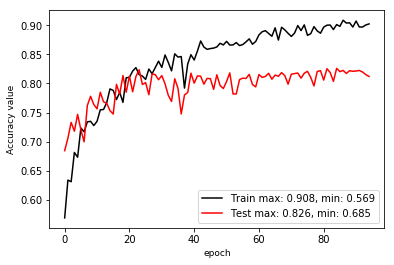

**** EPOCH 095 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.424319
accuracy: 0.902186
----
Overall accuracy：82.45  Average F1 score：67.95 
73.80 83.50 91.86 91.32 59.13 94.11 57.81 36.26 78.40 
64.33 78.13 90.58 60.17 12.30 92.70 63.68 55.09 82.15 
68.74 80.72 91.22 72.54 20.37 93.40 60.60 43.73 80.24 

learn rate: 0.000625
eval mean loss: 0.591813
eval accuracy: 0.824524
eval avg class acc: 0.665714


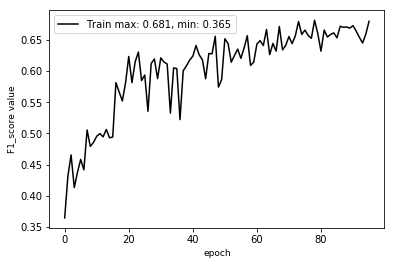

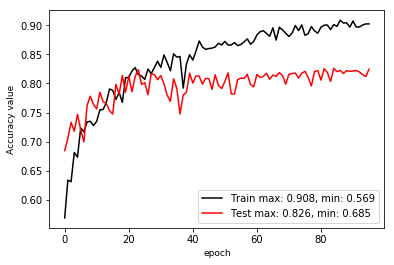

**** EPOCH 096 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.426491
accuracy: 0.900954
----
Overall accuracy：80.43  Average F1 score：64.41 
76.46 85.00 90.25 93.53 55.64 94.67 56.16 34.13 66.61 
54.67 76.17 92.89 56.53  6.12 86.09 59.84 47.88 84.63 
63.75 80.34 91.55 70.47 11.02 90.18 57.94 39.85 74.55 

learn rate: 0.000625
eval mean loss: 0.642416
eval accuracy: 0.804311
eval avg class acc: 0.627559


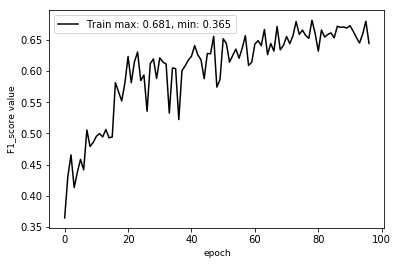

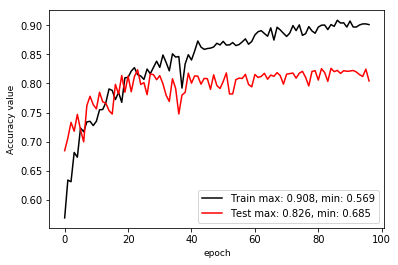

**** EPOCH 097 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.417335
accuracy: 0.908057
----
Overall accuracy：81.33  Average F1 score：65.73 
76.29 86.98 89.01 94.86 82.78 95.19 58.28 32.51 74.82 
56.83 72.43 94.04 51.78  9.07 90.35 61.60 56.03 83.32 
65.14 79.04 91.45 66.99 16.34 92.70 59.90 41.15 78.85 

learn rate: 0.000625
eval mean loss: 0.639324
eval accuracy: 0.813274
eval avg class acc: 0.639384


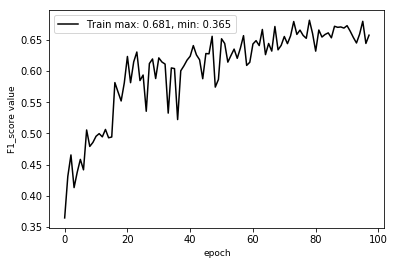

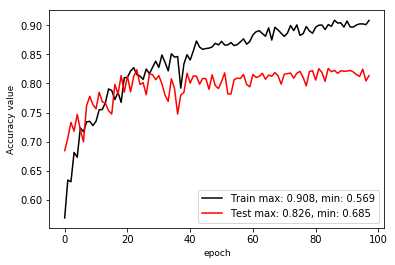

**** EPOCH 098 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.424962
accuracy: 0.897314
----
Overall accuracy：80.88  Average F1 score：61.06 
75.38 81.95 92.48 97.29 74.57 93.60 48.78 33.06 76.13 
49.00 78.26 88.50 25.16  6.36 91.47 68.61 50.64 80.78 
59.39 80.06 90.45 39.98 11.72 92.52 57.02 40.01 78.38 

learn rate: 0.000625
eval mean loss: 0.641986
eval accuracy: 0.808814
eval avg class acc: 0.598648


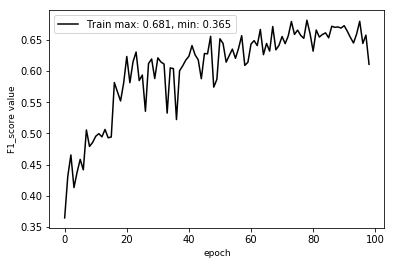

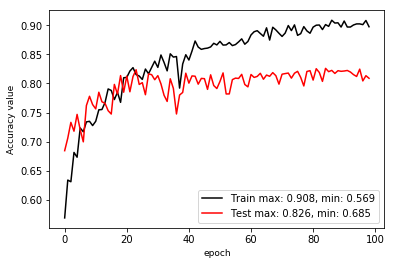

**** EPOCH 099 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000625
mean loss: 0.403115
accuracy: 0.902592
----
Overall accuracy：82.50  Average F1 score：67.31 
73.33 83.47 91.20 91.00 61.56 95.36 58.19 36.51 73.75 
62.33 78.83 91.30 58.93 11.52 91.62 64.90 46.52 85.99 
67.39 81.08 91.25 71.53 19.41 93.45 61.36 40.91 79.40 

learn rate: 0.000625
eval mean loss: 0.606808
eval accuracy: 0.825024
eval avg class acc: 0.657696


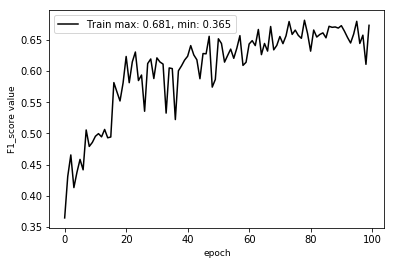

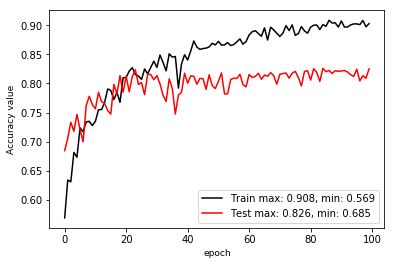

**** EPOCH 100 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.406321
accuracy: 0.904026
----
Overall accuracy：81.77  Average F1 score：65.75 
74.51 85.18 90.16 92.59 59.02 95.14 51.88 34.33 74.43 
51.17 75.35 92.78 53.26 12.38 90.72 69.89 48.14 84.36 
60.67 79.96 91.45 67.63 20.47 92.88 59.55 40.08 79.08 

learn rate: 0.000312
eval mean loss: 0.600409
eval accuracy: 0.817655
eval avg class acc: 0.642270


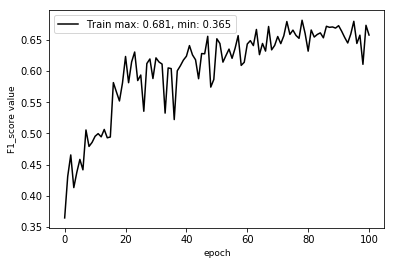

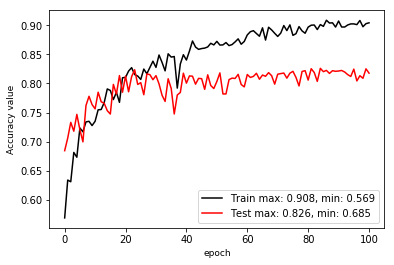

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 101 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.406483
accuracy: 0.900584
----
Overall accuracy：82.30  Average F1 score：66.65 
72.65 83.95 90.71 96.16 81.85 95.25 58.71 35.05 78.17 
68.17 77.55 91.79 46.57  9.30 91.79 64.41 55.91 82.41 
70.34 80.62 91.25 62.75 16.70 93.49 61.42 43.09 80.23 

learn rate: 0.000312
eval mean loss: 0.600231
eval accuracy: 0.823042
eval avg class acc: 0.653220


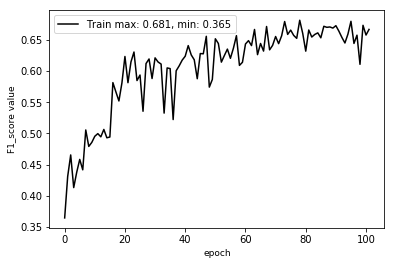

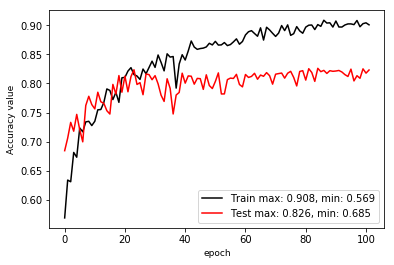

**** EPOCH 102 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.397031
accuracy: 0.916562
----
Overall accuracy：82.47  Average F1 score：67.37 
75.69 85.60 89.45 95.35 80.59 94.96 57.22 35.75 80.20 
63.83 76.32 93.62 52.00 10.29 92.17 66.35 58.97 79.45 
69.26 80.70 91.49 67.29 18.26 93.55 61.45 44.51 79.82 

learn rate: 0.000312
eval mean loss: 0.591004
eval accuracy: 0.824723
eval avg class acc: 0.658897


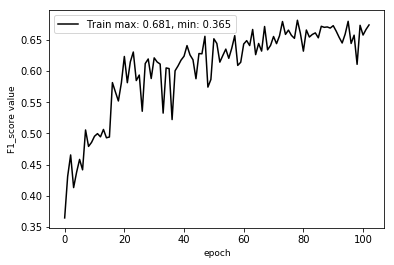

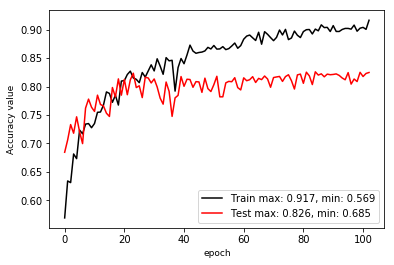

**** EPOCH 103 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.409507
accuracy: 0.895406
----
Overall accuracy：81.42  Average F1 score：66.16 
73.24 84.50 90.97 94.17 65.51 95.91 59.52 33.60 74.55 
58.83 75.50 91.33 50.54 10.95 89.65 61.72 58.24 83.66 
65.25 79.75 91.15 65.78 18.77 92.67 60.60 42.62 78.84 

learn rate: 0.000312
eval mean loss: 0.625884
eval accuracy: 0.814155
eval avg class acc: 0.644918


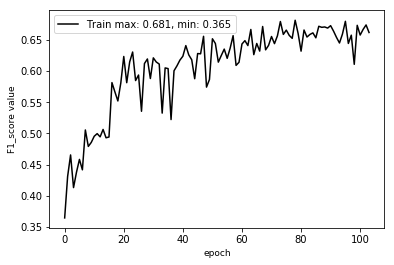

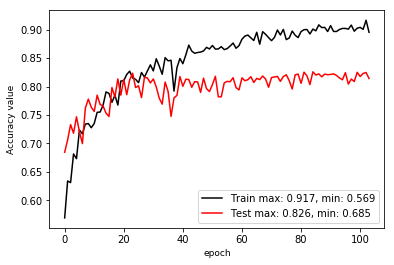

**** EPOCH 104 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.396046
accuracy: 0.901630
----
Overall accuracy：81.26  Average F1 score：65.43 
78.66 82.35 91.62 94.75 58.33 95.61 57.70 34.53 72.83 
51.00 76.75 89.19 50.16 10.33 89.75 64.21 52.23 86.48 
61.88 79.45 90.39 65.60 17.56 92.59 60.78 41.58 79.07 

learn rate: 0.000312
eval mean loss: 0.641184
eval accuracy: 0.812649
eval avg class acc: 0.633468


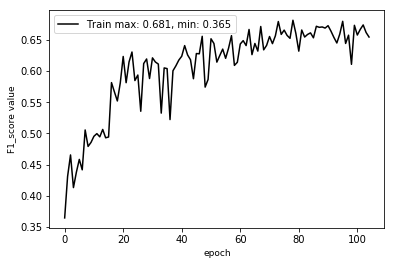

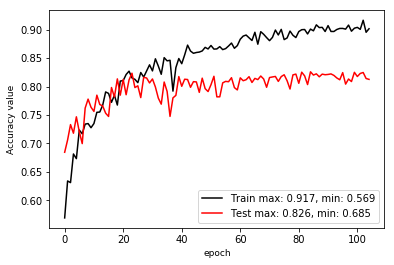

**** EPOCH 105 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.392485
accuracy: 0.895779
----
Overall accuracy：82.09  Average F1 score：66.08 
75.95 85.65 89.06 97.01 68.74 94.98 57.14 34.85 76.75 
56.83 74.80 93.56 47.33 10.85 91.91 65.21 53.20 83.17 
65.01 79.86 91.26 63.62 18.74 93.42 60.91 42.11 79.83 

learn rate: 0.000312
eval mean loss: 0.613430
eval accuracy: 0.820903
eval avg class acc: 0.640948


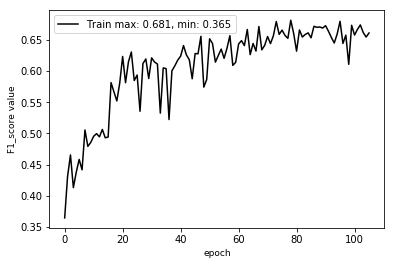

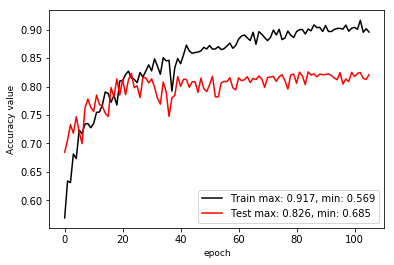

**** EPOCH 106 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.391622
accuracy: 0.913670
----
Overall accuracy：82.39  Average F1 score：67.85 
75.68 86.03 89.08 90.27 60.46 95.85 61.56 35.36 75.78 
65.33 75.60 94.03 60.54 10.90 91.08 62.00 54.03 84.05 
70.13 80.48 91.49 72.48 18.47 93.41 61.78 42.74 79.70 

learn rate: 0.000312
eval mean loss: 0.602238
eval accuracy: 0.823907
eval avg class acc: 0.663963


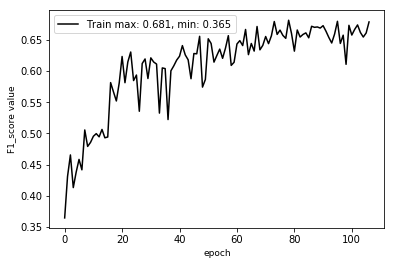

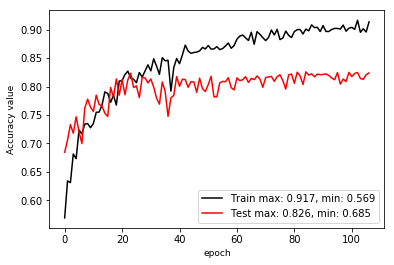

**** EPOCH 107 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.400651
accuracy: 0.907822
----
Overall accuracy：81.81  Average F1 score：66.19 
76.47 84.13 90.86 93.95 73.62 95.92 59.01 33.46 76.71 
54.17 75.75 91.27 54.83  8.42 91.11 64.32 56.64 83.68 
63.41 79.72 91.06 69.24 15.11 93.45 61.55 42.07 80.05 

learn rate: 0.000312
eval mean loss: 0.624015
eval accuracy: 0.818095
eval avg class acc: 0.644644


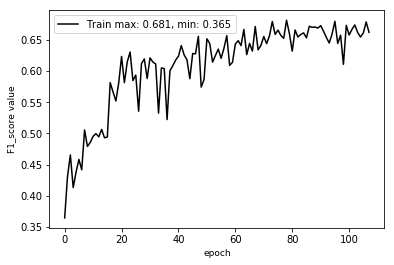

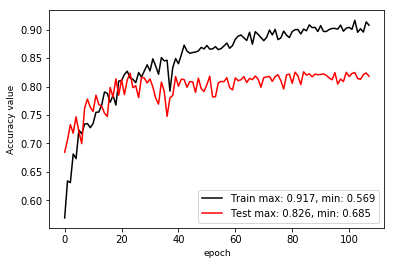

**** EPOCH 108 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.395367
accuracy: 0.913238
----
Overall accuracy：82.66  Average F1 score：67.50 
72.91 85.08 90.19 95.35 68.45 95.43 59.35 36.27 77.23 
68.17 76.67 92.84 50.35 11.72 92.22 62.67 55.25 84.00 
70.46 80.65 91.49 65.90 20.02 93.80 60.96 43.79 80.47 

learn rate: 0.000312
eval mean loss: 0.595730
eval accuracy: 0.826642
eval avg class acc: 0.659865


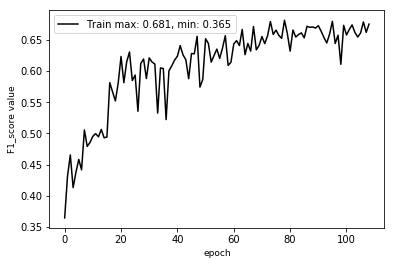

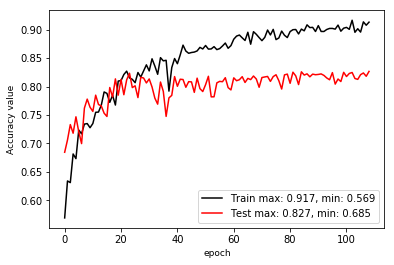

**** EPOCH 109 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.390841
accuracy: 0.909653
----
Overall accuracy：82.03  Average F1 score：67.08 
75.21 85.28 91.04 94.31 60.49 95.42 58.59 33.73 72.98 
59.67 74.99 91.85 53.21 14.73 91.80 64.65 48.49 87.07 
66.54 79.81 91.44 68.03 23.69 93.58 61.47 39.78 79.41 

learn rate: 0.000312
eval mean loss: 0.618361
eval accuracy: 0.820261
eval avg class acc: 0.651617


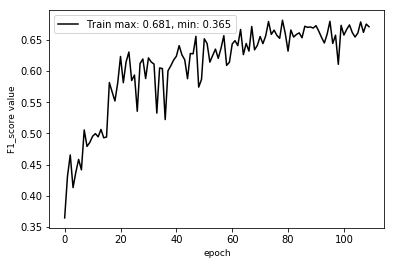

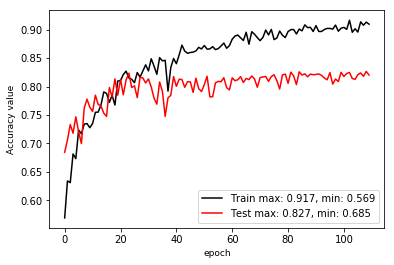

**** EPOCH 110 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.380980
accuracy: 0.911846
----
Overall accuracy：82.14  Average F1 score：67.37 
74.76 85.54 89.73 92.97 76.97 95.53 59.44 35.18 75.52 
64.67 75.19 93.20 57.79  9.50 90.94 63.85 55.30 84.14 
69.35 80.03 91.43 71.28 16.91 93.18 61.57 43.00 79.60 

learn rate: 0.000312
eval mean loss: 0.614038
eval accuracy: 0.821379
eval avg class acc: 0.660643


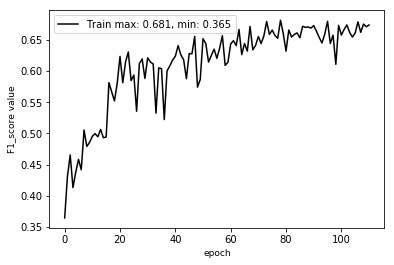

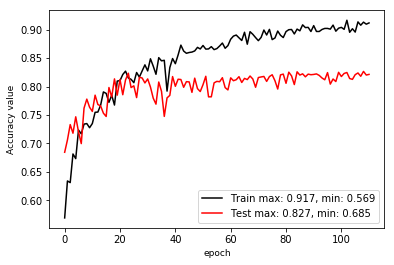

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 111 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.385934
accuracy: 0.905539
----
Overall accuracy：82.38  Average F1 score：66.57 
75.38 85.62 89.60 94.68 64.90 94.70 57.90 36.00 74.21 
58.17 76.17 93.54 51.86 11.86 91.79 63.08 48.21 85.44 
65.66 80.62 91.53 67.02 20.05 93.22 60.38 41.22 79.43 

learn rate: 0.000312
eval mean loss: 0.602385
eval accuracy: 0.823841
eval avg class acc: 0.644575


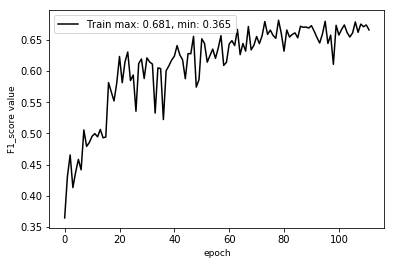

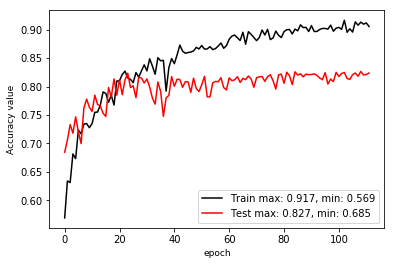

**** EPOCH 112 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.395690
accuracy: 0.915006
----
Overall accuracy：82.11  Average F1 score：67.32 
76.89 85.97 89.63 95.62 81.99 95.34 60.93 34.84 75.58 
69.33 75.46 93.66 50.65  9.75 90.61 63.37 56.24 83.29 
72.92 80.37 91.60 66.22 17.44 92.91 62.13 43.03 79.25 

learn rate: 0.000312
eval mean loss: 0.622470
eval accuracy: 0.821077
eval avg class acc: 0.658188


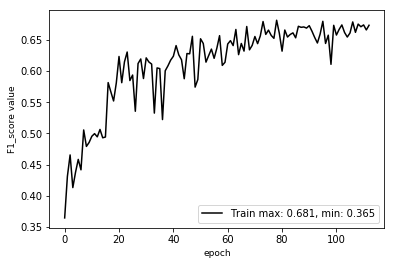

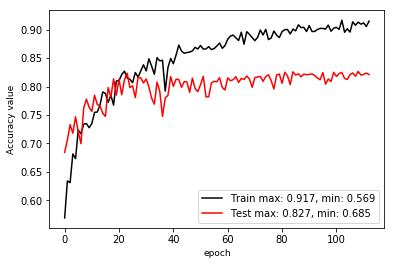

**** EPOCH 113 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.386366
accuracy: 0.906997
----
Overall accuracy：81.43  Average F1 score：65.95 
75.45 84.77 90.33 95.02 68.65 95.86 59.05 32.35 72.80 
62.50 74.68 92.07 53.53  7.94 90.50 62.27 50.39 85.83 
68.37 79.41 91.19 68.48 14.23 93.10 60.62 39.41 78.78 

learn rate: 0.000312
eval mean loss: 0.625362
eval accuracy: 0.814340
eval avg class acc: 0.644129


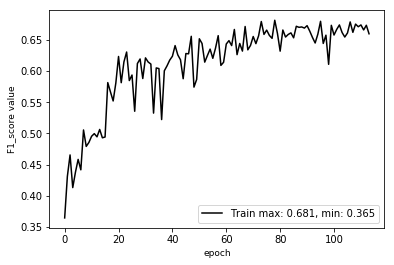

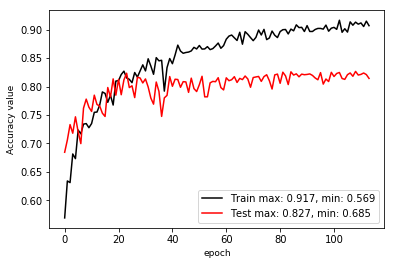

**** EPOCH 114 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.397510
accuracy: 0.895869
----
Overall accuracy：81.60  Average F1 score：66.23 
75.82 85.06 89.74 95.80 66.49 96.31 60.01 34.78 73.20 
53.83 76.11 92.89 52.24 11.84 88.73 60.50 56.27 83.89 
62.96 80.34 91.28 67.61 20.11 92.36 60.25 42.99 78.18 

learn rate: 0.000312
eval mean loss: 0.624238
eval accuracy: 0.816042
eval avg class acc: 0.640335


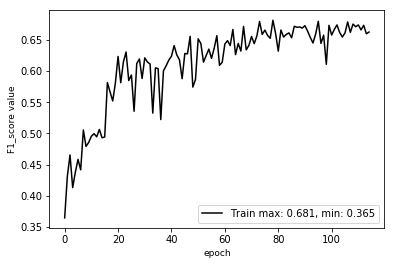

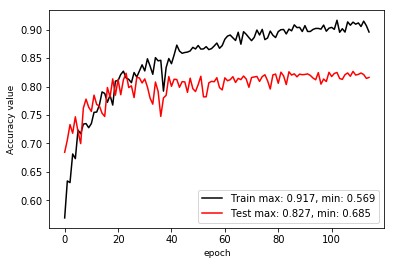

**** EPOCH 115 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.384058
accuracy: 0.908869
----
Overall accuracy：82.16  Average F1 score：67.01 
78.35 84.98 90.11 93.92 65.95 94.89 57.17 34.21 75.72 
58.50 75.34 92.51 50.84 14.85 92.63 64.83 49.55 84.18 
66.98 79.87 91.29 65.97 24.24 93.75 60.76 40.48 79.73 

learn rate: 0.000312
eval mean loss: 0.613466
eval accuracy: 0.821578
eval avg class acc: 0.648012


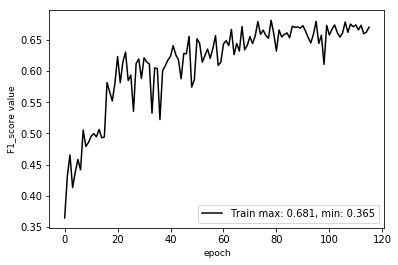

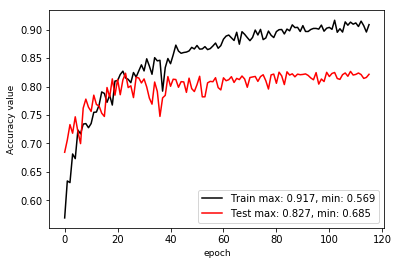

**** EPOCH 116 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.378316
accuracy: 0.902175
----
Overall accuracy：81.28  Average F1 score：65.67 
78.24 85.59 89.66 94.34 85.75 95.72 57.02 33.21 71.20 
53.33 73.16 92.89 53.02 10.70 90.11 62.63 50.11 86.49 
63.43 78.89 91.24 67.89 19.02 92.83 59.70 39.95 78.10 

learn rate: 0.000312
eval mean loss: 0.643518
eval accuracy: 0.812783
eval avg class acc: 0.636046


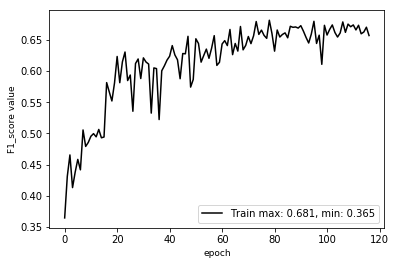

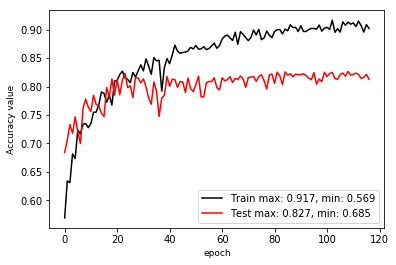

**** EPOCH 117 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.384653
accuracy: 0.911226
----
Overall accuracy：81.84  Average F1 score：68.28 
74.73 84.79 90.89 92.81 69.80 96.06 62.29 33.49 76.41 
70.50 75.75 92.11 57.79 14.70 90.63 57.08 59.76 82.17 
72.56 80.01 91.49 71.23 24.28 93.26 59.58 42.92 79.18 

learn rate: 0.000312
eval mean loss: 0.630967
eval accuracy: 0.818430
eval avg class acc: 0.667196


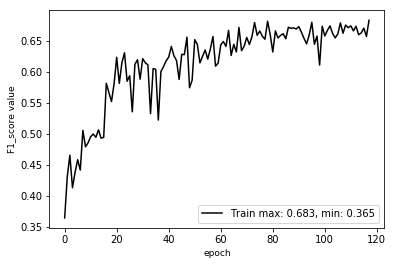

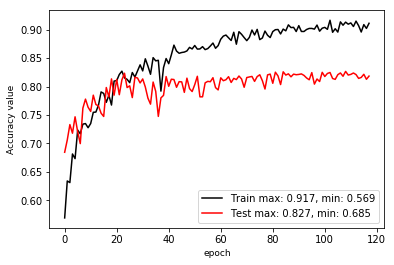

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/best_model_epoch_117.ckpt
**** EPOCH 118 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.387305
accuracy: 0.893322
----
Overall accuracy：81.51  Average F1 score：66.40 
75.28 84.91 91.17 96.99 72.61 95.79 57.27 33.22 74.29 
55.33 75.62 92.13 51.21 13.18 89.78 63.31 56.36 82.63 
63.78 80.00 91.65 67.03 22.31 92.69 60.14 41.80 78.24 

learn rate: 0.000312
eval mean loss: 0.625292
eval accuracy: 0.815105
eval avg class acc: 0.643945


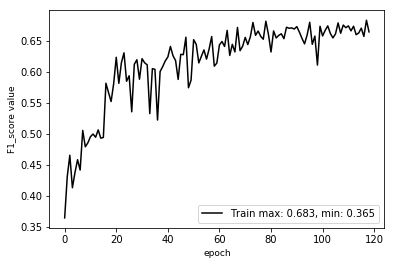

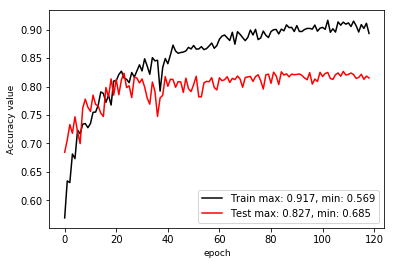

**** EPOCH 119 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000312
mean loss: 0.371500
accuracy: 0.905315
----
Overall accuracy：82.45  Average F1 score：67.43 
75.37 85.42 89.39 94.64 75.77 95.28 59.54 35.69 76.03 
58.67 75.87 93.47 55.23 13.31 92.01 62.21 52.74 83.83 
65.98 80.36 91.39 69.75 22.64 93.62 60.85 42.57 79.74 

learn rate: 0.000312
eval mean loss: 0.605370
eval accuracy: 0.824473
eval avg class acc: 0.652602


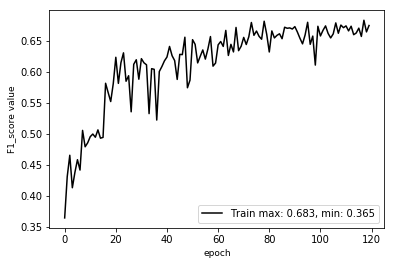

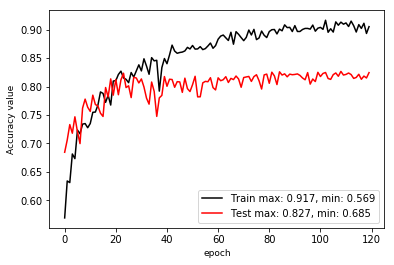

**** EPOCH 120 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.384281
accuracy: 0.903646
----
Overall accuracy：81.84  Average F1 score：66.58 
77.03 84.28 91.41 95.40 87.51 95.50 59.84 33.92 73.31 
64.83 76.65 91.60 49.73 10.29 90.64 60.46 52.79 85.15 
70.41 80.29 91.51 65.38 18.42 93.01 60.15 41.30 78.79 

learn rate: 0.000156
eval mean loss: 0.617015
eval accuracy: 0.818449
eval avg class acc: 0.646842


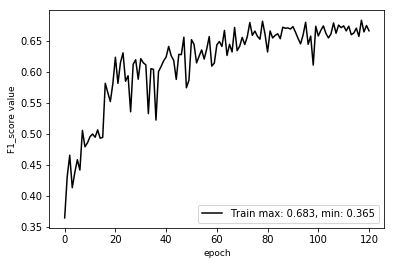

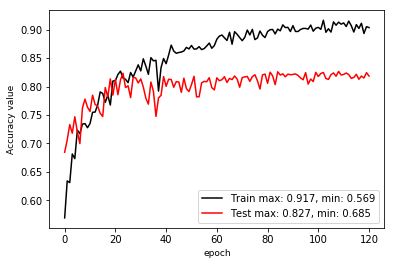

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 121 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.381507
accuracy: 0.914246
----
Overall accuracy：82.67  Average F1 score：67.54 
76.79 84.62 90.94 93.67 81.85 94.32 57.15 35.45 76.47 
66.17 77.03 92.07 55.10 11.79 93.57 61.01 49.31 84.86 
71.08 80.65 91.50 69.38 20.61 93.94 59.02 41.24 80.45 

learn rate: 0.000156
eval mean loss: 0.605299
eval accuracy: 0.826710
eval avg class acc: 0.656567


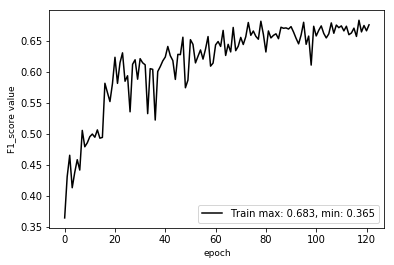

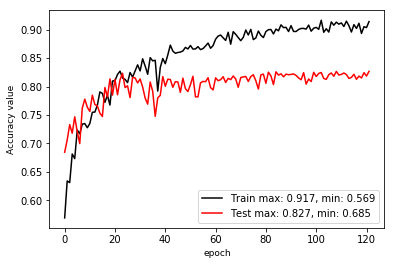

**** EPOCH 122 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.368116
accuracy: 0.898984
----
Overall accuracy：82.22  Average F1 score：66.27 
74.52 83.61 91.37 96.07 77.74 95.48 54.93 35.65 75.52 
65.33 78.39 91.20 42.88 11.95 91.13 64.58 52.13 84.27 
69.63 80.92 91.29 59.30 20.72 93.25 59.37 42.34 79.65 

learn rate: 0.000156
eval mean loss: 0.614282
eval accuracy: 0.822158
eval avg class acc: 0.646512


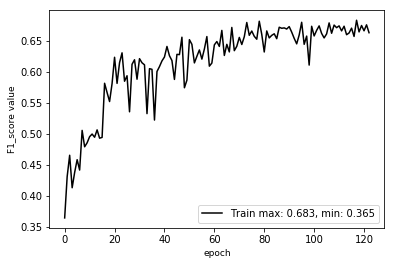

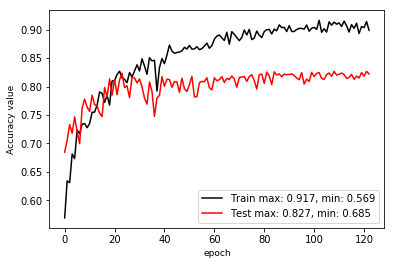

**** EPOCH 123 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.374264
accuracy: 0.905334
----
Overall accuracy：82.36  Average F1 score：67.34 
75.75 84.25 90.65 95.58 78.55 95.64 57.95 36.11 74.36 
67.17 77.42 92.04 50.76 11.99 91.22 63.00 51.40 85.44 
71.20 80.69 91.34 66.30 20.81 93.38 60.37 42.42 79.52 

learn rate: 0.000156
eval mean loss: 0.606223
eval accuracy: 0.823594
eval avg class acc: 0.656052


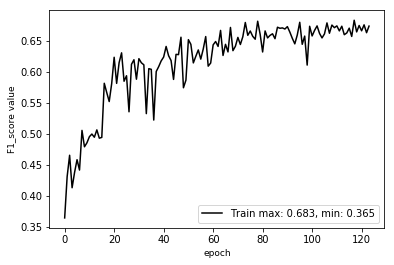

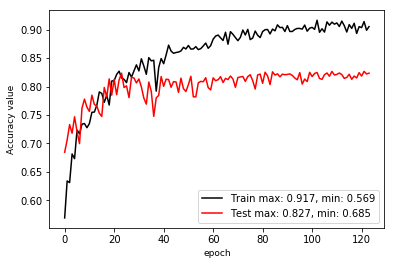

**** EPOCH 124 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.371189
accuracy: 0.906350
----
Overall accuracy：81.91  Average F1 score：67.90 
74.77 85.71 89.42 91.25 79.04 96.07 60.51 34.06 72.99 
67.67 74.67 93.33 59.63 13.82 90.59 59.92 51.33 85.72 
71.04 79.81 91.33 72.13 23.53 93.25 60.21 40.95 78.85 

learn rate: 0.000156
eval mean loss: 0.622117
eval accuracy: 0.819137
eval avg class acc: 0.662979


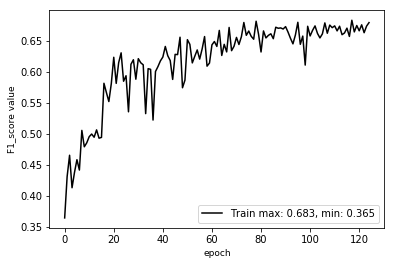

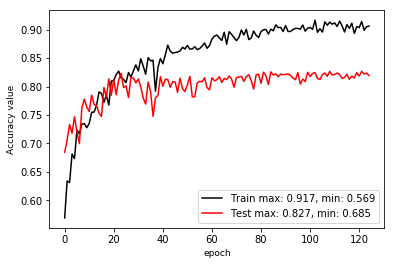

**** EPOCH 125 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.381533
accuracy: 0.911048
----
Overall accuracy：82.41  Average F1 score：67.23 
76.01 84.96 90.38 93.74 85.42 95.37 57.37 35.57 74.67 
62.83 76.75 92.70 54.88 11.60 91.74 61.89 50.87 85.08 
68.80 80.65 91.52 69.23 20.43 93.52 59.54 41.87 79.53 

learn rate: 0.000156
eval mean loss: 0.607432
eval accuracy: 0.824123
eval avg class acc: 0.653726


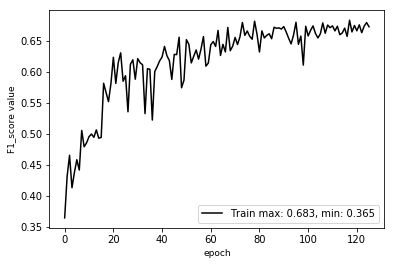

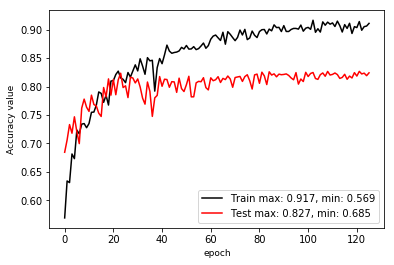

**** EPOCH 126 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.375308
accuracy: 0.912441
----
Overall accuracy：82.03  Average F1 score：67.32 
75.90 84.98 90.51 95.58 72.25 95.85 57.24 34.18 72.87 
63.50 76.07 92.55 52.54 15.29 90.85 61.79 48.80 86.12 
69.15 80.28 91.52 67.80 25.24 93.29 59.43 40.20 78.95 

learn rate: 0.000156
eval mean loss: 0.620008
eval accuracy: 0.820305
eval avg class acc: 0.652775


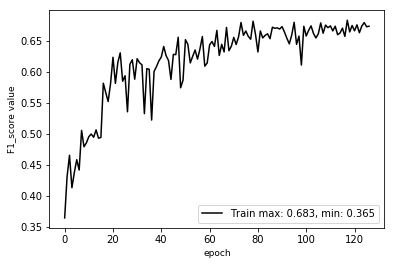

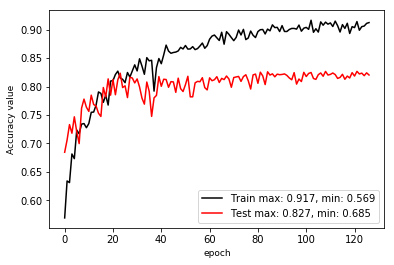

**** EPOCH 127 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.369445
accuracy: 0.906362
----
Overall accuracy：82.24  Average F1 score：66.97 
75.09 84.63 90.47 94.13 83.11 95.41 57.86 34.42 76.15 
66.33 76.46 92.40 51.05 10.94 91.97 61.97 52.75 83.82 
70.44 80.34 91.42 66.20 19.34 93.66 59.84 41.65 79.80 

learn rate: 0.000156
eval mean loss: 0.619364
eval accuracy: 0.822384
eval avg class acc: 0.653008


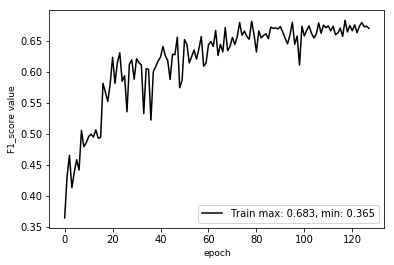

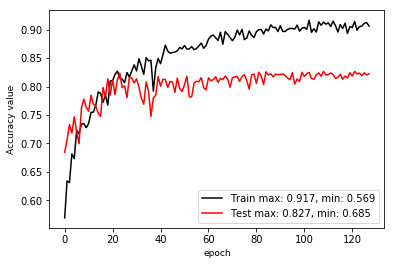

**** EPOCH 128 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.367980
accuracy: 0.903667
----
Overall accuracy：81.88  Average F1 score：67.06 
76.57 84.71 90.53 94.67 79.25 95.06 56.40 33.39 75.34 
58.83 74.40 91.99 55.61 13.43 92.28 63.35 51.04 84.90 
66.54 79.22 91.25 70.06 22.97 93.65 59.67 40.37 79.84 

learn rate: 0.000156
eval mean loss: 0.620094
eval accuracy: 0.818751
eval avg class acc: 0.650919


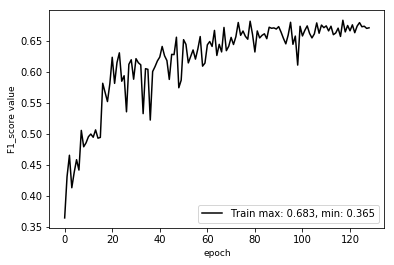

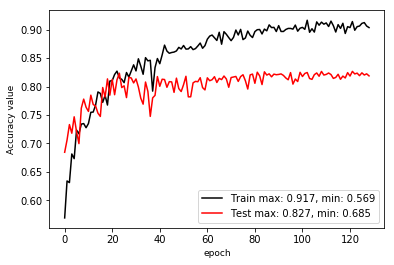

**** EPOCH 129 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.363193
accuracy: 0.904373
----
Overall accuracy：82.50  Average F1 score：68.10 
75.67 84.98 89.75 93.49 72.52 95.58 58.94 36.05 74.47 
65.83 76.63 93.19 58.47 14.19 91.49 60.86 49.60 85.72 
70.41 80.59 91.44 71.94 23.73 93.49 59.89 41.75 79.70 

learn rate: 0.000156
eval mean loss: 0.612284
eval accuracy: 0.824995
eval avg class acc: 0.662190


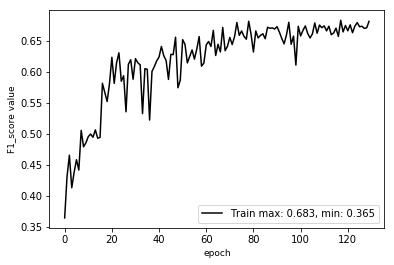

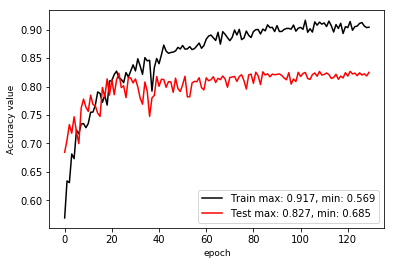

**** EPOCH 130 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.366755
accuracy: 0.908477
----
Overall accuracy：82.09  Average F1 score：68.08 
74.56 86.32 89.17 94.42 82.23 95.71 58.67 34.20 76.19 
71.33 73.34 93.74 57.96 12.03 91.85 61.92 55.58 84.16 
72.91 79.30 91.39 71.82 20.99 93.74 60.25 42.34 79.98 

learn rate: 0.000156
eval mean loss: 0.624054
eval accuracy: 0.820910
eval avg class acc: 0.668782


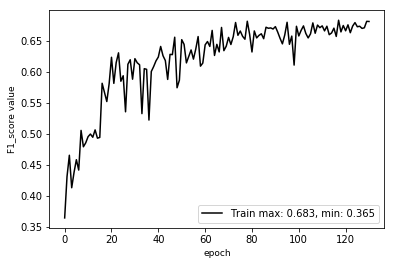

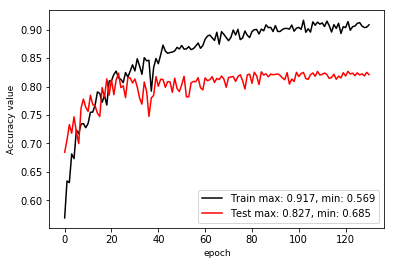

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 131 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.368306
accuracy: 0.901064
----
Overall accuracy：82.13  Average F1 score：66.85 
75.68 85.81 89.75 95.04 84.08 95.23 56.70 33.89 74.09 
69.50 74.18 93.18 50.59 10.60 92.50 63.52 48.30 86.35 
72.46 79.58 91.43 66.03 18.83 93.85 59.92 39.83 79.75 

learn rate: 0.000156
eval mean loss: 0.619370
eval accuracy: 0.821262
eval avg class acc: 0.654146


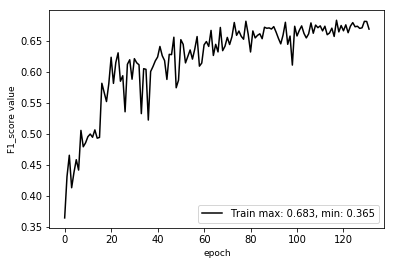

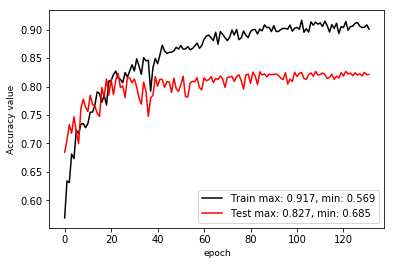

**** EPOCH 132 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.373386
accuracy: 0.907014
----
Overall accuracy：82.19  Average F1 score：66.91 
75.81 84.25 91.01 95.32 70.70 95.73 56.98 34.88 75.93 
58.50 76.38 91.58 52.78 11.90 91.44 64.00 53.84 85.10 
66.04 80.12 91.29 67.94 20.37 93.54 60.28 42.34 80.25 

learn rate: 0.000156
eval mean loss: 0.615132
eval accuracy: 0.821867
eval avg class acc: 0.650578


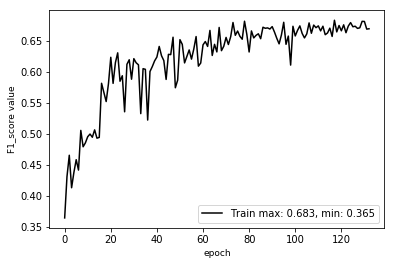

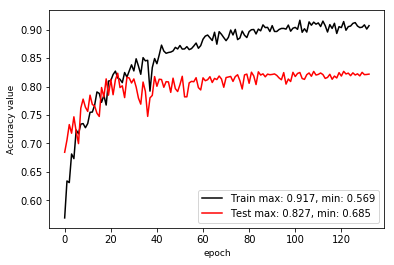

**** EPOCH 133 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.369143
accuracy: 0.903481
----
Overall accuracy：82.14  Average F1 score：67.06 
74.65 85.93 88.76 95.02 83.45 95.78 58.35 34.84 78.57 
61.33 74.00 93.79 51.48 11.61 91.50 62.25 59.08 82.88 
67.34 79.52 91.21 66.78 20.39 93.59 60.24 43.83 80.67 

learn rate: 0.000156
eval mean loss: 0.627165
eval accuracy: 0.821415
eval avg class acc: 0.653258


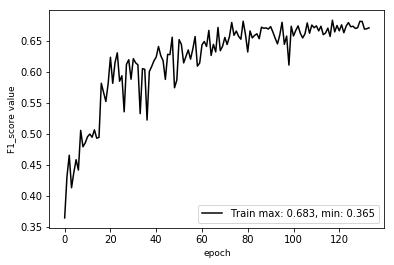

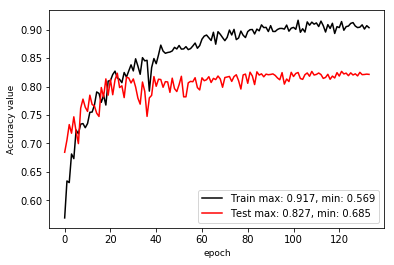

**** EPOCH 134 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.371508
accuracy: 0.909425
----
Overall accuracy：82.42  Average F1 score：66.97 
75.11 84.53 90.30 95.59 74.65 95.51 55.56 35.73 75.22 
58.33 76.87 92.40 52.56 13.57 91.72 63.33 49.50 85.82 
65.67 80.52 91.34 67.83 22.96 93.58 59.19 41.51 80.17 

learn rate: 0.000156
eval mean loss: 0.609784
eval accuracy: 0.824223
eval avg class acc: 0.649002


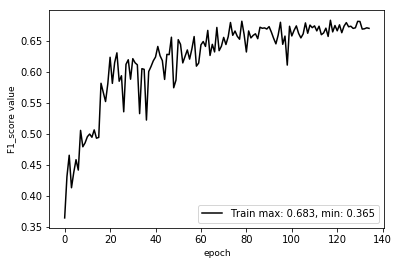

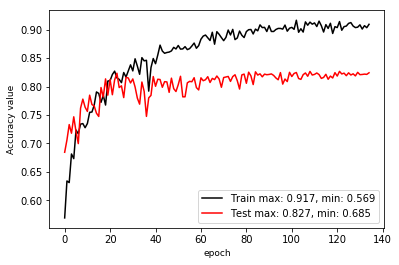

**** EPOCH 135 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.365751
accuracy: 0.911767
----
Overall accuracy：82.19  Average F1 score：67.34 
74.39 84.90 90.14 94.35 71.60 95.49 57.26 33.86 75.65 
60.50 75.20 92.42 56.28 14.13 92.30 62.32 49.98 85.55 
66.73 79.76 91.27 70.51 23.61 93.87 59.68 40.37 80.29 

learn rate: 0.000156
eval mean loss: 0.612345
eval accuracy: 0.821945
eval avg class acc: 0.654104


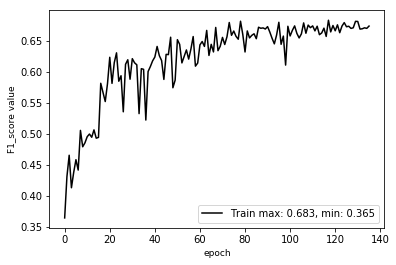

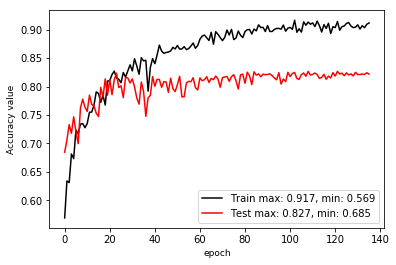

**** EPOCH 136 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.368635
accuracy: 0.910446
----
Overall accuracy：81.65  Average F1 score：66.68 
74.81 85.76 90.03 95.77 82.03 95.78 59.05 33.33 73.91 
66.83 73.73 92.88 48.84 11.20 90.56 62.40 54.42 85.54 
70.60 79.29 91.43 64.69 19.70 93.10 60.68 41.34 79.30 

learn rate: 0.000156
eval mean loss: 0.633809
eval accuracy: 0.816509
eval avg class acc: 0.651551


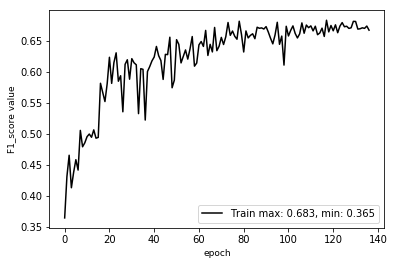

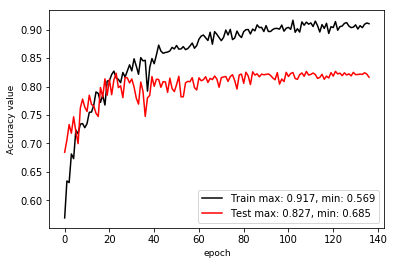

**** EPOCH 137 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.356176
accuracy: 0.908803
----
Overall accuracy：82.71  Average F1 score：67.51 
74.76 84.98 89.93 95.48 79.94 94.85 57.94 35.85 77.16 
66.17 76.22 92.87 53.53 11.01 93.05 64.11 50.56 85.15 
70.20 80.36 91.38 68.60 19.35 93.94 60.87 41.95 80.96 

learn rate: 0.000156
eval mean loss: 0.606643
eval accuracy: 0.827086
eval avg class acc: 0.658536


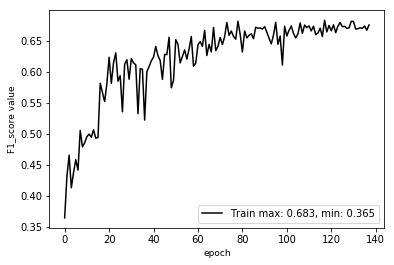

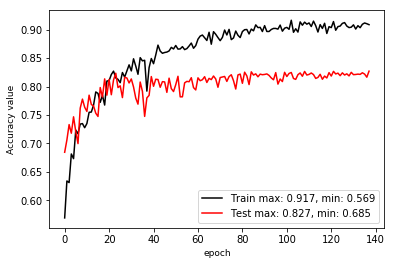

**** EPOCH 138 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.357746
accuracy: 0.913031
----
Overall accuracy：82.23  Average F1 score：67.68 
76.75 84.59 90.65 92.95 83.15 95.58 57.51 34.50 77.25 
62.17 75.68 91.93 58.98 11.17 91.92 64.37 55.34 83.93 
68.69 79.88 91.29 72.17 19.69 93.71 60.75 42.50 80.45 

learn rate: 0.000156
eval mean loss: 0.624888
eval accuracy: 0.822251
eval avg class acc: 0.661647


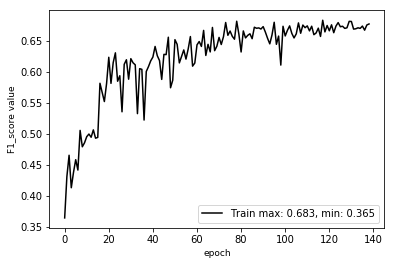

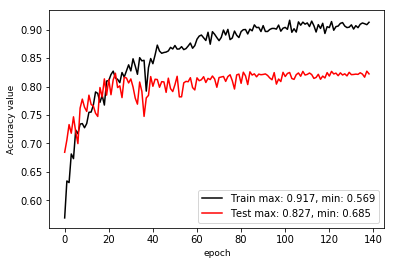

**** EPOCH 139 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000156
mean loss: 0.355597
accuracy: 0.921573
----
Overall accuracy：81.88  Average F1 score：66.73 
74.65 85.04 90.17 94.75 73.24 95.46 58.15 33.59 72.50 
61.33 74.93 92.54 54.99 12.31 91.31 61.64 47.01 87.25 
67.34 79.66 91.34 69.59 21.08 93.34 59.85 39.18 79.20 

learn rate: 0.000156
eval mean loss: 0.634572
eval accuracy: 0.818799
eval avg class acc: 0.648141


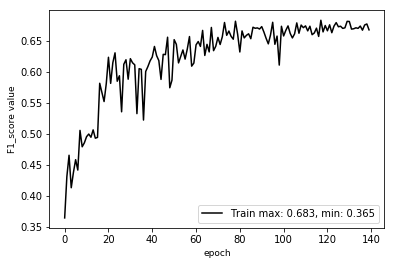

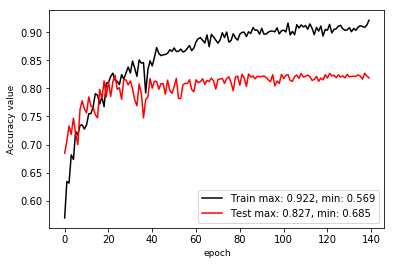

**** EPOCH 140 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.360975
accuracy: 0.902314
----
Overall accuracy：82.23  Average F1 score：67.44 
76.49 85.52 89.77 92.71 82.85 95.62 59.37 34.37 74.80 
66.17 75.06 93.27 54.88 12.05 91.81 60.46 51.60 85.46 
70.96 79.95 91.49 68.95 21.03 93.67 59.91 41.26 79.78 

learn rate: 0.000078
eval mean loss: 0.625939
eval accuracy: 0.822336
eval avg class acc: 0.656392


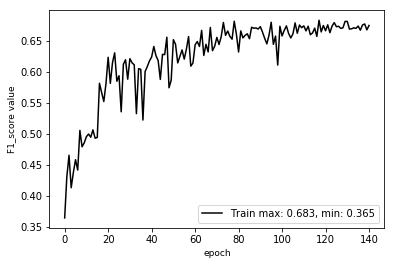

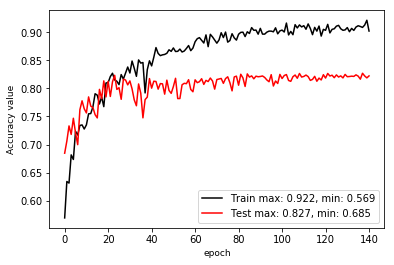

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 141 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.360859
accuracy: 0.902895
----
Overall accuracy：82.15  Average F1 score：67.18 
78.91 85.20 90.24 92.69 72.42 95.68 57.33 34.58 73.81 
58.00 75.35 92.77 55.07 13.90 91.37 63.05 49.72 86.26 
66.86 79.97 91.49 69.09 23.33 93.47 60.05 40.79 79.55 

learn rate: 0.000078
eval mean loss: 0.622571
eval accuracy: 0.821468
eval avg class acc: 0.650543


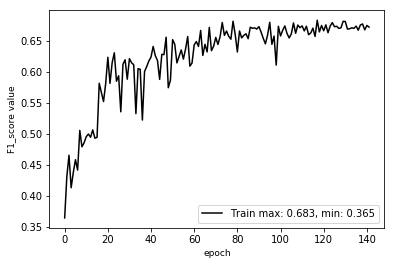

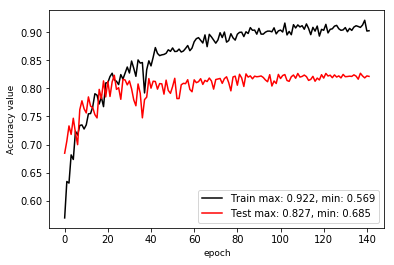

**** EPOCH 142 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.357633
accuracy: 0.910119
----
Overall accuracy：81.91  Average F1 score：67.29 
76.86 85.27 90.28 94.90 76.70 95.59 58.37 33.40 75.25 
65.33 73.97 92.45 53.21 12.33 91.89 62.30 53.34 85.30 
70.63 79.22 91.35 68.19 21.24 93.70 60.27 41.08 79.96 

learn rate: 0.000078
eval mean loss: 0.634435
eval accuracy: 0.819127
eval avg class acc: 0.655677


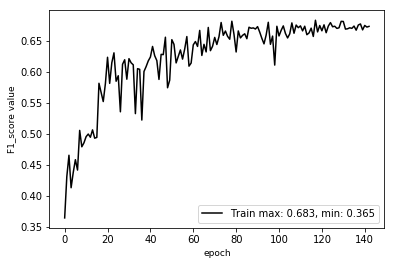

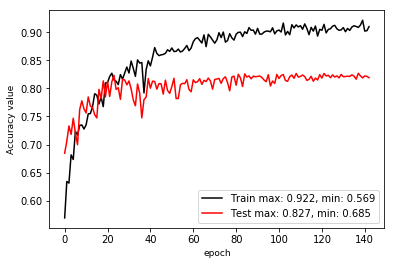

**** EPOCH 143 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.363636
accuracy: 0.905112
----
Overall accuracy：82.25  Average F1 score：67.43 
77.52 84.95 90.26 94.64 68.58 95.97 59.09 34.29 75.26 
60.33 76.30 92.78 54.77 13.55 91.12 61.81 51.91 85.10 
67.85 80.39 91.50 69.39 22.63 93.48 60.42 41.30 79.87 

learn rate: 0.000078
eval mean loss: 0.626772
eval accuracy: 0.822527
eval avg class acc: 0.652983


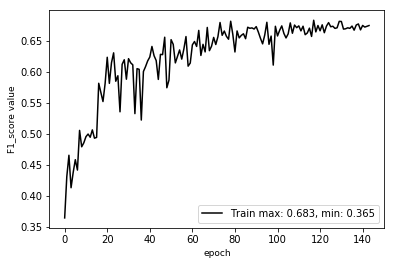

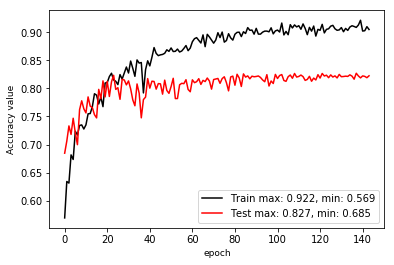

**** EPOCH 144 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.350937
accuracy: 0.912973
----
Overall accuracy：82.43  Average F1 score：67.63 
78.48 85.10 90.40 91.95 70.63 95.17 56.98 35.23 75.36 
60.17 76.05 92.55 56.96 14.00 92.32 63.23 50.12 85.25 
68.11 80.32 91.46 70.34 23.37 93.72 59.94 41.38 80.00 

learn rate: 0.000078
eval mean loss: 0.616324
eval accuracy: 0.824317
eval avg class acc: 0.656268


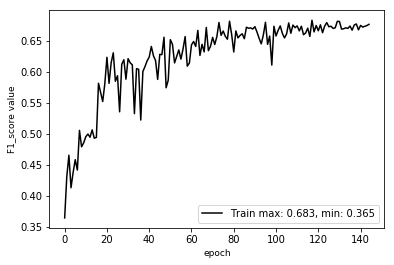

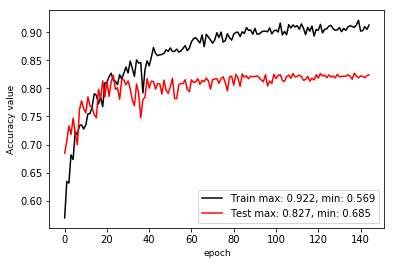

**** EPOCH 145 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.355986
accuracy: 0.913931
----
Overall accuracy：82.30  Average F1 score：67.60 
77.40 84.91 90.48 91.89 69.49 95.32 57.91 34.84 74.42 
60.50 75.76 92.43 56.50 15.01 92.06 62.23 49.20 86.05 
67.91 80.07 91.45 69.97 24.69 93.66 60.00 40.80 79.82 

learn rate: 0.000078
eval mean loss: 0.613049
eval accuracy: 0.823023
eval avg class acc: 0.655278


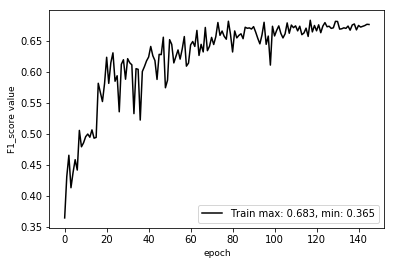

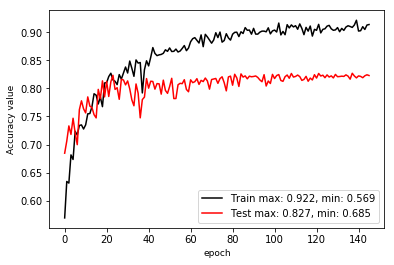

**** EPOCH 146 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.364469
accuracy: 0.903324
----
Overall accuracy：82.10  Average F1 score：67.67 
77.53 85.20 90.48 92.68 79.50 95.46 59.17 34.14 75.06 
63.83 74.52 92.39 56.72 12.85 91.90 61.51 53.30 85.68 
70.02 79.50 91.43 70.37 22.13 93.65 60.32 41.62 80.02 

learn rate: 0.000078
eval mean loss: 0.624994
eval accuracy: 0.820990
eval avg class acc: 0.658560


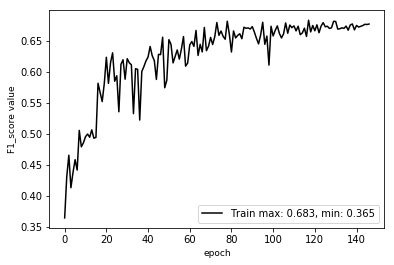

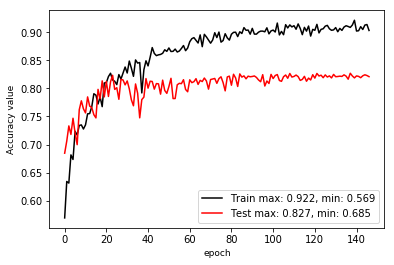

**** EPOCH 147 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.362985
accuracy: 0.908250
----
Overall accuracy：82.38  Average F1 score：67.40 
78.28 84.88 90.44 94.14 78.74 95.41 59.43 34.58 75.88 
60.67 75.88 92.46 55.88 11.63 92.28 61.78 52.21 85.17 
68.36 80.13 91.44 70.13 20.26 93.82 60.58 41.61 80.25 

learn rate: 0.000078
eval mean loss: 0.618225
eval accuracy: 0.823807
eval avg class acc: 0.653270


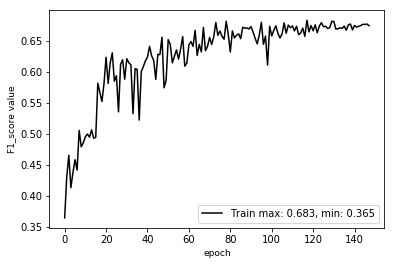

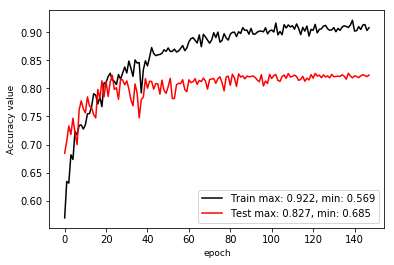

**** EPOCH 148 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.350597
accuracy: 0.915420
----
Overall accuracy：82.42  Average F1 score：67.93 
76.86 85.42 89.67 94.76 80.62 95.60 58.84 35.23 76.85 
67.00 75.61 93.26 56.04 11.49 91.75 62.79 54.69 84.11 
71.59 80.21 91.43 70.43 20.12 93.64 60.75 42.85 80.32 

learn rate: 0.000078
eval mean loss: 0.624547
eval accuracy: 0.824223
eval avg class acc: 0.663059


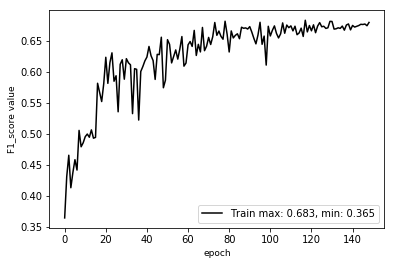

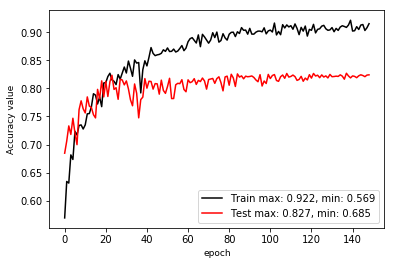

**** EPOCH 149 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.354705
accuracy: 0.906022
----
Overall accuracy：82.23  Average F1 score：67.62 
76.07 85.12 90.27 94.84 75.38 95.56 58.21 34.35 76.53 
67.83 75.36 92.62 54.56 11.34 91.87 63.05 54.19 84.36 
71.72 79.94 91.43 69.27 19.72 93.68 60.53 42.05 80.25 

learn rate: 0.000078
eval mean loss: 0.624846
eval accuracy: 0.822285
eval avg class acc: 0.661315


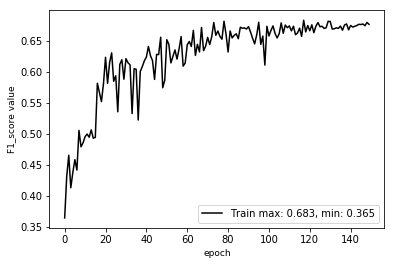

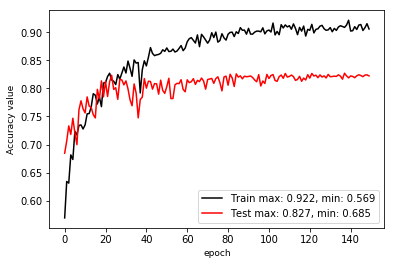

**** EPOCH 150 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.351284
accuracy: 0.907440
----
Overall accuracy：82.14  Average F1 score：67.54 
75.27 84.77 90.51 93.21 78.18 95.77 58.96 34.13 75.26 
70.00 75.87 92.35 54.77 11.44 91.57 61.02 52.96 84.84 
72.54 80.07 91.42 69.00 19.96 93.63 59.97 41.51 79.76 

learn rate: 0.000078
eval mean loss: 0.628508
eval accuracy: 0.821447
eval avg class acc: 0.660904


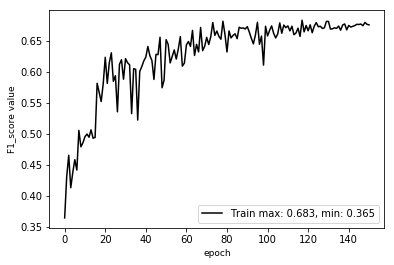

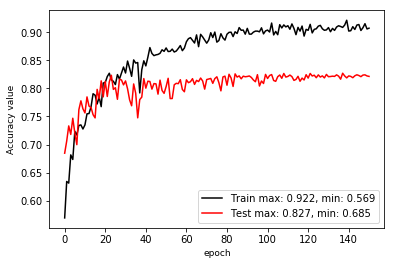

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 151 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.357923
accuracy: 0.914957
----
Overall accuracy：82.10  Average F1 score：67.23 
76.80 85.37 90.09 92.84 81.17 95.50 57.38 34.18 74.57 
62.33 75.25 92.89 55.96 12.31 91.50 62.06 51.18 85.21 
68.81 79.99 91.47 69.83 21.39 93.45 59.63 40.99 79.54 

learn rate: 0.000078
eval mean loss: 0.624023
eval accuracy: 0.820958
eval avg class acc: 0.654103


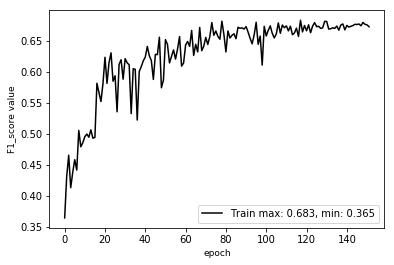

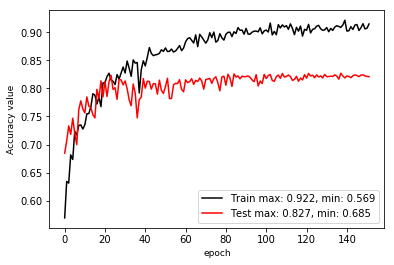

**** EPOCH 152 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.355477
accuracy: 0.912942
----
Overall accuracy：82.43  Average F1 score：67.63 
76.01 85.18 90.15 91.57 76.04 95.39 58.17 34.94 74.83 
66.00 76.09 92.99 55.99 13.04 92.08 61.69 49.44 85.57 
70.65 80.38 91.55 69.49 22.27 93.71 59.88 40.94 79.84 

learn rate: 0.000078
eval mean loss: 0.620069
eval accuracy: 0.824305
eval avg class acc: 0.658771


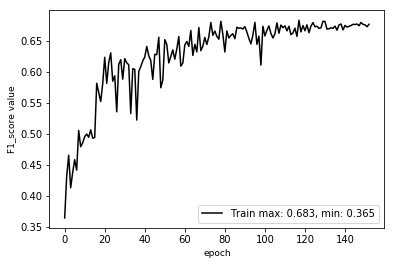

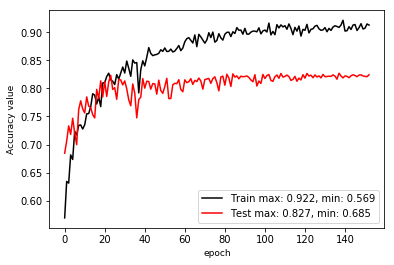

**** EPOCH 153 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.365133
accuracy: 0.910303
----
Overall accuracy：82.18  Average F1 score：67.26 
78.02 85.53 89.63 93.45 77.84 94.99 59.74 34.26 76.21 
60.33 74.62 93.09 54.67 12.21 92.32 62.02 52.78 84.38 
68.05 79.70 91.33 68.98 21.10 93.64 60.86 41.55 80.09 

learn rate: 0.000078
eval mean loss: 0.626490
eval accuracy: 0.821833
eval avg class acc: 0.651568


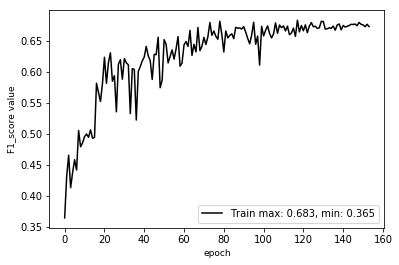

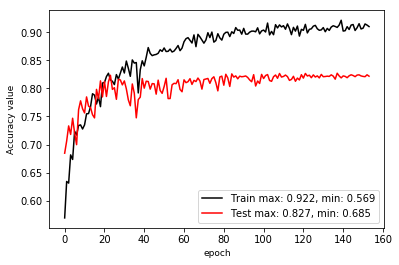

**** EPOCH 154 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.350264
accuracy: 0.913574
----
Overall accuracy：81.74  Average F1 score：66.97 
77.66 85.24 90.12 92.50 73.89 95.48 57.69 33.79 73.31 
60.83 74.71 92.70 55.23 12.77 90.72 62.31 50.97 85.44 
68.22 79.63 91.39 69.17 21.78 93.04 59.91 40.64 78.91 

learn rate: 0.000078
eval mean loss: 0.642912
eval accuracy: 0.817356
eval avg class acc: 0.650753


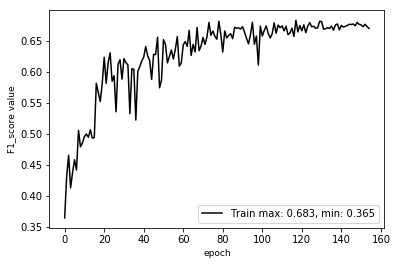

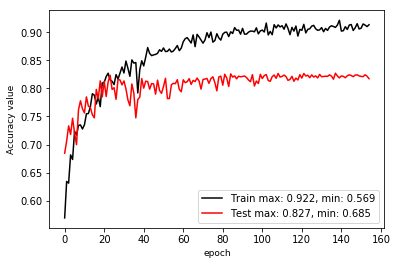

**** EPOCH 155 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.362947
accuracy: 0.903582
----
Overall accuracy：82.07  Average F1 score：67.42 
76.95 84.77 90.21 92.25 78.15 95.44 58.37 33.79 75.18 
64.00 75.39 92.56 54.56 13.54 91.88 62.08 50.80 84.72 
69.88 79.80 91.37 68.56 23.08 93.62 60.17 40.58 79.67 

learn rate: 0.000078
eval mean loss: 0.633905
eval accuracy: 0.820745
eval avg class acc: 0.655026


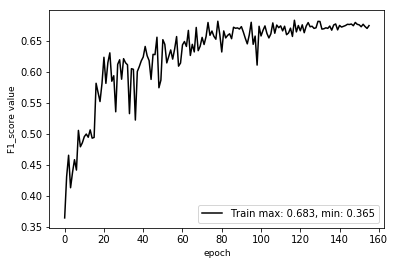

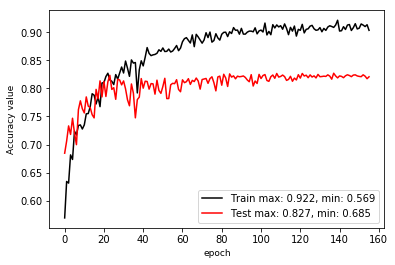

**** EPOCH 156 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.360010
accuracy: 0.912524
----
Overall accuracy：82.24  Average F1 score：67.65 
73.50 85.59 89.70 92.09 79.56 95.32 57.18 34.61 76.16 
69.33 74.82 93.30 54.96 12.80 92.09 62.89 52.64 84.22 
71.36 79.84 91.47 68.84 22.05 93.68 59.90 41.76 79.99 

learn rate: 0.000078
eval mean loss: 0.624424
eval accuracy: 0.822418
eval avg class acc: 0.663397


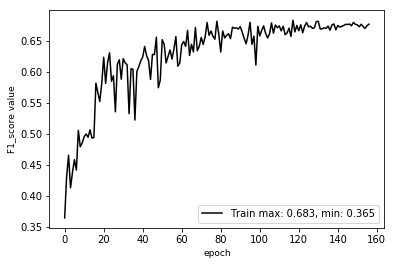

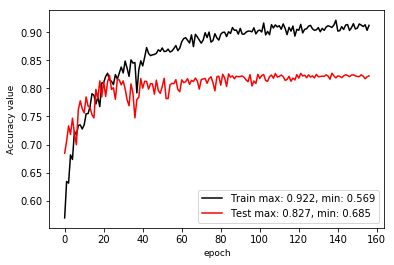

**** EPOCH 157 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.347383
accuracy: 0.913706
----
Overall accuracy：82.04  Average F1 score：67.38 
76.63 84.95 90.23 94.56 81.08 95.34 58.39 34.00 75.72 
64.50 74.76 92.46 52.99 12.76 91.92 62.94 53.11 84.63 
70.05 79.53 91.33 67.92 22.05 93.60 60.58 41.46 79.93 

learn rate: 0.000078
eval mean loss: 0.634881
eval accuracy: 0.820351
eval avg class acc: 0.655642


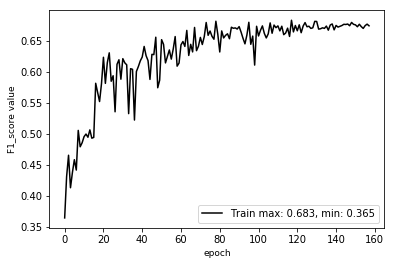

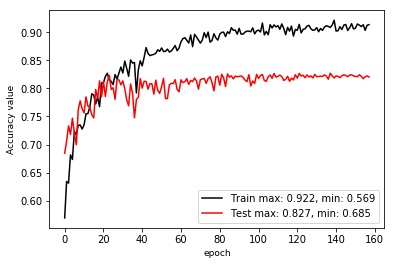

**** EPOCH 158 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.347910
accuracy: 0.907771
----
Overall accuracy：81.93  Average F1 score：67.29 
76.48 85.55 89.77 93.84 79.98 95.51 58.44 34.11 75.07 
62.33 74.41 93.10 53.80 13.35 91.14 61.86 53.87 84.58 
68.69 79.59 91.40 68.39 22.88 93.27 60.10 41.77 79.54 

learn rate: 0.000078
eval mean loss: 0.635898
eval accuracy: 0.819292
eval avg class acc: 0.653847


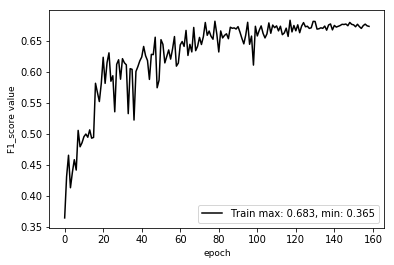

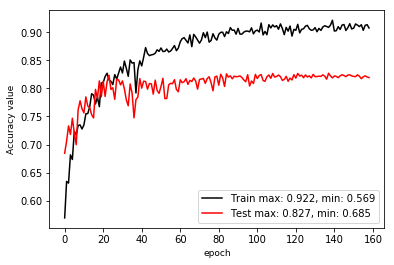

**** EPOCH 159 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000078
mean loss: 0.351728
accuracy: 0.911236
----
Overall accuracy：81.81  Average F1 score：67.60 
76.43 85.56 89.83 93.25 81.70 95.69 59.08 34.16 74.27 
67.00 74.34 93.00 55.88 12.69 90.57 60.68 54.76 84.87 
71.40 79.56 91.39 69.88 21.97 93.06 59.87 42.07 79.22 

learn rate: 0.000078
eval mean loss: 0.640989
eval accuracy: 0.818056
eval avg class acc: 0.659764


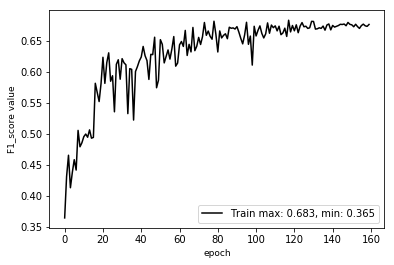

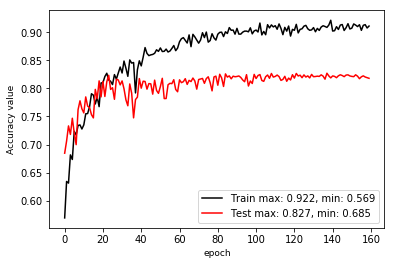

**** EPOCH 160 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.355531
accuracy: 0.903969
----
Overall accuracy：82.06  Average F1 score：67.07 
78.28 85.23 89.97 95.25 78.59 95.12 57.79 34.02 75.20 
60.67 74.99 92.85 53.02 12.76 91.94 62.47 51.22 84.61 
68.36 79.78 91.39 68.12 21.95 93.51 60.04 40.88 79.63 

learn rate: 0.000039
eval mean loss: 0.634334
eval accuracy: 0.820555
eval avg class acc: 0.649481


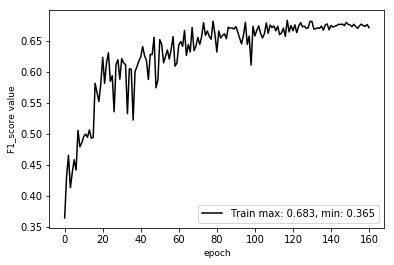

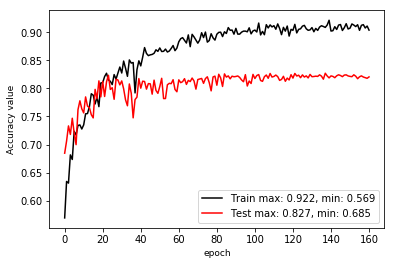

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 161 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.354487
accuracy: 0.913585
----
Overall accuracy：82.15  Average F1 score：67.50 
76.79 85.11 90.04 93.67 81.42 95.22 58.13 34.62 75.39 
67.83 75.54 92.78 53.91 12.17 91.79 61.19 52.47 84.41 
72.04 80.04 91.39 68.44 21.17 93.47 59.62 41.71 79.65 

learn rate: 0.000039
eval mean loss: 0.630352
eval accuracy: 0.821536
eval avg class acc: 0.657883


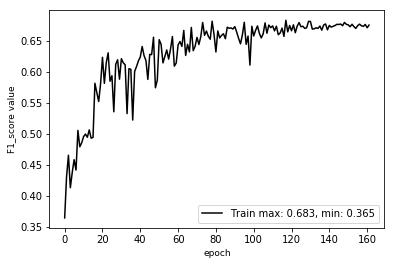

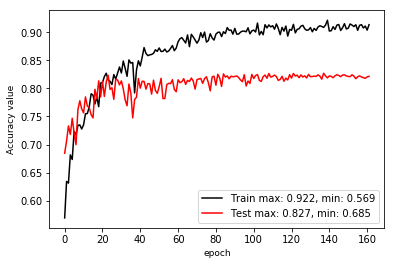

**** EPOCH 162 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.348696
accuracy: 0.911735
----
Overall accuracy：82.22  Average F1 score：67.64 
76.55 85.23 89.79 91.59 80.06 95.08 57.93 34.66 76.60 
65.83 75.30 92.90 57.31 11.74 92.22 62.78 53.15 83.49 
70.79 79.96 91.32 70.50 20.47 93.63 60.26 41.96 79.90 

learn rate: 0.000039
eval mean loss: 0.623799
eval accuracy: 0.822212
eval avg class acc: 0.660791


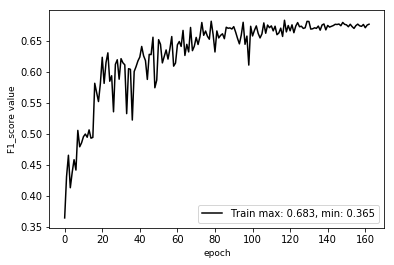

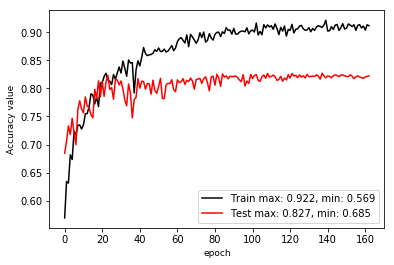

**** EPOCH 163 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.353397
accuracy: 0.912858
----
Overall accuracy：82.08  Average F1 score：67.70 
76.94 85.25 89.77 91.80 75.00 95.46 58.65 34.25 74.49 
64.50 75.16 92.97 57.04 14.03 91.55 61.81 50.46 85.06 
70.17 79.89 91.34 70.36 23.63 93.46 60.19 40.81 79.43 

learn rate: 0.000039
eval mean loss: 0.626530
eval accuracy: 0.820844
eval avg class acc: 0.658421


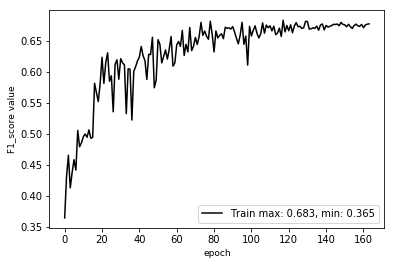

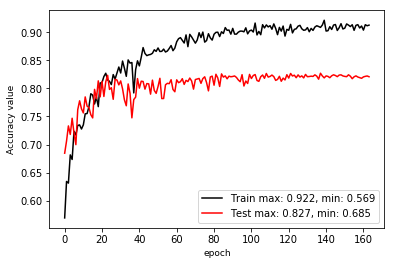

**** EPOCH 164 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.348504
accuracy: 0.911975
----
Overall accuracy：82.06  Average F1 score：67.35 
76.51 85.19 89.97 93.43 77.95 95.33 57.91 34.16 74.71 
63.50 75.20 92.85 54.85 13.19 91.68 62.23 50.92 84.71 
69.40 79.88 91.39 69.12 22.56 93.47 59.99 40.89 79.40 

learn rate: 0.000039
eval mean loss: 0.626221
eval accuracy: 0.820560
eval avg class acc: 0.654610


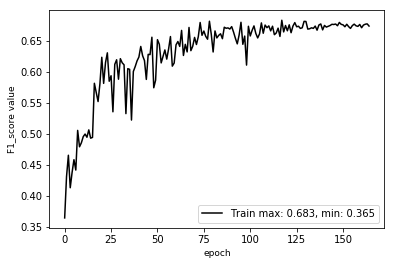

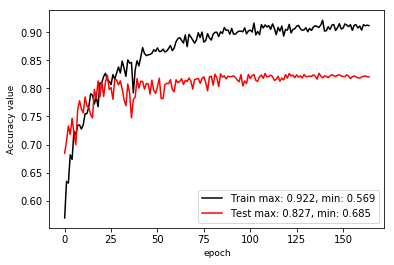

**** EPOCH 165 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.350957
accuracy: 0.909733
----
Overall accuracy：82.09  Average F1 score：67.79 
77.01 85.24 89.94 92.49 75.13 95.44 58.49 34.46 75.53 
65.33 75.14 92.90 55.77 13.88 91.54 62.27 53.41 83.94 
70.69 79.87 91.40 69.58 23.43 93.45 60.32 41.89 79.51 

learn rate: 0.000039
eval mean loss: 0.627961
eval accuracy: 0.820876
eval avg class acc: 0.660199


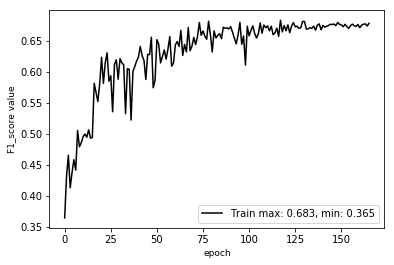

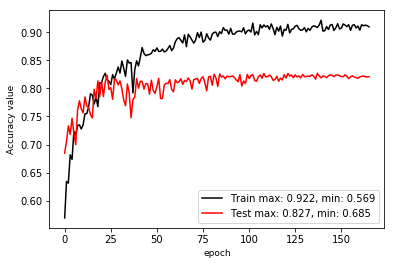

**** EPOCH 166 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.353295
accuracy: 0.913187
----
Overall accuracy：82.00  Average F1 score：67.52 
77.04 84.87 90.38 93.74 80.27 95.59 59.11 34.65 74.06 
66.00 76.16 92.57 54.91 12.67 90.63 60.52 53.11 84.54 
71.10 80.28 91.46 69.25 21.88 93.04 59.81 41.94 78.95 

learn rate: 0.000039
eval mean loss: 0.635231
eval accuracy: 0.819977
eval avg class acc: 0.656798


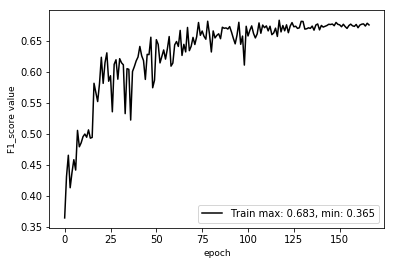

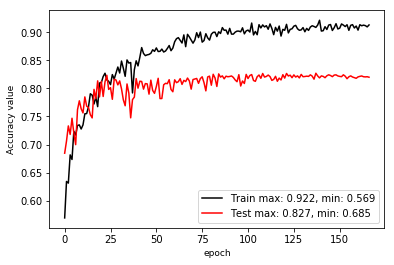

**** EPOCH 167 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.355256
accuracy: 0.909890
----
Overall accuracy：82.04  Average F1 score：67.45 
77.62 85.31 90.06 92.75 81.26 95.32 57.94 34.02 75.09 
64.17 74.74 92.80 56.26 12.33 91.77 61.99 52.08 84.89 
70.26 79.67 91.40 70.04 21.41 93.51 59.90 41.15 79.69 

learn rate: 0.000039
eval mean loss: 0.629037
eval accuracy: 0.820402
eval avg class acc: 0.656689


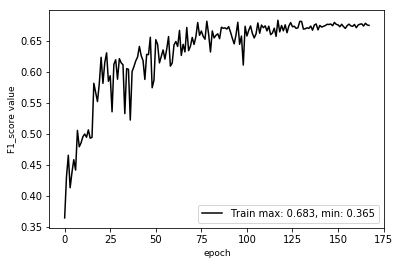

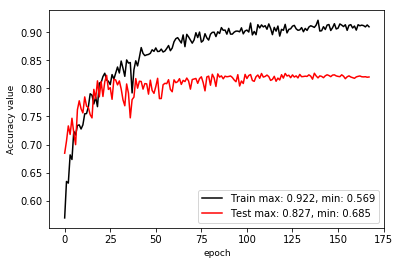

**** EPOCH 168 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.355956
accuracy: 0.903281
----
Overall accuracy：82.00  Average F1 score：67.33 
76.80 85.44 89.95 92.72 81.45 95.53 58.10 33.91 74.62 
64.00 74.75 92.99 55.61 12.30 91.42 62.55 51.76 84.99 
69.82 79.74 91.44 69.52 21.37 93.43 60.25 40.97 79.47 

learn rate: 0.000039
eval mean loss: 0.626946
eval accuracy: 0.820016
eval avg class acc: 0.655978


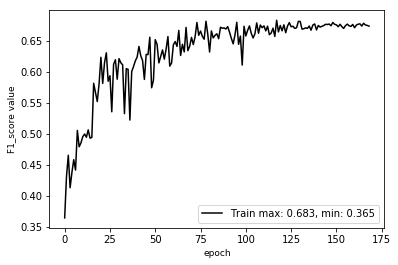

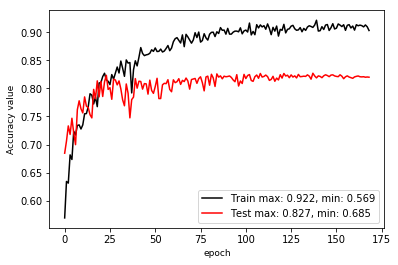

**** EPOCH 169 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.351369
accuracy: 0.912464
----
Overall accuracy：82.09  Average F1 score：67.56 
76.25 85.20 89.99 93.17 77.27 95.55 59.98 34.02 74.62 
65.83 75.22 92.86 54.48 13.42 91.57 60.82 51.64 85.07 
70.66 79.90 91.40 68.75 22.87 93.52 60.40 41.02 79.50 

learn rate: 0.000039
eval mean loss: 0.629031
eval accuracy: 0.820895
eval avg class acc: 0.656565


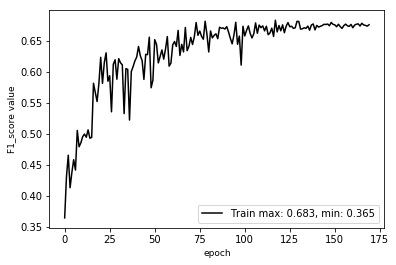

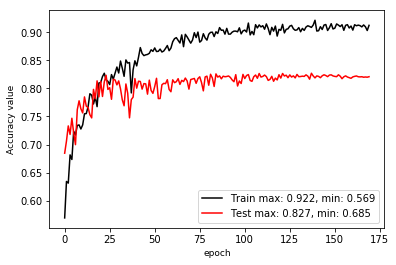

**** EPOCH 170 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.353444
accuracy: 0.907086
----
Overall accuracy：81.97  Average F1 score：67.65 
76.00 85.62 89.75 92.28 76.60 95.40 58.27 33.39 74.82 
66.50 74.13 93.14 56.42 13.85 91.79 62.02 50.84 85.06 
70.93 79.46 91.42 70.03 23.46 93.56 60.09 40.30 79.61 

learn rate: 0.000039
eval mean loss: 0.628036
eval accuracy: 0.819659
eval avg class acc: 0.659726


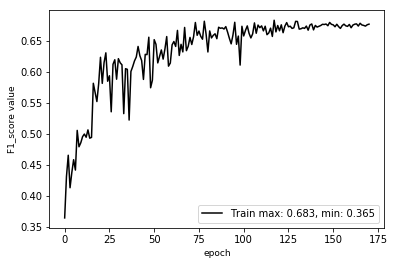

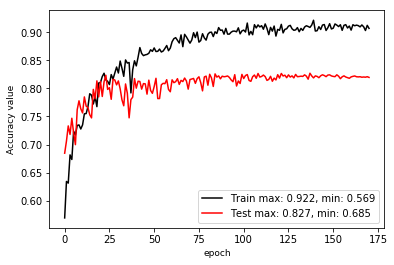

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 171 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.349690
accuracy: 0.910921
----
Overall accuracy：82.19  Average F1 score：67.50 
76.81 84.63 90.51 93.23 78.66 95.32 58.85 34.69 74.93 
63.50 76.29 92.28 55.31 13.11 91.62 60.91 51.85 84.74 
69.53 80.25 91.39 69.43 22.47 93.44 59.86 41.57 79.53 

learn rate: 0.000039
eval mean loss: 0.627792
eval accuracy: 0.821857
eval avg class acc: 0.655126


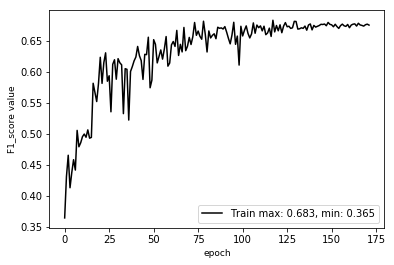

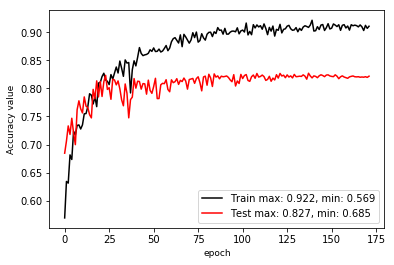

**** EPOCH 172 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.355111
accuracy: 0.918012
----
Overall accuracy：82.18  Average F1 score：67.51 
77.27 84.75 90.30 93.76 73.82 95.19 58.12 34.16 74.82 
65.17 75.77 92.51 55.10 13.30 92.13 61.81 49.23 85.19 
70.71 80.01 91.39 69.41 22.54 93.64 59.90 40.33 79.67 

learn rate: 0.000039
eval mean loss: 0.629157
eval accuracy: 0.821826
eval avg class acc: 0.655782


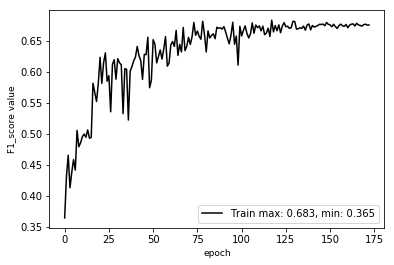

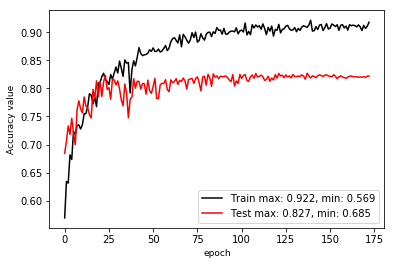

**** EPOCH 173 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.354253
accuracy: 0.904341
----
Overall accuracy：82.08  Average F1 score：67.52 
76.41 85.10 90.05 93.86 80.83 95.54 58.24 34.26 74.65 
65.33 75.33 92.76 55.26 12.84 91.42 61.98 51.53 85.11 
70.44 79.92 91.39 69.56 22.16 93.44 60.05 41.16 79.54 

learn rate: 0.000039
eval mean loss: 0.628618
eval accuracy: 0.820767
eval avg class acc: 0.657294


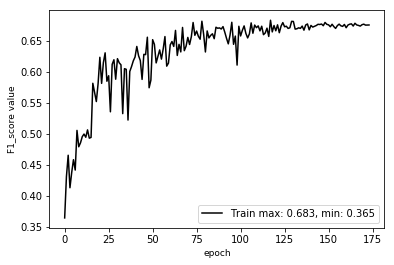

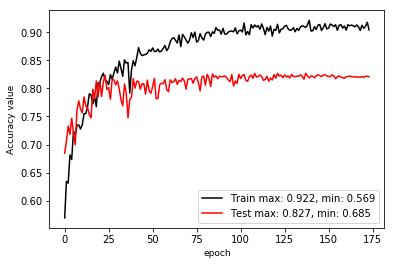

**** EPOCH 174 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.355038
accuracy: 0.899036
----
Overall accuracy：82.11  Average F1 score：67.78 
76.37 85.29 89.82 94.32 75.56 95.59 58.37 34.34 75.93 
67.33 75.02 92.93 55.99 12.62 91.54 61.89 53.81 84.29 
71.57 79.83 91.34 70.27 21.63 93.52 60.08 41.92 79.89 

learn rate: 0.000039
eval mean loss: 0.629299
eval accuracy: 0.821102
eval avg class acc: 0.661592


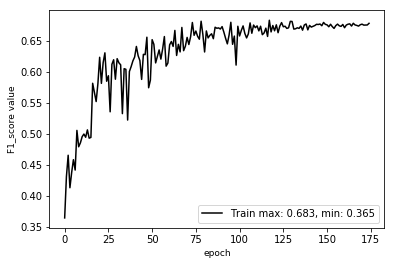

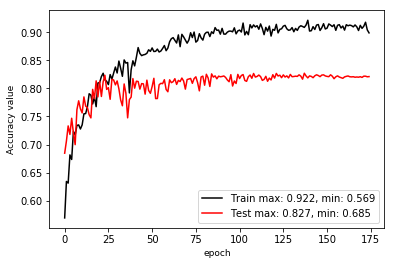

**** EPOCH 175 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.347790
accuracy: 0.911250
----
Overall accuracy：81.97  Average F1 score：67.80 
75.66 85.23 89.74 92.66 79.68 95.79 58.25 34.63 74.51 
67.33 75.05 92.97 56.85 13.53 90.76 61.15 53.36 84.85 
71.25 79.82 91.33 70.47 23.13 93.21 59.67 42.01 79.34 

learn rate: 0.000039
eval mean loss: 0.636161
eval accuracy: 0.819691
eval avg class acc: 0.662059


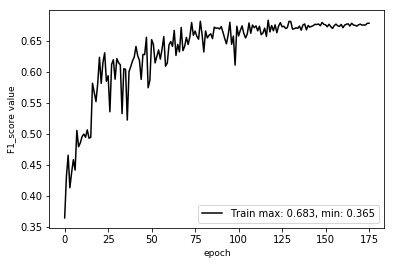

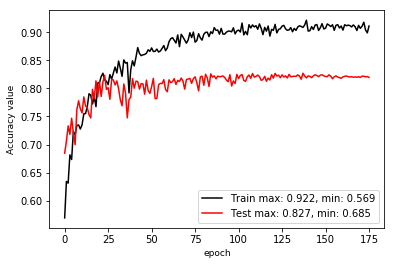

**** EPOCH 176 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.353407
accuracy: 0.918863
----
Overall accuracy：82.03  Average F1 score：67.44 
74.42 84.99 90.10 94.92 75.65 95.65 57.96 33.98 74.51 
69.33 75.52 92.69 52.89 13.27 91.34 61.46 50.98 85.08 
71.79 79.97 91.38 67.93 22.58 93.45 59.66 40.78 79.45 

learn rate: 0.000039
eval mean loss: 0.630440
eval accuracy: 0.820252
eval avg class acc: 0.658401


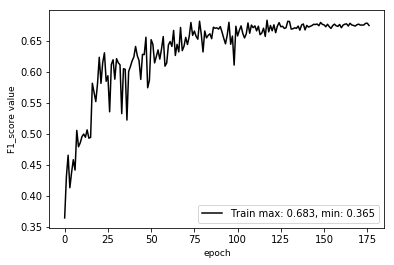

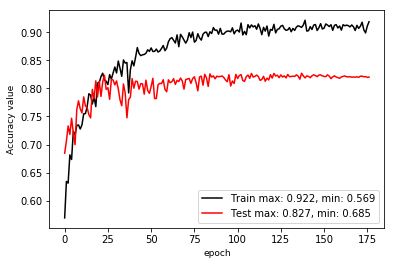

**** EPOCH 177 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.350944
accuracy: 0.915915
----
Overall accuracy：81.92  Average F1 score：67.62 
75.95 85.12 90.16 93.67 81.14 95.72 58.07 33.84 74.31 
66.83 75.20 92.70 56.69 12.81 90.97 61.76 52.16 84.83 
71.10 79.85 91.41 70.63 22.13 93.28 59.86 41.05 79.22 

learn rate: 0.000039
eval mean loss: 0.634902
eval accuracy: 0.819215
eval avg class acc: 0.659952


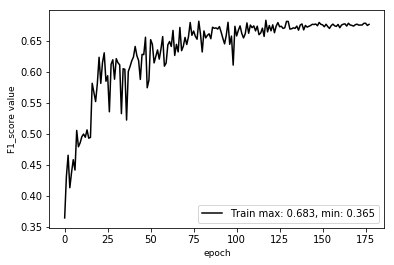

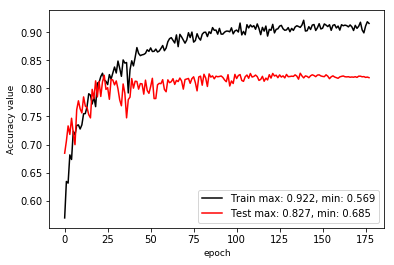

**** EPOCH 178 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.340494
accuracy: 0.898664
----
Overall accuracy：82.08  Average F1 score：67.72 
76.67 84.94 90.33 94.39 78.21 95.41 57.38 33.81 75.05 
65.17 75.40 92.45 56.23 13.69 91.77 63.30 50.53 84.93 
70.45 79.89 91.38 70.47 23.30 93.55 60.20 40.51 79.68 

learn rate: 0.000039
eval mean loss: 0.633828
eval accuracy: 0.820847
eval avg class acc: 0.659405


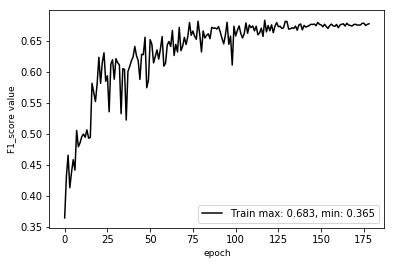

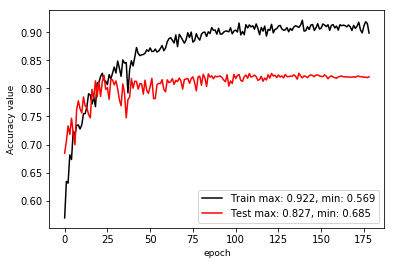

**** EPOCH 179 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000039
mean loss: 0.348976
accuracy: 0.908056
----
Overall accuracy：82.12  Average F1 score：67.70 
76.12 85.19 90.09 95.16 75.37 95.41 59.51 34.08 75.41 
68.00 75.11 92.72 53.05 13.61 91.83 61.01 52.73 84.75 
71.83 79.83 91.39 68.12 23.05 93.58 60.25 41.40 79.81 

learn rate: 0.000039
eval mean loss: 0.628892
eval accuracy: 0.821184
eval avg class acc: 0.658670


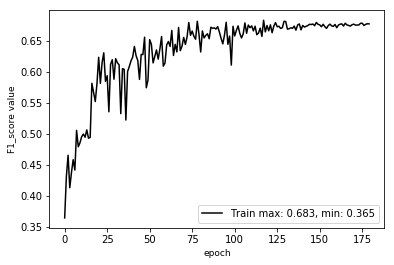

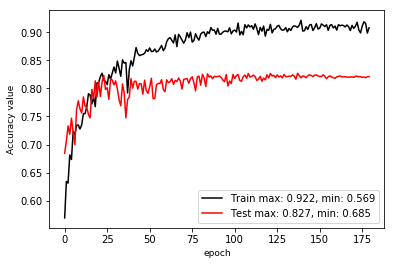

**** EPOCH 180 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.351153
accuracy: 0.909266
----
Overall accuracy：82.21  Average F1 score：67.68 
76.50 84.96 90.20 94.23 79.40 95.54 58.49 34.75 75.54 
65.67 75.93 92.73 55.04 12.83 91.42 61.53 53.30 84.39 
70.67 80.19 91.44 69.49 22.09 93.44 59.97 42.07 79.72 

learn rate: 0.000020
eval mean loss: 0.626020
eval accuracy: 0.822100
eval avg class acc: 0.658703


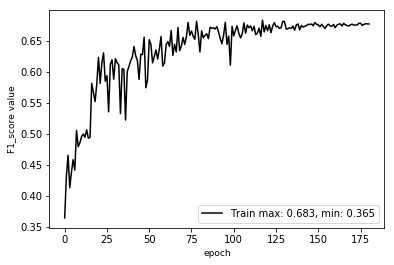

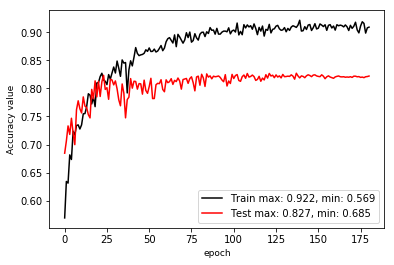

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 181 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.341342
accuracy: 0.906027
----
Overall accuracy：82.16  Average F1 score：67.82 
76.01 85.16 89.98 92.50 77.94 95.50 59.43 34.45 75.37 
66.00 75.29 92.83 56.88 13.38 91.61 60.91 52.92 84.70 
70.65 79.92 91.38 70.44 22.84 93.52 60.16 41.73 79.76 

learn rate: 0.000020
eval mean loss: 0.630762
eval accuracy: 0.821614
eval avg class acc: 0.660576


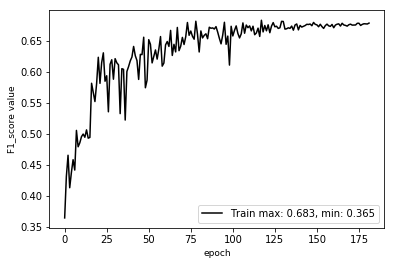

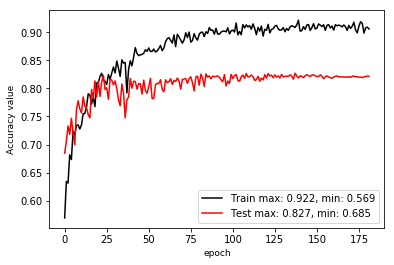

**** EPOCH 182 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.355188
accuracy: 0.912775
----
Overall accuracy：82.09  Average F1 score：67.52 
76.91 85.29 89.91 93.24 80.07 95.46 58.56 34.57 75.16 
63.83 74.96 92.90 55.45 12.77 91.46 61.75 53.29 84.76 
69.76 79.79 91.38 69.54 22.03 93.42 60.11 41.93 79.67 

learn rate: 0.000020
eval mean loss: 0.629758
eval accuracy: 0.820852
eval avg class acc: 0.656856


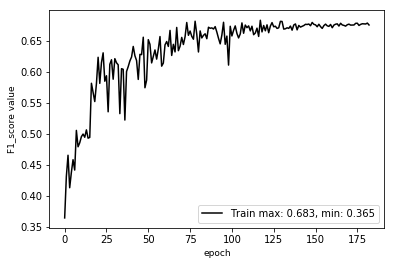

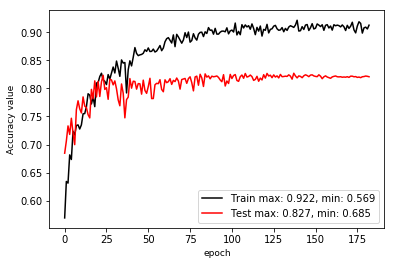

**** EPOCH 183 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.345657
accuracy: 0.911938
----
Overall accuracy：82.00  Average F1 score：67.56 
76.18 85.13 90.08 93.07 78.04 95.48 58.81 34.18 74.85 
64.50 74.88 92.69 56.12 13.16 91.41 61.44 52.75 84.97 
69.86 79.68 91.36 70.02 22.53 93.40 60.10 41.48 79.59 

learn rate: 0.000020
eval mean loss: 0.630504
eval accuracy: 0.819997
eval avg class acc: 0.657686


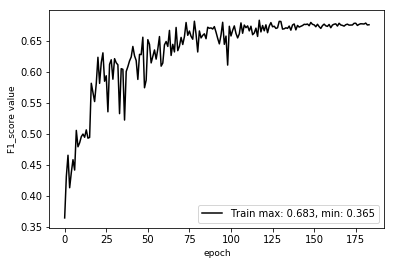

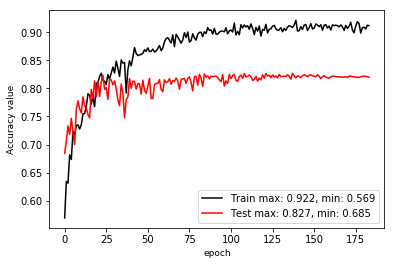

**** EPOCH 184 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.345235
accuracy: 0.894549
----
Overall accuracy：82.12  Average F1 score：67.64 
76.08 84.88 90.07 93.47 79.24 95.50 58.96 34.52 74.95 
67.33 75.53 92.64 55.23 12.65 91.52 61.36 52.05 84.99 
71.44 79.93 91.34 69.44 21.82 93.47 60.14 41.51 79.66 

learn rate: 0.000020
eval mean loss: 0.632724
eval accuracy: 0.821196
eval avg class acc: 0.659234


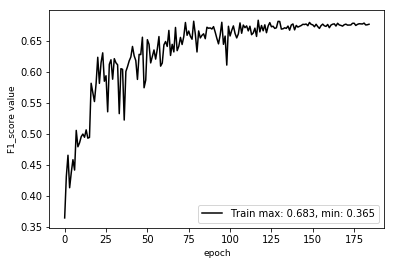

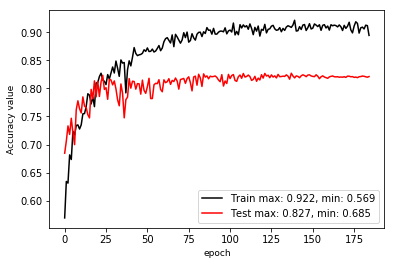

**** EPOCH 185 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.340179
accuracy: 0.911500
----
Overall accuracy：82.02  Average F1 score：67.62 
76.14 85.06 89.96 93.08 77.92 95.54 59.36 34.12 74.72 
67.00 75.05 92.75 55.50 12.93 91.44 61.18 52.03 85.08 
71.28 79.74 91.34 69.54 22.19 93.44 60.26 41.22 79.57 

learn rate: 0.000020
eval mean loss: 0.634372
eval accuracy: 0.820244
eval avg class acc: 0.658858


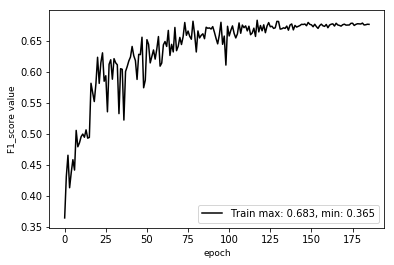

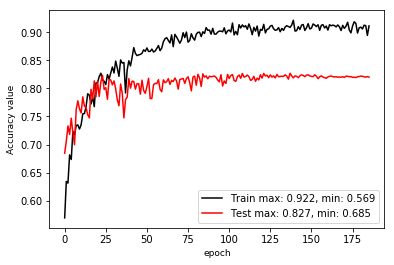

**** EPOCH 186 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.339368
accuracy: 0.910025
----
Overall accuracy：81.93  Average F1 score：67.35 
78.12 85.12 89.99 92.87 77.56 95.54 58.13 33.99 74.32 
63.67 74.77 92.73 55.50 12.85 91.36 61.33 51.56 85.31 
70.16 79.61 91.34 69.48 22.05 93.40 59.69 40.97 79.43 

learn rate: 0.000020
eval mean loss: 0.634754
eval accuracy: 0.819285
eval avg class acc: 0.654532


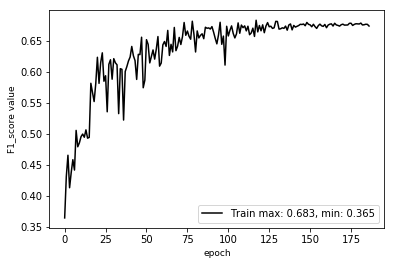

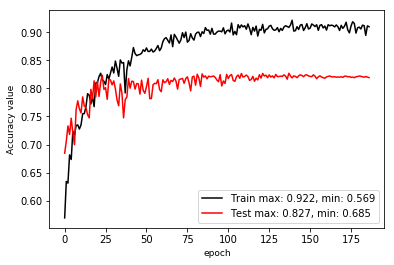

**** EPOCH 187 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.358506
accuracy: 0.906080
----
Overall accuracy：81.99  Average F1 score：67.28 
78.23 85.05 89.90 93.39 81.48 95.55 58.03 34.02 74.85 
63.50 74.99 92.73 54.45 12.45 91.50 61.94 51.72 85.01 
70.10 79.70 91.29 68.79 21.60 93.48 59.92 41.04 79.61 

learn rate: 0.000020
eval mean loss: 0.632359
eval accuracy: 0.819878
eval avg class acc: 0.653645


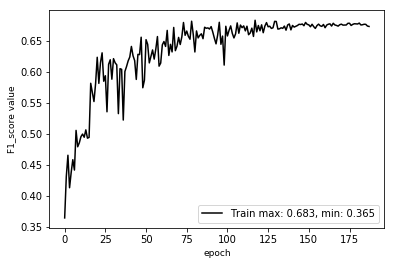

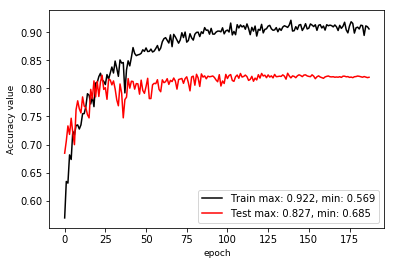

**** EPOCH 188 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.344727
accuracy: 0.908303
----
Overall accuracy：81.91  Average F1 score：67.22 
77.31 85.19 89.85 94.04 79.71 95.65 58.29 33.92 74.95 
64.17 74.85 92.85 53.16 12.54 91.17 61.81 53.06 84.58 
70.13 79.69 91.32 67.92 21.68 93.36 60.00 41.39 79.47 

learn rate: 0.000020
eval mean loss: 0.640560
eval accuracy: 0.819088
eval avg class acc: 0.653528


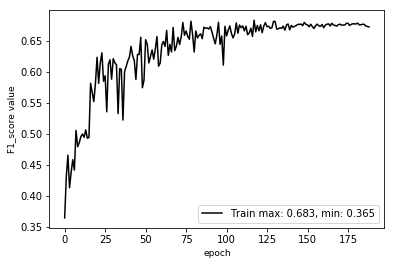

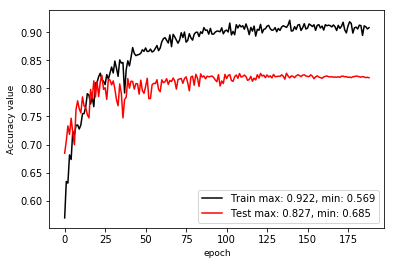

**** EPOCH 189 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.345460
accuracy: 0.918314
----
Overall accuracy：82.07  Average F1 score：67.39 
77.51 85.10 89.78 93.60 75.16 95.53 58.09 34.35 74.76 
64.33 75.26 92.91 54.42 13.00 91.48 61.89 51.02 85.08 
70.31 79.88 91.32 68.83 22.17 93.46 59.93 41.06 79.59 

learn rate: 0.000020
eval mean loss: 0.631821
eval accuracy: 0.820711
eval avg class acc: 0.654893


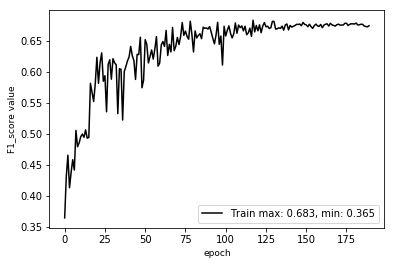

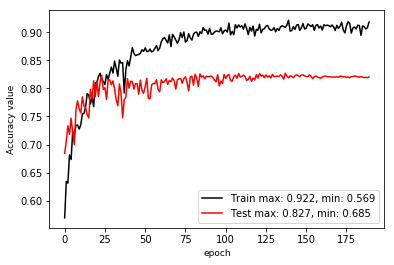

**** EPOCH 190 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.340622
accuracy: 0.909813
----
Overall accuracy：82.11  Average F1 score：67.60 
77.76 85.18 89.87 93.34 77.74 95.49 59.04 34.35 75.37 
64.67 74.99 92.84 54.83 13.08 91.74 61.49 52.76 84.75 
70.61 79.76 91.33 69.08 22.40 93.58 60.24 41.61 79.78 

learn rate: 0.000020
eval mean loss: 0.633149
eval accuracy: 0.821133
eval avg class acc: 0.656835


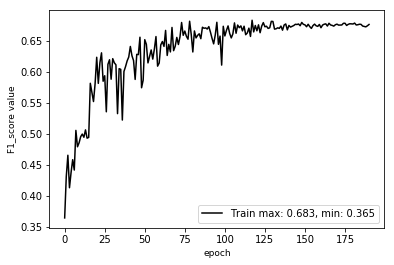

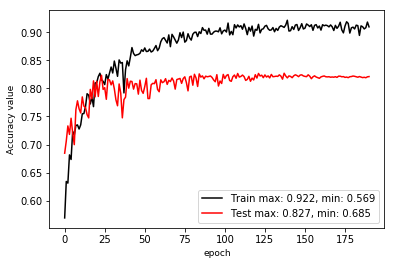

Model saved in file: log_wen_v16_sample8192_group2_lw14_F1_noheight/model.ckpt
**** EPOCH 191 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.351070
accuracy: 0.901527
----
Overall accuracy：82.07  Average F1 score：67.38 
78.28 84.84 90.25 95.02 75.94 95.71 58.06 34.11 75.09 
63.67 75.49 92.45 52.99 13.10 91.54 62.26 52.14 84.93 
70.22 79.90 91.33 68.04 22.34 93.58 60.09 41.24 79.71 

learn rate: 0.000020
eval mean loss: 0.629470
eval accuracy: 0.820720
eval avg class acc: 0.653957


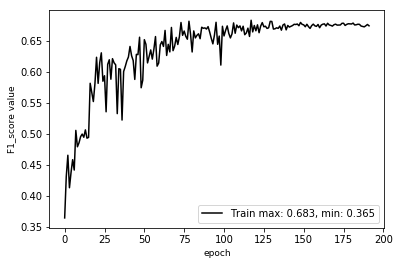

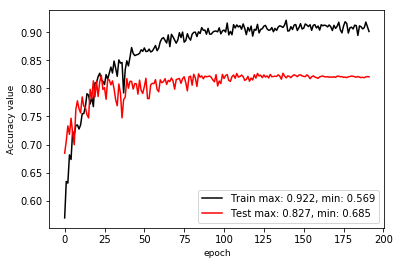

**** EPOCH 192 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.345040
accuracy: 0.911805
----
Overall accuracy：82.15  Average F1 score：67.44 
76.86 85.17 89.79 94.50 77.96 95.50 58.85 34.34 75.78 
65.33 75.14 92.87 53.29 12.58 91.89 61.59 52.88 84.53 
70.63 79.84 91.30 68.15 21.67 93.66 60.19 41.64 79.91 

learn rate: 0.000020
eval mean loss: 0.625567
eval accuracy: 0.821546
eval avg class acc: 0.655671


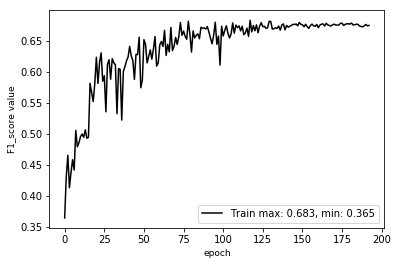

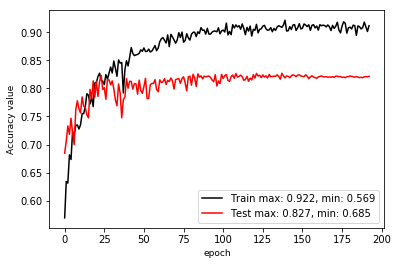

**** EPOCH 193 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.345698
accuracy: 0.915108
----
Overall accuracy：82.08  Average F1 score：67.38 
76.26 85.02 90.22 94.36 76.98 95.63 58.53 34.30 75.36 
65.33 75.50 92.58 53.24 12.71 91.38 61.16 53.58 84.61 
70.38 79.98 91.39 68.07 21.81 93.46 59.82 41.83 79.72 

learn rate: 0.000020
eval mean loss: 0.627475
eval accuracy: 0.820796
eval avg class acc: 0.655667


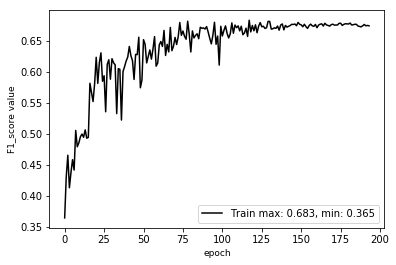

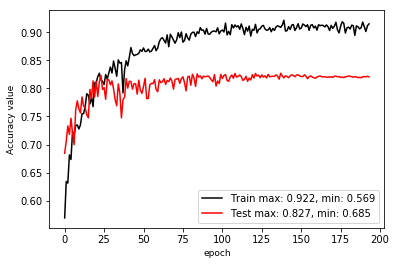

**** EPOCH 194 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.346261
accuracy: 0.914559
----
Overall accuracy：82.05  Average F1 score：67.51 
76.50 85.01 90.13 93.05 76.63 95.54 58.46 34.13 74.80 
65.67 75.37 92.61 55.58 12.99 91.54 60.86 51.80 84.96 
70.67 79.90 91.35 69.59 22.21 93.50 59.64 41.15 79.56 

learn rate: 0.000020
eval mean loss: 0.625694
eval accuracy: 0.820548
eval avg class acc: 0.657098


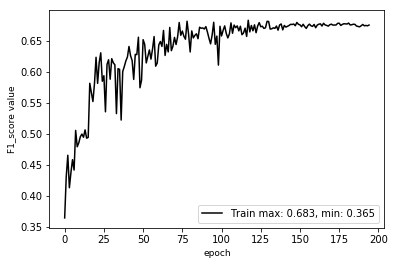

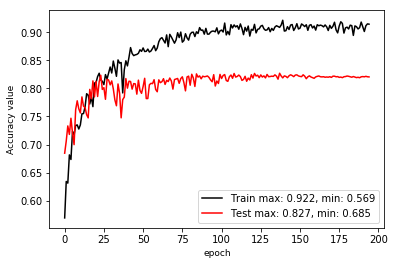

**** EPOCH 195 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.344320
accuracy: 0.913903
----
Overall accuracy：82.07  Average F1 score：67.50 
76.36 85.08 90.10 94.29 77.01 95.48 58.45 34.19 75.36 
65.67 75.21 92.65 54.29 13.14 91.71 60.83 52.94 84.52 
70.61 79.84 91.36 68.90 22.44 93.56 59.61 41.54 79.68 

learn rate: 0.000020
eval mean loss: 0.628408
eval accuracy: 0.820718
eval avg class acc: 0.656611


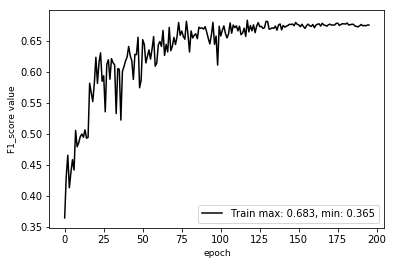

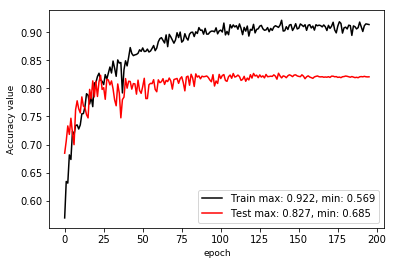

**** EPOCH 196 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.349013
accuracy: 0.909289
----
Overall accuracy：82.15  Average F1 score：67.65 
76.06 85.07 90.03 92.62 77.90 95.49 59.46 34.25 75.45 
65.67 75.12 92.70 56.18 12.92 91.92 60.68 52.72 84.79 
70.48 79.79 91.34 69.93 22.17 93.67 60.07 41.52 79.85 

learn rate: 0.000020
eval mean loss: 0.627741
eval accuracy: 0.821471
eval avg class acc: 0.658544


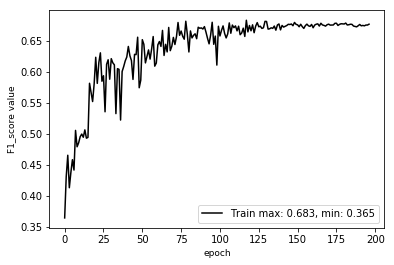

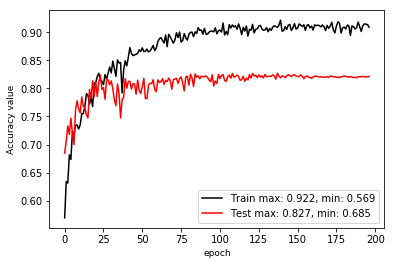

**** EPOCH 197 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.340037
accuracy: 0.902367
----
Overall accuracy：82.05  Average F1 score：67.57 
76.31 85.00 90.04 94.24 79.00 95.68 58.51 34.12 74.98 
68.17 75.29 92.65 53.86 12.83 91.47 61.12 52.37 84.96 
72.01 79.85 91.33 68.54 22.07 93.53 59.79 41.32 79.66 

learn rate: 0.000020
eval mean loss: 0.634025
eval accuracy: 0.820529
eval avg class acc: 0.658566


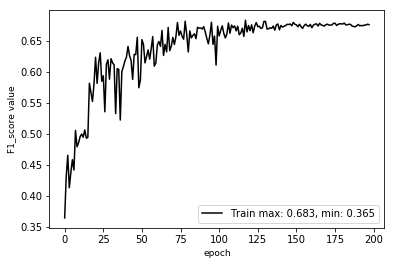

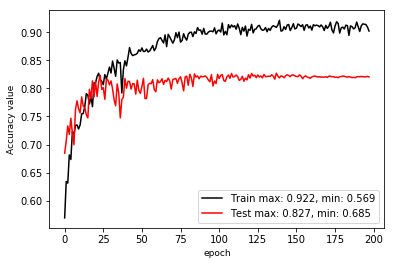

**** EPOCH 198 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.353329
accuracy: 0.914939
----
Overall accuracy：82.13  Average F1 score：67.58 
75.95 84.99 90.08 93.36 78.81 95.44 59.19 34.19 75.50 
66.83 75.12 92.59 54.96 12.62 91.95 61.05 52.60 84.85 
71.10 79.75 91.32 69.19 21.76 93.66 60.11 41.44 79.90 

learn rate: 0.000020
eval mean loss: 0.631681
eval accuracy: 0.821255
eval avg class acc: 0.658423


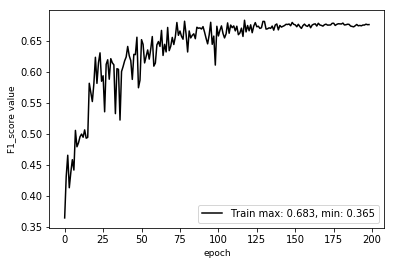

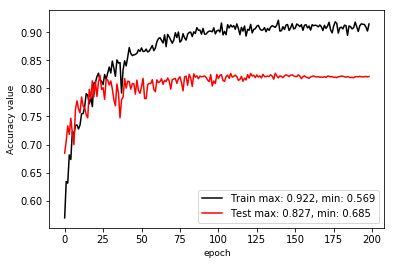

**** EPOCH 199 ****
----
Current batch/total batch num: 0/166
Current batch/total batch num: 83/166
learn rate: 0.000020
mean loss: 0.348692
accuracy: 0.905801
----
Overall accuracy：82.04  Average F1 score：67.59 
75.72 85.10 89.90 92.91 76.83 95.44 60.07 34.02 75.29 
66.00 74.98 92.73 55.80 13.04 91.75 60.12 52.91 84.54 
70.53 79.72 91.29 69.72 22.30 93.56 60.10 41.41 79.65 

learn rate: 0.000020
eval mean loss: 0.635362
eval accuracy: 0.820402
eval avg class acc: 0.657640


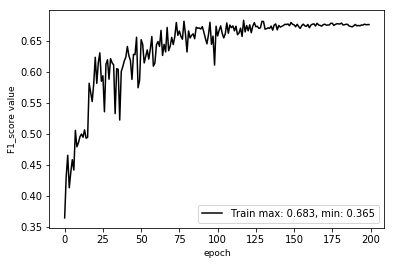

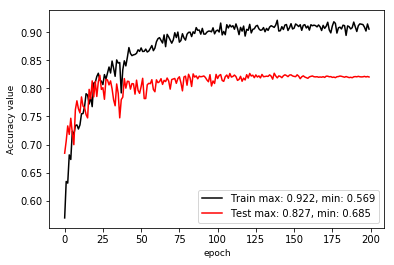

In [12]:
best_F1 = -1

for epoch in range(MAX_EPOCH):
    log_string('**** EPOCH %03d ****' % (epoch))
    sys.stdout.flush()

    train_loss, train_acc = train_one_epoch(sess, ops, train_writer)
    test_acc, test_F1 = eval_one_epoch_whole_scene(sess, ops, test_writer)

    train_acc_list.append(train_acc)
    test_acc_list.append(test_acc)

    test_F1_list.append(test_F1)

    
    drawF1Plot(test_F1_list, "F1_score")
    
    drawPlot(train_acc_list,test_acc_list,"Accuracy")

    # Save the variables to disk.
    
    if test_F1 > best_F1:
        best_F1 = test_F1
        save_path = saver.save(sess, os.path.join(LOG_DIR, "best_model_epoch_%03d.ckpt"%(epoch)))
        log_string("Model saved in file: %s" % save_path)
                
    if epoch % 10 == 0:
        save_path = saver.save(sess, os.path.join(LOG_DIR, "model.ckpt"))
        log_string("Model saved in file: %s" % save_path)

In [13]:
eval_one_epoch_whole_scene(sess, ops, test_writer)

----
Overall accuracy：82.04  Average F1 score：67.59 
75.72 85.10 89.90 92.91 76.83 95.44 60.07 34.02 75.29 
66.00 74.98 92.73 55.80 13.04 91.75 60.12 52.91 84.54 
70.53 79.72 91.29 69.72 22.30 93.56 60.10 41.41 79.65 

learn rate: 0.000020
eval mean loss: 0.635362
eval accuracy: 0.820402
eval avg class acc: 0.657640


(0.8204022, 0.67585766)

In [12]:
ops

{'pointclouds_pl': <tf.Tensor 'Placeholder:0' shape=(?, ?, 3) dtype=float32>,
 'labels_pl': <tf.Tensor 'Placeholder_1:0' shape=(?, ?) dtype=int32>,
 'feature_pl': <tf.Tensor 'Placeholder_3:0' shape=(?, ?, 1) dtype=float32>,
 'smpws_pl': <tf.Tensor 'Placeholder_2:0' shape=(?, ?) dtype=float32>,
 'is_training_pl': <tf.Tensor 'Placeholder_4:0' shape=() dtype=bool>,
 'pred': <tf.Tensor 'fc2/BiasAdd:0' shape=(?, ?, 9) dtype=float32>,
 'loss': <tf.Tensor 'sparse_softmax_cross_entropy_loss/value:0' shape=() dtype=float32>,
 'train_op': <tf.Operation 'Adam' type=AssignAdd>,
 'merged': <tf.Tensor 'Merge/MergeSummary:0' shape=() dtype=string>,
 'step': <tf.Variable 'Variable:0' shape=() dtype=int32_ref>,
 'learnrate': <tf.Tensor 'Maximum:0' shape=() dtype=float32>}

In [18]:
from keras import backend as K
K.clear_session()
save_path = saver.save(sess, os.path.join(LOG_DIR, "best_model_cleared.ckpt"))

Using TensorFlow backend.
